# OCR Clean Benchmarking

Creating a new file to deal with OCR proceessing only

### combining paddle and tesseract

In [1]:
#step 1:
from ultralytics import YOLO
from pathlib import Path
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import cv2
import numpy as np
import pandas as pd
import pytesseract
import random
import re
from collections import defaultdict
import time

# -------------------------
# Model Paths
# -------------------------
MODEL_A = Path("runs_dm/model2_tiles_regions_yolo8_albu_pixelonly3/weights/best.pt")
MODEL_B = Path("runs_dm/model2_tiles_regions2/weights/best.pt")
MODEL_C = Path("runs_dm_yolo11/model2_tiles_regions_yolo11_model_with_augmentations/weights/best.pt")
MODEL_D = Path("runs_dm_yolo11_s/model2_tiles_regions_yolo11_s_9millionparams_model_with_augmentations/weights/best.pt")

# -------------------------
# Test Tiles Directory
# -------------------------
TILES_BASE_DIR = Path(r"D:\DEAKIN Post Grad Data Science\MASTERS UNITS\DiscountMate_Clone\DiscountMate_new\YOLOv8 Model 1 Tile Detection\Production Benchmark Test").resolve()

# -------------------------
# Inference Parameters
# -------------------------
IMG_SIZE = 640
CONF_THRESHOLD = 0.25
IOU_THRESHOLD = 0.7
RANDOM_SAMPLES = 3       # Reduced from 10 to shorten output
MAX_CATALOGUES = 6        # NEW: Only process first N catalogues to limit output

# -------------------------
# Class name mapping for OCR
# -------------------------
CLASS_MAPPING = {
    'description_block': 'Name',
    'price_main': 'Price_Now',
    'product_image_block': None,
    'promo_text_block': 'Save_amount',
    'unit_price_block': 'UnitPrice'
}

print(f"Model A exists: {MODEL_A.exists()} (YOLOv8n Augmented - 2M params)")
print(f"Model B exists: {MODEL_B.exists()} (YOLOv8n Standard - 2M params)")
print(f"Model C exists: {MODEL_C.exists()} (YOLO11n Augmented - 2M params)")
print(f"Model D exists: {MODEL_D.exists()} (YOLO11s Augmented - 9M params)")
print(f"Tiles directory exists: {TILES_BASE_DIR.exists()}")
print(f"Settings: {RANDOM_SAMPLES} tiles/catalogue, max {MAX_CATALOGUES} catalogues")

import pytesseract
from pathlib import Path

tesseract_paths = [
    r"C:\Program Files\Tesseract-OCR\tesseract.exe",
    r"C:\Program Files (x86)\Tesseract-OCR\tesseract.exe",
    r"C:\Users\{}\AppData\Local\Programs\Tesseract-OCR\tesseract.exe".format(Path.home().name)
]

for tess_path in tesseract_paths:
    if Path(tess_path).exists():
        pytesseract.pytesseract.tesseract_cmd = tess_path
        print(f"SUCCESS: Tesseract found at {tess_path}")
        break
else:
    print("WARNING: Tesseract not found. Please install from:")
    print("  https://github.com/UB-Mannheim/tesseract/wiki")
    print("  Or set manually: pytesseract.pytesseract.tesseract_cmd = r'C:\\path\\to\\tesseract.exe'")

Model A exists: True (YOLOv8n Augmented - 2M params)
Model B exists: True (YOLOv8n Standard - 2M params)
Model C exists: True (YOLO11n Augmented - 2M params)
Model D exists: True (YOLO11s Augmented - 9M params)
Tiles directory exists: True
Settings: 3 tiles/catalogue, max 6 catalogues
SUCCESS: Tesseract found at C:\Program Files\Tesseract-OCR\tesseract.exe


In [2]:
# =========================================================================
# STEP 2: Load Models + Define OCR Functions
# =========================================================================
# CHANGES FROM LAST SESSION:
#   1. REMOVED _remove_circle_border() — was cutting off cents digits
#   2. Price uses ONLY zoned parser (connected component per-digit OCR)
#   3. Exhaustive Tesseract combos kept ONLY for description/promo/unit
#   4. Much faster — no more 40+ Tesseract calls per price crop
# =========================================================================

print("Loading models...")
#model_a = YOLO(str(MODEL_A))
model_b = YOLO(str(MODEL_B))

# -------------------------
# Storage
# -------------------------
timing_data = defaultdict(list)
ocr_attempt_log = []

# =========================================================================
# RETAILER EXTRACTION
# =========================================================================
KNOWN_RETAILERS = ['iga', 'woolworths', 'coles', 'aldi', 'metcash', 'foodland',
                   'drakes', 'costco', 'spar', 'bi-lo', 'bilo', 'friendly grocer',
                   'foodworks', 'ritchies', 'supabarn', 'harris farm']

def extract_retailer(catalogue_name):
    name_lower = catalogue_name.lower().replace('_', ' ').replace('-', ' ')
    for retailer in KNOWN_RETAILERS:
        if retailer in name_lower:
            return retailer.title()
    return "Unknown"

# =========================================================================
# IMAGE PREPROCESSING HELPERS
# =========================================================================

def _upscale_if_small(gray, min_height=60, min_width=80):
    h, w = gray.shape[:2]
    scale = 1.0
    if h < min_height:
        scale = max(scale, min_height / h)
    if w < min_width:
        scale = max(scale, min_width / w)
    if scale > 1.0:
        scale = min(scale, 4.0)
        gray = cv2.resize(gray, None, fx=scale, fy=scale, interpolation=cv2.INTER_CUBIC)
    return gray

def _add_border(img, border=15, color=255):
    return cv2.copyMakeBorder(img, border, border, border, border,
                              cv2.BORDER_CONSTANT, value=color)

# =========================================================================
# BLACK TEXT EXTRACTION — strips coloured backgrounds, keeps dark text
# =========================================================================

def _extract_black_text(crop_bgr, dark_thresh=80):
    """Extract only dark (black) pixels. Price text is almost always black."""
    if crop_bgr is None or crop_bgr.size == 0:
        return None
    if len(crop_bgr.shape) < 3:
        _, binary = cv2.threshold(crop_bgr, dark_thresh, 255, cv2.THRESH_BINARY_INV)
        return cv2.bitwise_not(binary)

    hsv = cv2.cvtColor(crop_bgr, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)
    gray = cv2.cvtColor(crop_bgr, cv2.COLOR_BGR2GRAY)

    text_mask = (v < 50) | ((v < dark_thresh) & (s < 100))
    result = np.full_like(gray, 255)
    result[text_mask] = 0
    return result

# =========================================================================
# NOTE: _remove_circle_border() has been REMOVED
# Reason: It crops to 72% of detected circle radius, which cuts off
# the superscript cents digits (e.g., the "75" in "$2.75").
# The zoned parser handles circle borders natively by filtering
# large blobs that span >90% of the image.
# =========================================================================

# =========================================================================
# ZONED PRICE PARSER — connected component per-digit OCR
# This is now the PRIMARY and ONLY price parser
# =========================================================================

def _zoned_price_parse(crop_bgr):
    """
    Split a price crop into spatial zones based on connected component analysis.
    
    AU retail price layout:
    ┌─────────────────────┐
    │  $  [BIG]  [small]  │   <- dollars (big) + cents (small superscript)
    │           [small]   │   <- 'ea' or 'each' (bottom-right, ignore)
    └─────────────────────┘
    
    Returns: (price_string, confidence_score) or (None, 0)
    """
    if crop_bgr is None or crop_bgr.size == 0:
        return None, 0
    
    if len(crop_bgr.shape) == 3:
        gray = cv2.cvtColor(crop_bgr, cv2.COLOR_BGR2GRAY)
    else:
        gray = crop_bgr.copy()
    
    gray = _upscale_if_small(gray, min_height=120, min_width=160)
    gray = cv2.GaussianBlur(gray, (3, 3), 0)
    _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(binary, connectivity=8)
    
    if num_labels < 2:
        return None, 0
    
    h_img, w_img = binary.shape
    
    # Step 1: Collect valid blobs (filter noise + circle border)
    blobs = []
    for i in range(1, num_labels):
        x, y, w, h, area = stats[i]
        cx, cy = centroids[i]
        if area < 50:
            continue
        if w > w_img * 0.9 and h > h_img * 0.9:
            continue  # Circle border itself
        if area < (h_img * w_img * 0.005):
            continue
        blobs.append({
            'label': i, 'x': x, 'y': y, 'w': w, 'h': h,
            'area': area, 'cx': cx, 'cy': cy,
            'aspect_ratio': w / max(h, 1), 'bottom': y + h
        })
    
    if not blobs:
        return None, 0
    
    # Step 2: Classify blobs by height
    heights = [b['h'] for b in blobs]
    max_height = max(heights)
    big_threshold = max_height * 0.55
    
    for b in blobs:
        b['is_big'] = b['h'] >= big_threshold
    
    big_blobs = sorted([b for b in blobs if b['is_big']], key=lambda b: b['cx'])
    small_blobs = [b for b in blobs if not b['is_big']]
    
    if not big_blobs:
        return None, 0
    
    # Step 3: Filter '$' sign (leftmost, narrower than digits)
    if len(big_blobs) > 1:
        first, second = big_blobs[0], big_blobs[1]
        if first['w'] < second['w'] * 0.7 and first['cx'] < second['cx']:
            big_blobs = big_blobs[1:]
    
    # Step 4: OCR each big blob individually
    dollar_digits = []
    for b in big_blobs:
        pad = 5
        bx1, by1 = max(0, b['x']-pad), max(0, b['y']-pad)
        bx2, by2 = min(w_img, b['x']+b['w']+pad), min(h_img, b['y']+b['h']+pad)
        
        blob_crop = cv2.bitwise_not(binary[by1:by2, bx1:bx2])
        blob_bordered = _add_border(blob_crop, border=10, color=255)
        
        try:
            digit_text = pytesseract.image_to_string(
                blob_bordered, config='--psm 10 -c tessedit_char_whitelist=0123456789$'
            ).strip()
        except Exception:
            digit_text = ""
        
        digit_text = digit_text.replace('$','').replace(' ','')
        digit_text = digit_text.replace('O','0').replace('o','0')
        digit_text = digit_text.replace('l','1').replace('I','1')
        digit_text = digit_text.replace('S','5').replace('s','5').replace('B','8')
        
        if digit_text and digit_text[0].isdigit():
            dollar_digits.append(digit_text[0])
    
    if not dollar_digits:
        return None, 0
    
    dollar_str = ''.join(dollar_digits)
    
    # Step 5: Identify cents (small blobs, top-right of big digits)
    last_big_right = max(b['x'] + b['w'] for b in big_blobs)
    big_vert_center = np.mean([b['cy'] for b in big_blobs])
    
    cents_blobs = []
    for b in small_blobs:
        if b['cx'] < last_big_right - (max_height * 0.3):
            continue
        if b['cy'] > big_vert_center + max_height * 0.1:
            continue  # Below center = 'ea' label, skip
        if b['area'] < max_height * 2:
            continue
        cents_blobs.append(b)
    
    cents_blobs.sort(key=lambda b: b['cx'])
    
    cents_digits = []
    for b in cents_blobs:
        pad = 5
        bx1, by1 = max(0, b['x']-pad), max(0, b['y']-pad)
        bx2, by2 = min(w_img, b['x']+b['w']+pad), min(h_img, b['y']+b['h']+pad)
        
        blob_crop = cv2.bitwise_not(binary[by1:by2, bx1:bx2])
        blob_bordered = _add_border(blob_crop, border=10, color=255)
        
        try:
            digit_text = pytesseract.image_to_string(
                blob_bordered, config='--psm 10 -c tessedit_char_whitelist=0123456789'
            ).strip()
        except Exception:
            digit_text = ""
        
        digit_text = digit_text.replace('O','0').replace('o','0')
        digit_text = digit_text.replace('l','1').replace('I','1')
        digit_text = digit_text.replace('S','5').replace('s','5')
        
        if digit_text and digit_text[0].isdigit():
            cents_digits.append(digit_text[0])
    
    # Step 6: Assemble price
    if len(cents_digits) >= 2:
        cents_str = ''.join(cents_digits[:2])
    elif len(cents_digits) == 1:
        cents_str = cents_digits[0] + '0'
    else:
        cents_str = '00'
    
    price_str = f"{dollar_str}.{cents_str}"
    
    try:
        val = float(price_str)
        if 0.01 <= val <= 999.99:
            return price_str, int(val * 100) + 3000
    except ValueError:
        pass
    
    return None, 0


def _zoned_price_parse_multi(crop_bgr):
    """
    Run zoned parser on raw crop AND black-text-extracted version.
    NO circle removal. Returns (best_price, best_score, method_name).
    """
    best_price, best_score, best_method = None, 0, "none"
    
    # Try on raw crop directly (no circle removal!)
    price, score = _zoned_price_parse(crop_bgr)
    if score > best_score:
        best_price, best_score, best_method = price, score, "zoned_raw"
    
    # Try on black text extraction (strips coloured background)
    black_text = _extract_black_text(crop_bgr)
    if black_text is not None:
        price2, score2 = _zoned_price_parse(black_text)
        if score2 > best_score:
            best_price, best_score, best_method = price2, score2, "zoned_black_text"
    
    return best_price, best_score, best_method

# =========================================================================
# SCORING / CLEANING HELPERS (for non-price fields)
# =========================================================================

def _clean_price_text(raw):
    text = raw.replace('O','0').replace('o','0')
    text = text.replace('l','1').replace('I','1').replace('|','1')
    text = text.replace('S','5').replace('s','5')
    text = text.replace('B','8').replace('D','0')
    text = text.replace(',', '.')
    text = re.sub(r'[^\d.cC¢$ eaEA]', '', text)
    return text

def _score_price(cleaned_text):
    """Fallback price scorer for standard Tesseract output."""
    if not cleaned_text:
        return None
    decimal_match = re.search(r'(\d+)\.(\d{2})', cleaned_text)
    if decimal_match:
        try:
            val = float(decimal_match.group())
            if 0.01 <= val <= 999.99:
                return (f"{val:.2f}", int(val * 100))
        except ValueError:
            pass
    digits_only = re.sub(r'\D', '', cleaned_text)
    if not digits_only:
        return None
    num = int(digits_only)
    if len(digits_only) == 3:
        val = num / 100
        if 0.50 <= val <= 99.99:
            return (f"{val:.2f}", 1000 + num)
    elif len(digits_only) == 4:
        val = num / 100
        if 1.00 <= val <= 999.99:
            return (f"{val:.2f}", 900 + num // 10)
    elif len(digits_only) == 1 and 1 <= num <= 9:
        return (f"{num}.00", 500 + num)
    elif len(digits_only) == 2 and 1 <= num <= 99:
        return (f"{num}.00", 400 + num)
    return None

def _score_description(raw_text):
    if not raw_text or len(raw_text.strip()) < 2:
        return None
    text = re.sub(r'\s+', ' ', raw_text.strip())
    alpha_chars = sum(1 for c in text if c.isalpha())
    if alpha_chars < 2:
        return None
    return (text, alpha_chars)

def smart_price_format(text):
    if not text:
        return text
    decimal_match = re.search(r'(\d+)\.(\d{2})', text)
    if decimal_match:
        return f"{decimal_match.group(1)}.{decimal_match.group(2)}"
    digits = re.sub(r'\D', '', text)
    if not digits:
        return text
    num = int(digits)
    if len(digits) == 1: return f"{num}.00"
    elif len(digits) == 2: return f"{num}.00"
    elif len(digits) == 3: return f"{num / 100:.2f}"
    elif len(digits) >= 4: return f"{num / 100:.2f}"
    return text

# =========================================================================
# PROMO / SAVE PARSER
# =========================================================================

def _parse_promo_save_amount(raw_text):
    if not raw_text:
        return None
    text = raw_text.upper().strip().replace('$', ' $ ').replace('\n', ' ')
    text = re.sub(r'\s+', ' ', text)
    text = text.replace('O','0').replace('o','0').replace('l','1').replace('I','1')
    
    save_match = re.search(r'SAVE\s*\$?\s*(\d+\.?\d*)', text)
    if save_match:
        try: return float(save_match.group(1))
        except ValueError: pass
    
    off_match = re.search(r'\$?\s*(\d+\.?\d*)\s*0FF', text)
    if off_match:
        try: return float(off_match.group(1))
        except ValueError: pass
    
    all_numbers = re.findall(r'\d+\.?\d*', text)
    if len(all_numbers) >= 2:
        try: return min(float(n) for n in all_numbers)
        except ValueError: pass
    elif len(all_numbers) == 1:
        try: return float(all_numbers[0])
        except ValueError: pass
    return None

# =========================================================================
# BINARY CANDIDATE GENERATOR (for non-price fields)
# =========================================================================

def _generate_binary_candidates(gray, black_text_binary=None):
    candidates = []
    if black_text_binary is not None:
        candidates.append(('black_text', black_text_binary))
        candidates.append(('black_text_inv', cv2.bitwise_not(black_text_binary)))
    _, otsu = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    candidates.append(('otsu', otsu))
    candidates.append(('otsu_inv', cv2.bitwise_not(otsu)))
    adaptive = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                      cv2.THRESH_BINARY, 31, 10)
    candidates.append(('adaptive', adaptive))
    candidates.append(('adaptive_inv', cv2.bitwise_not(adaptive)))
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    enhanced = clahe.apply(gray)
    _, clahe_otsu = cv2.threshold(enhanced, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    candidates.append(('clahe_otsu', clahe_otsu))
    candidates.append(('clahe_otsu_inv', cv2.bitwise_not(clahe_otsu)))
    return candidates

# =========================================================================
# PSM CONFIGS (for non-price fields only now)
# =========================================================================
PROMO_CONFIGS = [('psm6_text', '--psm 6'), ('psm7_text', '--psm 7')]
UNIT_CONFIGS = [('psm6_text', '--psm 6')]
DESC_CONFIGS = [('psm6_text', '--psm 6'), ('psm4_col', '--psm 4'), ('psm3_auto', '--psm 3')]

# =========================================================================
# MAIN OCR FUNCTION — zoned for price, exhaustive for everything else
# =========================================================================

def perform_ocr_exhaustive(crop_img, box_class, tile_name, catalogue_name, model_name):
    """
    Price: Zoned parser only (fast, accurate for superscript prices).
    Description/Promo/Unit: Multi-binary × multi-PSM exhaustive search.
    """
    global ocr_attempt_log

    if box_class == 'product_image_block':
        return "", "skipped"

    csv_field = CLASS_MAPPING.get(box_class, 'Unknown')

    # =================================================================
    # PRICE: Zoned parser only — NO circle removal, NO exhaustive search
    # =================================================================
    if box_class == 'price_main':
        best_price, best_score, best_method = _zoned_price_parse_multi(crop_img)
        
        ocr_attempt_log.append({
            'Catalogue': catalogue_name, 'Tile': tile_name,
            'Model': model_name, 'Field': csv_field, 'Class': box_class,
            'Binary_Method': best_method, 'PSM_Config': 'zoned_cc',
            'Full_Method': best_method,
            'Raw_OCR': f'[zoned] {best_price}',
            'Formatted': best_price or '', 'Score': best_score,
        })
        
        # If zoned parser failed, try a simple Tesseract fallback
        if not best_price or best_score == 0:
            if len(crop_img.shape) == 3:
                gray = cv2.cvtColor(crop_img, cv2.COLOR_BGR2GRAY)
            else:
                gray = crop_img.copy()
            gray = _upscale_if_small(gray, min_height=60, min_width=80)
            gray = cv2.fastNlMeansDenoising(gray, h=8)
            _, otsu = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
            bordered = _add_border(cv2.bitwise_not(otsu))
            
            try:
                raw = pytesseract.image_to_string(
                    bordered, config='--psm 7 -c tessedit_char_whitelist=0123456789.$cC'
                ).strip()
            except Exception:
                raw = ""
            
            if raw:
                cleaned = _clean_price_text(raw)
                result = _score_price(cleaned)
                if result and result[1] > best_score:
                    best_price, best_score = result
                    best_method = "fallback_psm7_otsu"
                    
                    ocr_attempt_log.append({
                        'Catalogue': catalogue_name, 'Tile': tile_name,
                        'Model': model_name, 'Field': csv_field, 'Class': box_class,
                        'Binary_Method': 'otsu', 'PSM_Config': 'psm7_fallback',
                        'Full_Method': best_method,
                        'Raw_OCR': raw[:100], 'Formatted': best_price or '',
                        'Score': best_score,
                    })
        
        return best_price or "", best_method

    # =================================================================
    # NON-PRICE: Exhaustive binary × PSM search
    # =================================================================
    if len(crop_img.shape) == 3:
        gray = cv2.cvtColor(crop_img, cv2.COLOR_BGR2GRAY)
    else:
        gray = crop_img.copy()

    gray = _upscale_if_small(gray, min_height=60, min_width=80)
    gray = cv2.fastNlMeansDenoising(gray, h=8)

    candidates = _generate_binary_candidates(gray)

    if box_class == 'promo_text_block':
        configs = PROMO_CONFIGS
        scorer = None
    elif box_class == 'unit_price_block':
        configs = UNIT_CONFIGS
        scorer = None
    else:  # description_block
        configs = DESC_CONFIGS
        scorer = _score_description

    best_text = ""
    best_score = -1
    best_method = "none"

    for bin_name, binary_img in candidates:
        bordered = _add_border(binary_img)
        for config_name, config_str in configs:
            method_name = f"{bin_name}+{config_name}"
            try:
                raw = pytesseract.image_to_string(bordered, config=config_str).strip()
            except Exception:
                raw = ""

            attempt_score = 0
            attempt_formatted = raw

            if box_class == 'promo_text_block' and raw:
                save_amt = _parse_promo_save_amount(raw)
                if save_amt is not None and save_amt > 0:
                    attempt_formatted = f"{save_amt:.2f}"
                    attempt_score = 1000 + int(save_amt * 100)
                else:
                    raw_clean = raw.replace('O','0').replace('l','1')
                    dollar_match = re.search(r'\$\s*(\d+\.?\d*)', raw_clean)
                    if dollar_match:
                        try:
                            val = float(dollar_match.group(1))
                            if val < 100:
                                attempt_formatted = f"{val:.2f}"
                                attempt_score = int(val * 100)
                        except ValueError:
                            pass

            elif box_class == 'unit_price_block' and raw:
                cleaned = raw.replace('O','0').replace('l','1').replace('|','1')
                cleaned = re.sub(r'[^\d.$/ a-zA-Z]', '', cleaned).strip()
                attempt_formatted = cleaned
                attempt_score = len(cleaned)

            elif scorer:
                result = scorer(raw)
                if result:
                    attempt_formatted, attempt_score = result

            ocr_attempt_log.append({
                'Catalogue': catalogue_name, 'Tile': tile_name,
                'Model': model_name, 'Field': csv_field, 'Class': box_class,
                'Binary_Method': bin_name, 'PSM_Config': config_name,
                'Full_Method': method_name, 'Raw_OCR': raw[:100],
                'Formatted': attempt_formatted[:50] if attempt_formatted else '',
                'Score': attempt_score,
            })

            if attempt_score > best_score:
                best_score = attempt_score
                best_text = attempt_formatted
                best_method = method_name

    # Clean description
    if box_class == 'description_block' and best_text:
        best_text = re.sub(r'\s+', ' ', best_text).strip()
        best_text = re.sub(r'^[^a-zA-Z0-9]+', '', best_text)
        best_text = re.sub(r'[^a-zA-Z0-9.!]+$', '', best_text)

    return best_text, best_method


# =========================================================================
# TILE PROCESSING + CATALOGUE LOADING
# =========================================================================

def get_catalogue_tiles(base_dir, num_samples=10, max_catalogues=None):
    catalogues = {}
    base_dir = Path(base_dir).resolve()
    count = 0
    for subfolder in sorted(base_dir.iterdir()):
        if not subfolder.is_dir():
            continue
        if max_catalogues is not None and count >= max_catalogues:
            break
        local_model_dir = (subfolder / "cropped_images" / "local_model").resolve()
        print(f"  Checking: {subfolder.name}")
        if local_model_dir.exists():
            all_tiles = []
            for ext in [".jpg", ".jpeg", ".png", ".webp"]:
                all_tiles.extend(local_model_dir.glob(f"*{ext}"))
            all_tiles = [f for f in all_tiles if f.is_file() and f.stat().st_size > 0]
            print(f"    Found {len(all_tiles)} valid images")
            if all_tiles:
                sample_size = min(num_samples, len(all_tiles))
                sampled_tiles = random.sample(all_tiles, sample_size)
                catalogues[subfolder.name] = sampled_tiles
                count += 1
                print(f"    Sampled {sample_size} tiles")
    return catalogues

def extract_numeric_price(text):
    if not text: return None
    text = text.strip().replace('$','').replace(',','')
    match = re.search(r'\d+\.?\d*', text)
    if match:
        try: return float(match.group())
        except: return None
    return None

def process_tile_with_models(tile_path, models_dict, catalogue_name):
    tile_img = cv2.imread(str(tile_path))
    if tile_img is None:
        print(f"    WARNING: Could not read {tile_path}")
        return {}
    tile_name = Path(tile_path).stem
    results = {}
    for model_name, model in models_dict.items():
        start_inference = time.perf_counter()
        result = model.predict(source=str(tile_path), imgsz=IMG_SIZE, conf=CONF_THRESHOLD,
                               iou=IOU_THRESHOLD, verbose=False)[0]
        inference_time = time.perf_counter() - start_inference

        start_crop_ocr = time.perf_counter()
        ocr_data = {}
        ocr_methods = {}
        num_boxes = 0

        if result.boxes is not None and len(result.boxes) > 0:
            xyxy = result.boxes.xyxy.cpu().numpy()
            conf = result.boxes.conf.cpu().numpy()
            cls = result.boxes.cls.cpu().numpy().astype(int)
            class_best = {}
            for idx, (box, c, k) in enumerate(zip(xyxy, conf, cls)):
                if k not in class_best or c > class_best[k][1]:
                    class_best[k] = (idx, c)
            num_boxes = len(class_best)
            for k, (best_idx, _) in class_best.items():
                x1, y1, x2, y2 = map(int, xyxy[best_idx])
                h_img, w_img = tile_img.shape[:2]
                x1, y1 = max(0, x1), max(0, y1)
                x2, y2 = min(w_img, x2), min(h_img, y2)
                class_name = model.names[k]
                csv_field = CLASS_MAPPING.get(class_name)
                if csv_field and (x2-x1) > 5 and (y2-y1) > 5:
                    crop = tile_img[y1:y2, x1:x2]
                    if crop.size > 0:
                        ocr_text, ocr_method = perform_ocr_exhaustive(
                            crop, class_name, tile_name, catalogue_name, model_name)
                        ocr_data[csv_field] = ocr_text
                        ocr_methods[csv_field] = ocr_method

        crop_ocr_time = time.perf_counter() - start_crop_ocr
        total_time = inference_time + crop_ocr_time
        results[model_name] = {
            'result': result, 'ocr_data': ocr_data, 'ocr_methods': ocr_methods,
            'inference_time': inference_time, 'crop_ocr_time': crop_ocr_time,
            'total_time': total_time, 'num_boxes': num_boxes
        }
    return results

def draw_boxes_with_labels(ax, result, model, color):
    if result.boxes is None or len(result.boxes) == 0: return
    xyxy = result.boxes.xyxy.cpu().numpy()
    conf = result.boxes.conf.cpu().numpy()
    cls = result.boxes.cls.cpu().numpy().astype(int)
    for (x1,y1,x2,y2), c, k in zip(xyxy, conf, cls):
        ax.add_patch(patches.Rectangle((x1,y1), x2-x1, y2-y1,
                     fill=False, edgecolor=color, linewidth=2))
        ax.text(x1, y1-5, f"{model.names[k][:10]} {c:.2f}",
                fontsize=7, color=color, weight='bold',
                bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=1))

print("SUCCESS: Step 2 complete")
print("  ✅ _remove_circle_border() REMOVED")
print("  ✅ Price: Zoned parser only (connected component per-digit OCR)")
print("  ✅ Description/Promo/Unit: Exhaustive binary×PSM search")
print("  ✅ Fallback Tesseract for price if zoned parser fails")

Loading models...
SUCCESS: Step 2 complete
  ✅ _remove_circle_border() REMOVED
  ✅ Price: Zoned parser only (connected component per-digit OCR)
  ✅ Description/Promo/Unit: Exhaustive binary×PSM search
  ✅ Fallback Tesseract for price if zoned parser fails


  Checking: coles-catalogue-august-20-26-2025-qld-metro
    Found 330 valid images
    Sampled 3 tiles
  Checking: coles-catalogue-february-18-25-2025-nsw-metro
    Found 336 valid images
    Sampled 3 tiles
  Checking: iga-catalogue-april-9-15-2025-vic-large-v2
    Found 303 valid images
    Sampled 3 tiles
  Checking: iga-catalogue-august-6-12-2025-sa-local-grocer
    Found 89 valid images
    Sampled 3 tiles
  Checking: weekly-specials-woolworths-catalogue-january-1-7-2025-vic
    Found 265 valid images
    Sampled 3 tiles
  Checking: weekly-specials-woolworths-catalogue-march-19-25-2025-wa
    Found 305 valid images
    Sampled 3 tiles
SUCCESS: Found 6 catalogue folders (capped at 6)
  - coles-catalogue-august-20-26-2025-qld-metro [Retailer: Coles]: 3 sampled tiles
  - coles-catalogue-february-18-25-2025-nsw-metro [Retailer: Coles]: 3 sampled tiles
  - iga-catalogue-april-9-15-2025-vic-large-v2 [Retailer: Iga]: 3 sampled tiles
  - iga-catalogue-august-6-12-2025-sa-local-grocer [Ret

TypeError: 'Axes' object is not subscriptable

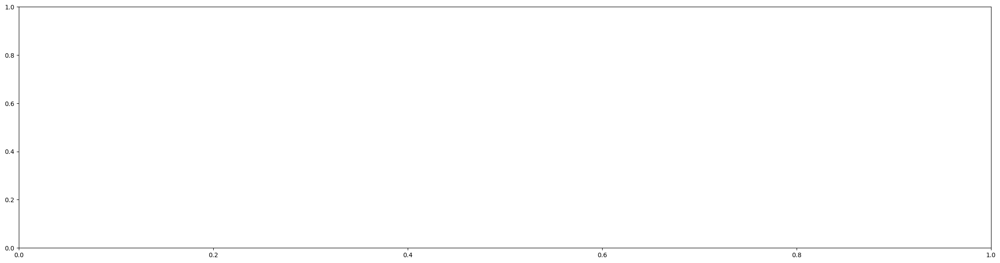

In [ ]:
#Step 3:
# -------------------------
# Collect Sample Tiles
# -------------------------
catalogues = get_catalogue_tiles(TILES_BASE_DIR, num_samples=RANDOM_SAMPLES, max_catalogues=MAX_CATALOGUES)

if not catalogues:
    print("WARNING: No catalogues found.")
else:
    print(f"SUCCESS: Found {len(catalogues)} catalogue folders (capped at {MAX_CATALOGUES})")
    for cat_name, tiles in catalogues.items():
        retailer = extract_retailer(cat_name)
        print(f"  - {cat_name} [Retailer: {retailer}]: {len(tiles)} sampled tiles")

# -------------------------
# Prepare Models Dictionary
# -------------------------
models_dict = {
  #  'Model_A_YOLOv8n_Aug_2M': model_a,
     'Model_B_YOLOv8n_Std_2M': model_b,
 #   'Model_C_YOLO11n_Aug_2M': model_c,
 #   'Model_D_YOLO11s_Aug_9M': model_d
}

# -------------------------
# CSV Data Storage
# -------------------------
csv_data = []

# -------------------------
# Process Each Catalogue
# -------------------------
total_tiles_count = sum(len(t) for t in catalogues.values())
processed = 0

for catalogue_name, tile_paths in catalogues.items():
    retailer = extract_retailer(catalogue_name)

    print(f"\n{'='*80}")
    print(f"Processing Catalogue: {catalogue_name} [Retailer: {retailer}]")
    print(f"{'='*80}\n")

    for tile_path in tile_paths:
        processed += 1
        tile_name = tile_path.stem
        print(f"  [{processed}/{total_tiles_count}] Processing tile: {tile_name}")

        tile_img = Image.open(tile_path).convert("RGB")

        all_results = process_tile_with_models(tile_path, models_dict, catalogue_name)

        if not all_results:
            print(f"    SKIPPED: Could not process tile")
            continue

        # -------------------------
        # Visualize
        # -------------------------
        fig, axs = plt.subplots(1, 4, figsize=(28, 7))
        colors = ['red', 'blue', 'green', 'magenta']
        model_names = list(models_dict.keys())

        for idx, (model_name, color) in enumerate(zip(model_names, colors)):
            axs[idx].imshow(tile_img)
            axs[idx].axis("off")

            result_data = all_results[model_name]
            result = result_data['result']
            ocr_data = result_data['ocr_data']
            ocr_methods = result_data['ocr_methods']
            total_time = result_data['total_time']
            inference_time = result_data['inference_time']
            crop_ocr_time = result_data['crop_ocr_time']
            num_boxes = result_data['num_boxes']

            model_obj = models_dict[model_name]
            draw_boxes_with_labels(axs[idx], result, model_obj, color)

            axs[idx].set_title(
                f"{model_name}\nBoxes: {num_boxes} | Time: {total_time:.3f}s\n"
                f"(Inf: {inference_time:.3f}s | OCR: {crop_ocr_time:.3f}s)",
                fontsize=9, weight='bold'
            )

            ocr_lines = []
            for k, v in ocr_data.items():
                method = ocr_methods.get(k, '?')
                ocr_lines.append(f"{k}: {v[:20]} [{method}]")
            ocr_text = "\n".join(ocr_lines) if ocr_lines else "No detections"

            axs[idx].text(
                0.5, -0.05, ocr_text,
                transform=axs[idx].transAxes,
                fontsize=7, ha='center', va='top',
                bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5)
            )

        fig.suptitle(f"[{retailer}] {catalogue_name} | Tile: {tile_name}",
                     fontsize=14, weight='bold', y=0.98)
        plt.tight_layout(rect=[0, 0.1, 1, 0.96])
        plt.show()

        # -------------------------
        # Store CSV Data
        # -------------------------
        for model_name, result_data in all_results.items():
            ocr_data = result_data['ocr_data']
            ocr_methods = result_data['ocr_methods']

            timing_data[model_name].append({
                'catalogue': catalogue_name,
                'tile': tile_name,
                'inference_time': result_data['inference_time'],
                'crop_ocr_time': result_data['crop_ocr_time'],
                'total_time': result_data['total_time'],
                'num_boxes': result_data['num_boxes']
            })

            price_was = ""
            if 'Price_Now' in ocr_data and 'Save_amount' in ocr_data:
                pn = extract_numeric_price(ocr_data['Price_Now'])
                sa = extract_numeric_price(ocr_data['Save_amount'])
                if pn is not None and sa is not None:
                    price_was = f"{pn + sa:.2f}"

            row = {
                'Retailer': retailer,
                'Catalogue': catalogue_name,
                'Tile': tile_name,
                'Model': model_name,
                'Name': ocr_data.get('Name', ''),
                'Price_Now': ocr_data.get('Price_Now', ''),
                'Save_amount': ocr_data.get('Save_amount', ''),
                'UnitPrice': ocr_data.get('UnitPrice', ''),
                'PriceWas': price_was,
                'OCR_Method_Name': ocr_methods.get('Name', ''),
                'OCR_Method_Price': ocr_methods.get('Price_Now', ''),
                'OCR_Method_Save': ocr_methods.get('Save_amount', ''),
                'OCR_Method_UnitPrice': ocr_methods.get('UnitPrice', ''),
                'Num_Boxes': result_data['num_boxes'],
                'Inference_Time_s': result_data['inference_time'],
                'Crop_OCR_Time_s': result_data['crop_ocr_time'],
                'Total_Time_s': result_data['total_time'],
            }
            csv_data.append(row)

        # Per-tile summary
        print(f"    Timing + Results:")
        for mn in models_dict.keys():
            rd = all_results[mn]
            p = rd['ocr_data'].get('Price_Now', '-')
            pm = rd['ocr_methods'].get('Price_Now', '?')
            print(f"      {mn}: {rd['total_time']:.3f}s | Price: {p} [{pm}]")

print(f"\n\n{'='*80}")
print(f"SUCCESS: Benchmark Complete — {processed} tiles × {len(models_dict)} models")
print(f"Total OCR attempts logged: {len(ocr_attempt_log)}")
print(f"{'='*80}")

# paddle and tesseract combined test

In [5]:
# =========================================================================
# STEP 2: Load Models + Define OCR Functions
# =========================================================================
# CHANGES:
#   1. REMOVED _remove_circle_border() — was cutting off cents digits
#   2. Price uses zoned parser (connected component per-digit OCR)
#   3. PaddleOCR added as additional OCR engine for ALL fields
#   4. Exhaustive Tesseract combos kept for description/promo/unit
#   5. PaddleOCR runs on raw crop + black-text-extracted version
#   6. Best result across ALL methods (zoned, Tesseract, PaddleOCR) wins
# =========================================================================

print("Loading models...")
#model_a = YOLO(str(MODEL_A))
model_b = YOLO(str(MODEL_B))


# -------------------------
# PaddleOCR Init
# -------------------------
from paddleocr import PaddleOCR

paddle_ocr = PaddleOCR(
    use_angle_cls=False,
    lang='en',
    show_log=False,
)
print("SUCCESS: PaddleOCR loaded")

# -------------------------
# Storage
# -------------------------
timing_data = defaultdict(list)
ocr_attempt_log = []

# =========================================================================
# RETAILER EXTRACTION
# =========================================================================
KNOWN_RETAILERS = ['iga', 'woolworths', 'coles', 'aldi', 'metcash', 'foodland',
                   'drakes', 'costco', 'spar', 'bi-lo', 'bilo', 'friendly grocer',
                   'foodworks', 'ritchies', 'supabarn', 'harris farm']

def extract_retailer(catalogue_name):
    name_lower = catalogue_name.lower().replace('_', ' ').replace('-', ' ')
    for retailer in KNOWN_RETAILERS:
        if retailer in name_lower:
            return retailer.title()
    return "Unknown"

# =========================================================================
# IMAGE PREPROCESSING HELPERS
# =========================================================================

def _upscale_if_small(gray, min_height=60, min_width=80):
    h, w = gray.shape[:2]
    scale = 1.0
    if h < min_height:
        scale = max(scale, min_height / h)
    if w < min_width:
        scale = max(scale, min_width / w)
    if scale > 1.0:
        scale = min(scale, 4.0)
        gray = cv2.resize(gray, None, fx=scale, fy=scale, interpolation=cv2.INTER_CUBIC)
    return gray

def _add_border(img, border=15, color=255):
    return cv2.copyMakeBorder(img, border, border, border, border,
                              cv2.BORDER_CONSTANT, value=color)

# =========================================================================
# BLACK TEXT EXTRACTION
# =========================================================================

def _extract_black_text(crop_bgr, dark_thresh=80):
    if crop_bgr is None or crop_bgr.size == 0:
        return None
    if len(crop_bgr.shape) < 3:
        _, binary = cv2.threshold(crop_bgr, dark_thresh, 255, cv2.THRESH_BINARY_INV)
        return cv2.bitwise_not(binary)
    hsv = cv2.cvtColor(crop_bgr, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)
    gray = cv2.cvtColor(crop_bgr, cv2.COLOR_BGR2GRAY)
    text_mask = (v < 50) | ((v < dark_thresh) & (s < 100))
    result = np.full_like(gray, 255)
    result[text_mask] = 0
    return result

# =========================================================================
# PADDLEOCR WRAPPER
# =========================================================================

def _paddle_ocr_crop(crop_bgr):
    """
    Run PaddleOCR on a BGR crop. Returns list of (text, confidence) tuples
    sorted left-to-right, top-to-bottom.
    """
    if crop_bgr is None or crop_bgr.size == 0:
        return []
    
    # PaddleOCR expects BGR numpy array (which cv2.imread gives)
    # If grayscale, convert to BGR
    if len(crop_bgr.shape) == 2:
        crop_bgr = cv2.cvtColor(crop_bgr, cv2.COLOR_GRAY2BGR)
    
    try:
        result = paddle_ocr.ocr(crop_bgr, cls=False)
    except Exception:
        return []
    
    if not result or not result[0]:
        return []
    
    detections = []
    for line in result[0]:
        bbox = line[0]
        text, conf = line[1]
        # Use top-left y then x for sorting
        y_center = (bbox[0][1] + bbox[2][1]) / 2
        x_center = (bbox[0][0] + bbox[2][0]) / 2
        detections.append({
            'text': text.strip(),
            'conf': conf,
            'bbox': bbox,
            'cx': x_center,
            'cy': y_center,
        })
    
    # Sort top-to-bottom, then left-to-right
    detections.sort(key=lambda d: (d['cy'], d['cx']))
    return detections


def _paddle_extract_price(crop_bgr):
    """
    Use PaddleOCR to read a price crop. Tries raw crop + black text version.
    Returns (price_string, score, method_name) or (None, 0, "none").
    """
    best_price, best_score, best_method = None, 0, "none"
    
    for label, img in [("paddle_raw", crop_bgr), ("paddle_black_text", _extract_black_text(crop_bgr))]:
        if img is None:
            continue
        
        detections = _paddle_ocr_crop(img)
        if not detections:
            continue
        
        # Concatenate all detected text
        all_text = ' '.join(d['text'] for d in detections)
        avg_conf = np.mean([d['conf'] for d in detections]) if detections else 0
        
        # Clean OCR misreads
        cleaned = all_text.replace('$', '').replace(',', '.').replace(' ', '')
        cleaned = cleaned.replace('O', '0').replace('o', '0')
        cleaned = cleaned.replace('l', '1').replace('I', '1')
        cleaned = cleaned.replace('S', '5').replace('s', '5')
        cleaned = cleaned.replace('B', '8')
        
        # Remove trailing 'ea', 'each', 'pk' etc
        cleaned = re.sub(r'[a-zA-Z]+$', '', cleaned).strip()
        
        # Try to extract a decimal price directly
        decimal_match = re.search(r'(\d+)\.(\d{2})', cleaned)
        if decimal_match:
            try:
                val = float(decimal_match.group())
                if 0.01 <= val <= 999.99:
                    score = int(val * 100) + 4000  # PaddleOCR gets highest base score
                    if score > best_score:
                        best_price = f"{val:.2f}"
                        best_score = score
                        best_method = label
            except ValueError:
                pass
        
        # Try space-separated pattern: "2 75" -> "2.75"
        if not best_price:
            space_match = re.search(r'(\d{1,3})\s+(\d{2})\b', all_text.replace('$', ''))
            if space_match:
                try:
                    val = float(f"{space_match.group(1)}.{space_match.group(2)}")
                    if 0.01 <= val <= 999.99:
                        score = int(val * 100) + 3800
                        if score > best_score:
                            best_price = f"{val:.2f}"
                            best_score = score
                            best_method = label
                except ValueError:
                    pass
        
        # Try pure digit string: "275" -> "2.75"
        if not best_price:
            digits_only = re.sub(r'\D', '', cleaned)
            if digits_only:
                num = int(digits_only)
                if len(digits_only) == 3:
                    val = num / 100
                    if 0.50 <= val <= 99.99:
                        score = int(val * 100) + 3500
                        if score > best_score:
                            best_price = f"{val:.2f}"
                            best_score = score
                            best_method = label
                elif len(digits_only) == 4:
                    val = num / 100
                    if 1.00 <= val <= 999.99:
                        score = int(val * 100) + 3500
                        if score > best_score:
                            best_price = f"{val:.2f}"
                            best_score = score
                            best_method = label
                elif len(digits_only) in [1, 2]:
                    if 1 <= num <= 99:
                        score = num + 3000
                        if score > best_score:
                            best_price = f"{num}.00"
                            best_score = score
                            best_method = label
    
    return best_price, best_score, best_method


def _paddle_extract_text(crop_bgr):
    """
    Use PaddleOCR to read a description/promo/unit crop.
    Returns (text, score, method_name).
    """
    best_text, best_score, best_method = "", -1, "none"
    
    for label, img in [("paddle_raw", crop_bgr), ("paddle_black_text", _extract_black_text(crop_bgr))]:
        if img is None:
            continue
        
        detections = _paddle_ocr_crop(img)
        if not detections:
            continue
        
        all_text = ' '.join(d['text'] for d in detections)
        all_text = re.sub(r'\s+', ' ', all_text).strip()
        
        alpha_chars = sum(1 for c in all_text if c.isalpha())
        score = alpha_chars + 5000  # Base score higher than Tesseract
        
        if score > best_score:
            best_text = all_text
            best_score = score
            best_method = label
    
    return best_text, best_score, best_method


def _paddle_extract_promo(crop_bgr):
    """
    Use PaddleOCR to read a promo/save crop.
    Returns (save_amount_string, score, method_name).
    """
    best_text, best_score, best_method = "", 0, "none"
    
    for label, img in [("paddle_raw", crop_bgr), ("paddle_black_text", _extract_black_text(crop_bgr))]:
        if img is None:
            continue
        
        detections = _paddle_ocr_crop(img)
        if not detections:
            continue
        
        all_text = ' '.join(d['text'] for d in detections)
        
        save_amt = _parse_promo_save_amount(all_text)
        if save_amt is not None and save_amt > 0:
            score = 5000 + int(save_amt * 100)
            if score > best_score:
                best_text = f"{save_amt:.2f}"
                best_score = score
                best_method = label
        elif not best_text:
            # Fallback: return raw text
            cleaned = all_text.strip()
            if cleaned:
                best_text = cleaned
                best_score = len(cleaned)
                best_method = label
    
    return best_text, best_score, best_method


def _paddle_extract_unit(crop_bgr):
    """
    Use PaddleOCR to read a unit price crop.
    Returns (unit_price_string, score, method_name).
    """
    best_text, best_score, best_method = "", -1, "none"
    
    for label, img in [("paddle_raw", crop_bgr), ("paddle_black_text", _extract_black_text(crop_bgr))]:
        if img is None:
            continue
        
        detections = _paddle_ocr_crop(img)
        if not detections:
            continue
        
        all_text = ' '.join(d['text'] for d in detections)
        all_text = re.sub(r'[^\d.$/ a-zA-Z]', '', all_text).strip()
        
        score = len(all_text) + 5000
        if score > best_score:
            best_text = all_text
            best_score = score
            best_method = label
    
    return best_text, best_score, best_method

# =========================================================================
# ZONED PRICE PARSER — connected component per-digit OCR
# =========================================================================

def _zoned_price_parse(crop_bgr):
    if crop_bgr is None or crop_bgr.size == 0:
        return None, 0
    
    if len(crop_bgr.shape) == 3:
        gray = cv2.cvtColor(crop_bgr, cv2.COLOR_BGR2GRAY)
    else:
        gray = crop_bgr.copy()
    
    gray = _upscale_if_small(gray, min_height=120, min_width=160)
    gray = cv2.GaussianBlur(gray, (3, 3), 0)
    _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(binary, connectivity=8)
    
    if num_labels < 2:
        return None, 0
    
    h_img, w_img = binary.shape
    
    blobs = []
    for i in range(1, num_labels):
        x, y, w, h, area = stats[i]
        cx, cy = centroids[i]
        if area < 50:
            continue
        if w > w_img * 0.9 and h > h_img * 0.9:
            continue
        if area < (h_img * w_img * 0.005):
            continue
        blobs.append({
            'label': i, 'x': x, 'y': y, 'w': w, 'h': h,
            'area': area, 'cx': cx, 'cy': cy,
            'aspect_ratio': w / max(h, 1), 'bottom': y + h
        })
    
    if not blobs:
        return None, 0
    
    heights = [b['h'] for b in blobs]
    max_height = max(heights)
    big_threshold = max_height * 0.55
    
    for b in blobs:
        b['is_big'] = b['h'] >= big_threshold
    
    big_blobs = sorted([b for b in blobs if b['is_big']], key=lambda b: b['cx'])
    small_blobs = [b for b in blobs if not b['is_big']]
    
    if not big_blobs:
        return None, 0
    
    if len(big_blobs) > 1:
        first, second = big_blobs[0], big_blobs[1]
        if first['w'] < second['w'] * 0.7 and first['cx'] < second['cx']:
            big_blobs = big_blobs[1:]
    
    dollar_digits = []
    for b in big_blobs:
        pad = 5
        bx1, by1 = max(0, b['x']-pad), max(0, b['y']-pad)
        bx2, by2 = min(w_img, b['x']+b['w']+pad), min(h_img, b['y']+b['h']+pad)
        
        blob_crop = cv2.bitwise_not(binary[by1:by2, bx1:bx2])
        blob_bordered = _add_border(blob_crop, border=10, color=255)
        
        try:
            digit_text = pytesseract.image_to_string(
                blob_bordered, config='--psm 10 -c tessedit_char_whitelist=0123456789$'
            ).strip()
        except Exception:
            digit_text = ""
        
        digit_text = digit_text.replace('$','').replace(' ','')
        digit_text = digit_text.replace('O','0').replace('o','0')
        digit_text = digit_text.replace('l','1').replace('I','1')
        digit_text = digit_text.replace('S','5').replace('s','5').replace('B','8')
        
        if digit_text and digit_text[0].isdigit():
            dollar_digits.append(digit_text[0])
    
    if not dollar_digits:
        return None, 0
    
    dollar_str = ''.join(dollar_digits)
    
    last_big_right = max(b['x'] + b['w'] for b in big_blobs)
    big_vert_center = np.mean([b['cy'] for b in big_blobs])
    
    cents_blobs = []
    for b in small_blobs:
        if b['cx'] < last_big_right - (max_height * 0.3):
            continue
        if b['cy'] > big_vert_center + max_height * 0.1:
            continue
        if b['area'] < max_height * 2:
            continue
        cents_blobs.append(b)
    
    cents_blobs.sort(key=lambda b: b['cx'])
    
    cents_digits = []
    for b in cents_blobs:
        pad = 5
        bx1, by1 = max(0, b['x']-pad), max(0, b['y']-pad)
        bx2, by2 = min(w_img, b['x']+b['w']+pad), min(h_img, b['y']+b['h']+pad)
        
        blob_crop = cv2.bitwise_not(binary[by1:by2, bx1:bx2])
        blob_bordered = _add_border(blob_crop, border=10, color=255)
        
        try:
            digit_text = pytesseract.image_to_string(
                blob_bordered, config='--psm 10 -c tessedit_char_whitelist=0123456789'
            ).strip()
        except Exception:
            digit_text = ""
        
        digit_text = digit_text.replace('O','0').replace('o','0')
        digit_text = digit_text.replace('l','1').replace('I','1')
        digit_text = digit_text.replace('S','5').replace('s','5')
        
        if digit_text and digit_text[0].isdigit():
            cents_digits.append(digit_text[0])
    
    if len(cents_digits) >= 2:
        cents_str = ''.join(cents_digits[:2])
    elif len(cents_digits) == 1:
        cents_str = cents_digits[0] + '0'
    else:
        cents_str = '00'
    
    price_str = f"{dollar_str}.{cents_str}"
    
    try:
        val = float(price_str)
        if 0.01 <= val <= 999.99:
            return price_str, int(val * 100) + 3000
    except ValueError:
        pass
    
    return None, 0


def _zoned_price_parse_multi(crop_bgr):
    best_price, best_score, best_method = None, 0, "none"
    
    price, score = _zoned_price_parse(crop_bgr)
    if score > best_score:
        best_price, best_score, best_method = price, score, "zoned_raw"
    
    black_text = _extract_black_text(crop_bgr)
    if black_text is not None:
        price2, score2 = _zoned_price_parse(black_text)
        if score2 > best_score:
            best_price, best_score, best_method = price2, score2, "zoned_black_text"
    
    return best_price, best_score, best_method

# =========================================================================
# SCORING / CLEANING HELPERS
# =========================================================================

def _clean_price_text(raw):
    text = raw.replace('O','0').replace('o','0')
    text = text.replace('l','1').replace('I','1').replace('|','1')
    text = text.replace('S','5').replace('s','5')
    text = text.replace('B','8').replace('D','0')
    text = text.replace(',', '.')
    text = re.sub(r'[^\d.cC¢$ eaEA]', '', text)
    return text

def _score_price(cleaned_text):
    if not cleaned_text:
        return None
    decimal_match = re.search(r'(\d+)\.(\d{2})', cleaned_text)
    if decimal_match:
        try:
            val = float(decimal_match.group())
            if 0.01 <= val <= 999.99:
                return (f"{val:.2f}", int(val * 100))
        except ValueError:
            pass
    digits_only = re.sub(r'\D', '', cleaned_text)
    if not digits_only:
        return None
    num = int(digits_only)
    if len(digits_only) == 3:
        val = num / 100
        if 0.50 <= val <= 99.99:
            return (f"{val:.2f}", 1000 + num)
    elif len(digits_only) == 4:
        val = num / 100
        if 1.00 <= val <= 999.99:
            return (f"{val:.2f}", 900 + num // 10)
    elif len(digits_only) == 1 and 1 <= num <= 9:
        return (f"{num}.00", 500 + num)
    elif len(digits_only) == 2 and 1 <= num <= 99:
        return (f"{num}.00", 400 + num)
    return None

def _score_description(raw_text):
    if not raw_text or len(raw_text.strip()) < 2:
        return None
    text = re.sub(r'\s+', ' ', raw_text.strip())
    alpha_chars = sum(1 for c in text if c.isalpha())
    if alpha_chars < 2:
        return None
    return (text, alpha_chars)

def smart_price_format(text):
    if not text:
        return text
    decimal_match = re.search(r'(\d+)\.(\d{2})', text)
    if decimal_match:
        return f"{decimal_match.group(1)}.{decimal_match.group(2)}"
    digits = re.sub(r'\D', '', text)
    if not digits:
        return text
    num = int(digits)
    if len(digits) == 1: return f"{num}.00"
    elif len(digits) == 2: return f"{num}.00"
    elif len(digits) == 3: return f"{num / 100:.2f}"
    elif len(digits) >= 4: return f"{num / 100:.2f}"
    return text

# =========================================================================
# PROMO / SAVE PARSER
# =========================================================================

def _parse_promo_save_amount(raw_text):
    if not raw_text:
        return None
    text = raw_text.upper().strip().replace('$', ' $ ').replace('\n', ' ')
    text = re.sub(r'\s+', ' ', text)
    text = text.replace('O','0').replace('o','0').replace('l','1').replace('I','1')
    
    save_match = re.search(r'SAVE\s*\$?\s*(\d+\.?\d*)', text)
    if save_match:
        try: return float(save_match.group(1))
        except ValueError: pass
    
    off_match = re.search(r'\$?\s*(\d+\.?\d*)\s*0FF', text)
    if off_match:
        try: return float(off_match.group(1))
        except ValueError: pass
    
    all_numbers = re.findall(r'\d+\.?\d*', text)
    if len(all_numbers) >= 2:
        try: return min(float(n) for n in all_numbers)
        except ValueError: pass
    elif len(all_numbers) == 1:
        try: return float(all_numbers[0])
        except ValueError: pass
    return None

# =========================================================================
# BINARY CANDIDATE GENERATOR (for Tesseract non-price fields)
# =========================================================================

def _generate_binary_candidates(gray, black_text_binary=None):
    candidates = []
    if black_text_binary is not None:
        candidates.append(('black_text', black_text_binary))
        candidates.append(('black_text_inv', cv2.bitwise_not(black_text_binary)))
    _, otsu = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    candidates.append(('otsu', otsu))
    candidates.append(('otsu_inv', cv2.bitwise_not(otsu)))
    adaptive = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                      cv2.THRESH_BINARY, 31, 10)
    candidates.append(('adaptive', adaptive))
    candidates.append(('adaptive_inv', cv2.bitwise_not(adaptive)))
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    enhanced = clahe.apply(gray)
    _, clahe_otsu = cv2.threshold(enhanced, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    candidates.append(('clahe_otsu', clahe_otsu))
    candidates.append(('clahe_otsu_inv', cv2.bitwise_not(clahe_otsu)))
    return candidates

# =========================================================================
# PSM CONFIGS (for Tesseract non-price fields)
# =========================================================================
PROMO_CONFIGS = [('psm6_text', '--psm 6'), ('psm7_text', '--psm 7')]
UNIT_CONFIGS = [('psm6_text', '--psm 6')]
DESC_CONFIGS = [('psm6_text', '--psm 6'), ('psm4_col', '--psm 4'), ('psm3_auto', '--psm 3')]

# =========================================================================
# MAIN OCR FUNCTION — zoned + PaddleOCR for price, exhaustive + Paddle for rest
# =========================================================================

def perform_ocr_exhaustive(crop_img, box_class, tile_name, catalogue_name, model_name):
    """
    Price: Zoned parser + PaddleOCR + Tesseract fallback. Best score wins.
    Description/Promo/Unit: Tesseract exhaustive + PaddleOCR. Best score wins.
    
    Returns: (best_text, best_method_name, all_attempts_dict)
      all_attempts_dict = {method_name: (formatted_text, score)} for every method tried
    """
    global ocr_attempt_log

    if box_class == 'product_image_block':
        return "", "skipped", {}

    csv_field = CLASS_MAPPING.get(box_class, 'Unknown')
    all_attempts = {}  # {method: (text, score)} — for per-tile reporting

    # =================================================================
    # PRICE
    # =================================================================
    if box_class == 'price_main':
        best_price, best_score, best_method = None, 0, "none"
        
        # --- Zoned parser ---
        zoned_price, zoned_score, zoned_method = _zoned_price_parse_multi(crop_img)
        if zoned_price:
            all_attempts[zoned_method] = (zoned_price, zoned_score)
            if zoned_score > best_score:
                best_price, best_score, best_method = zoned_price, zoned_score, zoned_method
        
        ocr_attempt_log.append({
            'Catalogue': catalogue_name, 'Tile': tile_name,
            'Model': model_name, 'Field': csv_field, 'Class': box_class,
            'Binary_Method': zoned_method, 'PSM_Config': 'zoned_cc',
            'Full_Method': zoned_method,
            'Raw_OCR': f'[zoned] {zoned_price}',
            'Formatted': zoned_price or '', 'Score': zoned_score,
        })
        
        # --- PaddleOCR ---
        paddle_price, paddle_score, paddle_method = _paddle_extract_price(crop_img)
        if paddle_price:
            paddle_method_full = f"paddle_{paddle_method}"
            all_attempts[paddle_method_full] = (paddle_price, paddle_score)
            if paddle_score > best_score:
                best_price, best_score, best_method = paddle_price, paddle_score, paddle_method_full
        
        ocr_attempt_log.append({
            'Catalogue': catalogue_name, 'Tile': tile_name,
            'Model': model_name, 'Field': csv_field, 'Class': box_class,
            'Binary_Method': paddle_method, 'PSM_Config': 'paddleocr',
            'Full_Method': f"paddle_{paddle_method}",
            'Raw_OCR': f'[paddle] {paddle_price}',
            'Formatted': paddle_price or '', 'Score': paddle_score,
        })
        
        # --- Tesseract fallback (if both zoned + paddle failed) ---
        if not best_price or best_score == 0:
            if len(crop_img.shape) == 3:
                gray = cv2.cvtColor(crop_img, cv2.COLOR_BGR2GRAY)
            else:
                gray = crop_img.copy()
            gray = _upscale_if_small(gray, min_height=60, min_width=80)
            gray = cv2.fastNlMeansDenoising(gray, h=8)
            _, otsu = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
            bordered = _add_border(cv2.bitwise_not(otsu))
            
            try:
                raw = pytesseract.image_to_string(
                    bordered, config='--psm 7 -c tessedit_char_whitelist=0123456789.$cC'
                ).strip()
            except Exception:
                raw = ""
            
            if raw:
                cleaned = _clean_price_text(raw)
                result = _score_price(cleaned)
                if result and result[1] > best_score:
                    best_price, best_score = result
                    best_method = "tess_fallback_psm7"
                    all_attempts[best_method] = (best_price, best_score)
                    
                    ocr_attempt_log.append({
                        'Catalogue': catalogue_name, 'Tile': tile_name,
                        'Model': model_name, 'Field': csv_field, 'Class': box_class,
                        'Binary_Method': 'otsu', 'PSM_Config': 'psm7_fallback',
                        'Full_Method': best_method,
                        'Raw_OCR': raw[:100], 'Formatted': best_price or '',
                        'Score': best_score,
                    })
        
        return best_price or "", best_method, all_attempts

    # =================================================================
    # NON-PRICE: Exhaustive Tesseract + PaddleOCR
    # =================================================================
    if len(crop_img.shape) == 3:
        gray = cv2.cvtColor(crop_img, cv2.COLOR_BGR2GRAY)
    else:
        gray = crop_img.copy()

    gray = _upscale_if_small(gray, min_height=60, min_width=80)
    gray = cv2.fastNlMeansDenoising(gray, h=8)

    candidates = _generate_binary_candidates(gray)

    if box_class == 'promo_text_block':
        configs = PROMO_CONFIGS
        scorer = None
    elif box_class == 'unit_price_block':
        configs = UNIT_CONFIGS
        scorer = None
    else:
        configs = DESC_CONFIGS
        scorer = _score_description

    best_text = ""
    best_score = -1
    best_method = "none"

    # --- Tesseract exhaustive ---
    for bin_name, binary_img in candidates:
        bordered = _add_border(binary_img)
        for config_name, config_str in configs:
            method_name = f"{bin_name}+{config_name}"
            try:
                raw = pytesseract.image_to_string(bordered, config=config_str).strip()
            except Exception:
                raw = ""

            attempt_score = 0
            attempt_formatted = raw

            if box_class == 'promo_text_block' and raw:
                save_amt = _parse_promo_save_amount(raw)
                if save_amt is not None and save_amt > 0:
                    attempt_formatted = f"{save_amt:.2f}"
                    attempt_score = 1000 + int(save_amt * 100)
                else:
                    raw_clean = raw.replace('O','0').replace('l','1')
                    dollar_match = re.search(r'\$\s*(\d+\.?\d*)', raw_clean)
                    if dollar_match:
                        try:
                            val = float(dollar_match.group(1))
                            if val < 100:
                                attempt_formatted = f"{val:.2f}"
                                attempt_score = int(val * 100)
                        except ValueError:
                            pass

            elif box_class == 'unit_price_block' and raw:
                cleaned = raw.replace('O','0').replace('l','1').replace('|','1')
                cleaned = re.sub(r'[^\d.$/ a-zA-Z]', '', cleaned).strip()
                attempt_formatted = cleaned
                attempt_score = len(cleaned)

            elif scorer:
                result = scorer(raw)
                if result:
                    attempt_formatted, attempt_score = result

            if attempt_score > 0:
                all_attempts[method_name] = (attempt_formatted, attempt_score)

            ocr_attempt_log.append({
                'Catalogue': catalogue_name, 'Tile': tile_name,
                'Model': model_name, 'Field': csv_field, 'Class': box_class,
                'Binary_Method': bin_name, 'PSM_Config': config_name,
                'Full_Method': method_name, 'Raw_OCR': raw[:100],
                'Formatted': attempt_formatted[:50] if attempt_formatted else '',
                'Score': attempt_score,
            })

            if attempt_score > best_score:
                best_score = attempt_score
                best_text = attempt_formatted
                best_method = method_name

    # --- PaddleOCR ---
    if box_class == 'description_block':
        paddle_text, paddle_score, paddle_method = _paddle_extract_text(crop_img)
    elif box_class == 'promo_text_block':
        paddle_text, paddle_score, paddle_method = _paddle_extract_promo(crop_img)
    elif box_class == 'unit_price_block':
        paddle_text, paddle_score, paddle_method = _paddle_extract_unit(crop_img)
    else:
        paddle_text, paddle_score, paddle_method = "", 0, "none"
    
    if paddle_text:
        paddle_method_full = f"paddle_{paddle_method}"
        all_attempts[paddle_method_full] = (paddle_text, paddle_score)
        
        ocr_attempt_log.append({
            'Catalogue': catalogue_name, 'Tile': tile_name,
            'Model': model_name, 'Field': csv_field, 'Class': box_class,
            'Binary_Method': paddle_method, 'PSM_Config': 'paddleocr',
            'Full_Method': paddle_method_full,
            'Raw_OCR': f'[paddle] {paddle_text[:80]}',
            'Formatted': paddle_text[:50], 'Score': paddle_score,
        })
        
        if paddle_score > best_score:
            best_score = paddle_score
            best_text = paddle_text
            best_method = paddle_method_full

    # Clean description
    if box_class == 'description_block' and best_text:
        best_text = re.sub(r'\s+', ' ', best_text).strip()
        best_text = re.sub(r'^[^a-zA-Z0-9]+', '', best_text)
        best_text = re.sub(r'[^a-zA-Z0-9.!]+$', '', best_text)

    return best_text, best_method, all_attempts


# =========================================================================
# TILE PROCESSING + CATALOGUE LOADING
# =========================================================================

def get_catalogue_tiles(base_dir, num_samples=10, max_catalogues=None):
    catalogues = {}
    base_dir = Path(base_dir).resolve()
    count = 0
    for subfolder in sorted(base_dir.iterdir()):
        if not subfolder.is_dir():
            continue
        if max_catalogues is not None and count >= max_catalogues:
            break
        local_model_dir = (subfolder / "cropped_images" / "local_model").resolve()
        print(f"  Checking: {subfolder.name}")
        if local_model_dir.exists():
            all_tiles = []
            for ext in [".jpg", ".jpeg", ".png", ".webp"]:
                all_tiles.extend(local_model_dir.glob(f"*{ext}"))
            all_tiles = [f for f in all_tiles if f.is_file() and f.stat().st_size > 0]
            print(f"    Found {len(all_tiles)} valid images")
            if all_tiles:
                sample_size = min(num_samples, len(all_tiles))
                sampled_tiles = random.sample(all_tiles, sample_size)
                catalogues[subfolder.name] = sampled_tiles
                count += 1
                print(f"    Sampled {sample_size} tiles")
    return catalogues

def extract_numeric_price(text):
    if not text: return None
    text = text.strip().replace('$','').replace(',','')
    match = re.search(r'\d+\.?\d*', text)
    if match:
        try: return float(match.group())
        except: return None
    return None

def process_tile_with_models(tile_path, models_dict, catalogue_name):
    tile_img = cv2.imread(str(tile_path))
    if tile_img is None:
        print(f"    WARNING: Could not read {tile_path}")
        return {}
    tile_name = Path(tile_path).stem
    results = {}
    for model_name, model in models_dict.items():
        start_inference = time.perf_counter()
        result = model.predict(source=str(tile_path), imgsz=IMG_SIZE, conf=CONF_THRESHOLD,
                               iou=IOU_THRESHOLD, verbose=False)[0]
        inference_time = time.perf_counter() - start_inference

        start_crop_ocr = time.perf_counter()
        ocr_data = {}
        ocr_methods = {}
        ocr_all_attempts = {}  # {field: {method: (text, score)}}
        num_boxes = 0

        if result.boxes is not None and len(result.boxes) > 0:
            xyxy = result.boxes.xyxy.cpu().numpy()
            conf = result.boxes.conf.cpu().numpy()
            cls = result.boxes.cls.cpu().numpy().astype(int)
            class_best = {}
            for idx, (box, c, k) in enumerate(zip(xyxy, conf, cls)):
                if k not in class_best or c > class_best[k][1]:
                    class_best[k] = (idx, c)
            num_boxes = len(class_best)
            for k, (best_idx, _) in class_best.items():
                x1, y1, x2, y2 = map(int, xyxy[best_idx])
                h_img, w_img = tile_img.shape[:2]
                x1, y1 = max(0, x1), max(0, y1)
                x2, y2 = min(w_img, x2), min(h_img, y2)
                class_name = model.names[k]
                csv_field = CLASS_MAPPING.get(class_name)
                if csv_field and (x2-x1) > 5 and (y2-y1) > 5:
                    crop = tile_img[y1:y2, x1:x2]
                    if crop.size > 0:
                        ocr_text, ocr_method, attempts = perform_ocr_exhaustive(
                            crop, class_name, tile_name, catalogue_name, model_name)
                        ocr_data[csv_field] = ocr_text
                        ocr_methods[csv_field] = ocr_method
                        ocr_all_attempts[csv_field] = attempts

        crop_ocr_time = time.perf_counter() - start_crop_ocr
        total_time = inference_time + crop_ocr_time
        results[model_name] = {
            'result': result, 'ocr_data': ocr_data, 'ocr_methods': ocr_methods,
            'ocr_all_attempts': ocr_all_attempts,
            'inference_time': inference_time, 'crop_ocr_time': crop_ocr_time,
            'total_time': total_time, 'num_boxes': num_boxes
        }
    return results

def draw_boxes_with_labels(ax, result, model, color):
    if result.boxes is None or len(result.boxes) == 0: return
    xyxy = result.boxes.xyxy.cpu().numpy()
    conf = result.boxes.conf.cpu().numpy()
    cls = result.boxes.cls.cpu().numpy().astype(int)
    for (x1,y1,x2,y2), c, k in zip(xyxy, conf, cls):
        ax.add_patch(patches.Rectangle((x1,y1), x2-x1, y2-y1,
                     fill=False, edgecolor=color, linewidth=2))
        ax.text(x1, y1-5, f"{model.names[k][:10]} {c:.2f}",
                fontsize=7, color=color, weight='bold',
                bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=1))

print("SUCCESS: Step 2 complete")
print("  ✅ _remove_circle_border() REMOVED")
print("  ✅ Price: Zoned parser + PaddleOCR + Tesseract fallback")
print("  ✅ Description/Promo/Unit: Exhaustive Tesseract + PaddleOCR")
print("  ✅ PaddleOCR runs on raw crop + black-text-extracted version")
print("  ✅ All attempts tracked per field for comparison reporting")

Loading models...


d:\DEAKIN Post Grad Data Science\MASTERS UNITS\DiscountMate_Clone\DiscountMate_new\.venv\lib\site-packages\requests\__init__.py:113: RequestsDependencyWarning: urllib3 (2.5.0) or chardet (6.0.0.post1)/charset_normalizer (3.4.4) doesn't match a supported version!
  warnings.warn(


SUCCESS: PaddleOCR loaded
SUCCESS: Step 2 complete
  ✅ _remove_circle_border() REMOVED
  ✅ Price: Zoned parser + PaddleOCR + Tesseract fallback
  ✅ Description/Promo/Unit: Exhaustive Tesseract + PaddleOCR
  ✅ PaddleOCR runs on raw crop + black-text-extracted version
  ✅ All attempts tracked per field for comparison reporting


In [ ]:
#step 4:
# -------------------------
# Create DataFrame and Save
# -------------------------
df = pd.DataFrame(csv_data)

# Reorder columns
column_order = ['Catalogue', 'Tile', 'Model', 'Name', 'Price_Now', 'Save_amount', 'PriceWas', 
                'UnitPrice', 'Num_Boxes', 'Inference_Time_s', 'Crop_OCR_Time_s', 'Total_Time_s']
df = df[column_order]

# Save to CSV
output_csv = Path("model2_benchmark_results.csv")
df.to_csv(output_csv, index=False, encoding='utf-8-sig')

print(f"SUCCESS: CSV saved to {output_csv.absolute()}")
print(f"Total rows: {len(df)}")
print(f"\nFirst 10 rows preview:")
print(df.head(10))

# -------------------------
# Summary Statistics
# -------------------------
print(f"\n{'='*80}")
print("SUMMARY STATISTICS")
print(f"{'='*80}")

for model_name in df['Model'].unique():
    model_df = df[df['Model'] == model_name]
    
    # Count non-empty extractions
    name_count = (model_df['Name'] != '').sum()
    price_count = (model_df['Price_Now'] != '').sum()
    save_count = (model_df['Save_amount'] != '').sum()
    unit_count = (model_df['UnitPrice'] != '').sum()
    pricewas_count = (model_df['PriceWas'] != '').sum()
    
    # Timing statistics
    avg_inference = model_df['Inference_Time_s'].mean()
    avg_crop_ocr = model_df['Crop_OCR_Time_s'].mean()
    avg_total = model_df['Total_Time_s'].mean()
    total_time_all = model_df['Total_Time_s'].sum()
    avg_boxes = model_df['Num_Boxes'].mean()
    
    total_tiles = len(model_df)
    
    print(f"\n{model_name}:")
    print(f"  Total tiles processed: {total_tiles}")
    print(f"  Name extracted: {name_count} ({name_count/total_tiles*100:.1f}%)")
    print(f"  Price_Now extracted: {price_count} ({price_count/total_tiles*100:.1f}%)")
    print(f"  Save_amount extracted: {save_count} ({save_count/total_tiles*100:.1f}%)")
    print(f"  UnitPrice extracted: {unit_count} ({unit_count/total_tiles*100:.1f}%)")
    print(f"  PriceWas calculated: {pricewas_count} ({pricewas_count/total_tiles*100:.1f}%)")
    print(f"  ---")
    print(f"  Average boxes per tile: {avg_boxes:.2f}")
    print(f"  Average inference time: {avg_inference:.3f}s")
    print(f"  Average crop+OCR time: {avg_crop_ocr:.3f}s")
    print(f"  Average total time/tile: {avg_total:.3f}s")
    print(f"  Total processing time: {total_time_all:.2f}s")

print(f"\n{'='*80}")
print("BENCHMARK COMPLETE - CSV READY FOR ANALYSIS")
print(f"{'='*80}")

--------
new steps and callable functions

In [10]:
# =========================================================================
# STEP 3: run_benchmark() — callable function, run after any Step 2 change
# =========================================================================

def run_benchmark(models_dict=None, tiles_base_dir=TILES_BASE_DIR,
                  num_samples=RANDOM_SAMPLES, max_catalogues=MAX_CATALOGUES,
                  show_plots=True, show_comparison_table=True):
    """
    Run the full OCR benchmark. Call this after defining/updating Step 2.
    Returns (csv_data_list, ocr_attempt_log_list) so Step 4 can save them.
    """

    if models_dict is None:
        models_dict = DEFAULT_MODELS_DICT
    global timing_data, ocr_attempt_log
    timing_data = defaultdict(list)
    ocr_attempt_log = []

    catalogues = get_catalogue_tiles(tiles_base_dir, num_samples=num_samples,
                                      max_catalogues=max_catalogues)
    if not catalogues:
        print("WARNING: No catalogues found.")
        return [], []

    print(f"SUCCESS: Found {len(catalogues)} catalogue folders (capped at {max_catalogues})")
    for cat_name, tiles in catalogues.items():
        retailer = extract_retailer(cat_name)
        print(f"  - {cat_name} [Retailer: {retailer}]: {len(tiles)} sampled tiles")

    csv_data = []
    total_tiles_count = sum(len(t) for t in catalogues.values())
    processed = 0

    for catalogue_name, tile_paths in catalogues.items():
        retailer = extract_retailer(catalogue_name)
        print(f"\n{'='*80}")
        print(f"Processing Catalogue: {catalogue_name} [Retailer: {retailer}]")
        print(f"{'='*80}\n")

        for tile_path in tile_paths:
            processed += 1
            tile_name = tile_path.stem
            print(f"\n  [{processed}/{total_tiles_count}] Processing tile: {tile_name}")

            tile_img = Image.open(tile_path).convert("RGB")
            all_results = process_tile_with_models(tile_path, models_dict, catalogue_name)

            if not all_results:
                print(f"    SKIPPED: Could not process tile")
                continue

            # === Visualization ===
            if show_plots:
                model_name = list(models_dict.keys())[0]
                rd = all_results[model_name]

                fig, ax = plt.subplots(1, 1, figsize=(10, 10))
                ax.imshow(tile_img)
                ax.axis("off")
                draw_boxes_with_labels(ax, rd['result'], models_dict[model_name], 'red')

                ocr_lines = []
                for field in ['Name', 'Price_Now', 'Save_amount', 'UnitPrice']:
                    val = rd['ocr_data'].get(field, '')
                    method = rd['ocr_methods'].get(field, '-')
                    if val:
                        ocr_lines.append(f"{field}: {val[:35]}  [{method}]")
                ocr_summary = "\n".join(ocr_lines) if ocr_lines else "No detections"

                ax.set_title(
                    f"[{retailer}] {catalogue_name}\nTile: {tile_name} | {model_name}\n"
                    f"Boxes: {rd['num_boxes']} | Inf: {rd['inference_time']:.3f}s | "
                    f"OCR: {rd['crop_ocr_time']:.3f}s | Total: {rd['total_time']:.3f}s",
                    fontsize=10, weight='bold')
                ax.text(0.5, -0.02, ocr_summary, transform=ax.transAxes,
                        fontsize=8, ha='center', va='top', fontfamily='monospace',
                        bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.7))
                plt.tight_layout(rect=[0, 0.05, 1, 0.97])
                plt.show()

            # === Comparison table ===
            if show_comparison_table:
                model_name = list(models_dict.keys())[0]
                rd = all_results[model_name]
                print(f"\n    {'─'*75}")
                print(f"    OCR RESULTS FOR TILE: {tile_name}")
                print(f"    Model: {model_name} | Boxes: {rd['num_boxes']}")
                print(f"    {'─'*75}")

                for field in ['Name', 'Price_Now', 'Save_amount', 'UnitPrice']:
                    winner_text = rd['ocr_data'].get(field, '')
                    winner_method = rd['ocr_methods'].get(field, '-')
                    attempts = rd.get('ocr_all_attempts', {}).get(field, {})

                    if not winner_text and not attempts:
                        print(f"\n    [{field}] — NOT DETECTED")
                        continue

                    print(f"\n    [{field}]")
                    print(f"    ★ WINNER: '{winner_text}' via [{winner_method}]")

                    if attempts:
                        sorted_attempts = sorted(attempts.items(), key=lambda x: x[1][1], reverse=True)
                        print(f"    {'Method':<35} {'Result':<25} {'Score':>8}")
                        print(f"    {'─'*70}")
                        for method, (text, score) in sorted_attempts[:8]:
                            marker = " ★" if method == winner_method else ""
                            print(f"    {method:<35} {str(text)[:24]:<25} {score:>8}{marker}")

                        paddle_m = {m: v for m, v in sorted_attempts if 'paddle' in m.lower()}
                        tess_m = {m: v for m, v in sorted_attempts if 'paddle' not in m.lower()}
                        if paddle_m and tess_m:
                            bp = max(paddle_m.items(), key=lambda x: x[1][1])
                            bt = max(tess_m.items(), key=lambda x: x[1][1])
                            if bp[1][0] != bt[1][0]:
                                print(f"    ⚠ DISAGREE: Paddle='{bp[1][0]}' vs Tess='{bt[1][0]}'")
                            else:
                                print(f"    ✅ AGREE: Both → '{bp[1][0]}'")

                print(f"\n    {'─'*75}")
                print(f"    TIMING: Inf={rd['inference_time']:.3f}s | OCR={rd['crop_ocr_time']:.3f}s | Total={rd['total_time']:.3f}s")

            # === Store CSV rows ===
            for mn, rd in all_results.items():
                od = rd['ocr_data']
                om = rd['ocr_methods']
                timing_data[mn].append({
                    'catalogue': catalogue_name, 'tile': tile_name,
                    'inference_time': rd['inference_time'],
                    'crop_ocr_time': rd['crop_ocr_time'],
                    'total_time': rd['total_time'],
                    'num_boxes': rd['num_boxes']
                })
                price_was = ""
                if 'Price_Now' in od and 'Save_amount' in od:
                    pn = extract_numeric_price(od['Price_Now'])
                    sa = extract_numeric_price(od['Save_amount'])
                    if pn is not None and sa is not None:
                        price_was = f"{pn + sa:.2f}"

                csv_data.append({
                    'Retailer': retailer, 'Catalogue': catalogue_name,
                    'Tile': tile_name, 'Model': mn,
                    'Name': od.get('Name', ''), 'Price_Now': od.get('Price_Now', ''),
                    'Save_amount': od.get('Save_amount', ''),
                    'UnitPrice': od.get('UnitPrice', ''), 'PriceWas': price_was,
                    'OCR_Method_Name': om.get('Name', ''),
                    'OCR_Method_Price': om.get('Price_Now', ''),
                    'OCR_Method_Save': om.get('Save_amount', ''),
                    'OCR_Method_UnitPrice': om.get('UnitPrice', ''),
                    'Num_Boxes': rd['num_boxes'],
                    'Inference_Time_s': rd['inference_time'],
                    'Crop_OCR_Time_s': rd['crop_ocr_time'],
                    'Total_Time_s': rd['total_time'],
                })

    print(f"\n\n{'='*80}")
    print(f"SUCCESS: Benchmark Complete — {processed} tiles × {len(models_dict)} models")
    print(f"Total OCR attempts logged: {len(ocr_attempt_log)}")
    print(f"{'='*80}")

    return csv_data, ocr_attempt_log

print("SUCCESS: run_benchmark() defined — call it in a cell below")

SUCCESS: run_benchmark() defined — call it in a cell below


In [11]:
# =========================================================================
# STEP 4: save_results() — callable function
# =========================================================================

def save_results(csv_data, ocr_attempt_log=None, output_name="model2_benchmark_results"):
    """Save benchmark results to CSV and print summary statistics."""
    df = pd.DataFrame(csv_data)

    column_order = [
        'Retailer', 'Catalogue', 'Tile', 'Model',
        'Name', 'Price_Now', 'Save_amount', 'PriceWas', 'UnitPrice',
        'OCR_Method_Name', 'OCR_Method_Price', 'OCR_Method_Save', 'OCR_Method_UnitPrice',
        'Num_Boxes', 'Inference_Time_s', 'Crop_OCR_Time_s', 'Total_Time_s'
    ]
    # Only keep columns that exist
    column_order = [c for c in column_order if c in df.columns]
    df = df[column_order]

    output_csv = Path(f"{output_name}.csv")
    df.to_csv(output_csv, index=False, encoding='utf-8-sig')
    print(f"SUCCESS: CSV saved to {output_csv.absolute()} ({len(df)} rows)")

    if ocr_attempt_log:
        df_attempts = pd.DataFrame(ocr_attempt_log)
        attempts_csv = Path(f"{output_name}_attempts.csv")
        df_attempts.to_csv(attempts_csv, index=False, encoding='utf-8-sig')
        print(f"SUCCESS: Attempt log saved to {attempts_csv.absolute()} ({len(df_attempts)} rows)")

    print(f"\nFirst 10 rows:")
    print(df.head(10).to_string())

    # Summary
    print(f"\n{'='*80}")
    print("SUMMARY STATISTICS")
    print(f"{'='*80}")

    for model_name in df['Model'].unique():
        mdf = df[df['Model'] == model_name]
        total = len(mdf)
        name_c = (mdf['Name'] != '').sum()
        price_c = (mdf['Price_Now'] != '').sum()
        save_c = (mdf['Save_amount'] != '').sum()
        unit_c = (mdf['UnitPrice'] != '').sum()
        pw_c = (mdf['PriceWas'] != '').sum()

        print(f"\n{model_name}: ({total} tiles)")
        print(f"  Name: {name_c} ({name_c/total*100:.0f}%) | "
              f"Price: {price_c} ({price_c/total*100:.0f}%) | "
              f"Save: {save_c} ({save_c/total*100:.0f}%) | "
              f"Unit: {unit_c} ({unit_c/total*100:.0f}%) | "
              f"PriceWas: {pw_c} ({pw_c/total*100:.0f}%)")
        print(f"  Avg boxes: {mdf['Num_Boxes'].mean():.1f} | "
              f"Avg time: {mdf['Total_Time_s'].mean():.2f}s | "
              f"Total: {mdf['Total_Time_s'].sum():.1f}s")

    print(f"\n{'='*80}")
    return df

print("SUCCESS: save_results() defined")

SUCCESS: save_results() defined


## step 2 new functions 

In [12]:
# =========================================================================
# STEP 2: Load Models + Define OCR Functions (v3 — improved preprocessing)
# =========================================================================

print("Loading models...")
model_b = YOLO(str(MODEL_B))

try:
    model_c = YOLO(str(MODEL_C))
except Exception as e:
    print(f"WARNING: Model C load failed: {e}")
    model_c = model_b

try:
    model_d = YOLO(str(MODEL_D))
except Exception as e:
    print(f"WARNING: Model D load failed: {e}")
    model_d = model_b

print("SUCCESS: Models loaded")

# -------------------------
# PaddleOCR Init
# -------------------------
from paddleocr import PaddleOCR

paddle_ocr = PaddleOCR(
    use_angle_cls=False,
    lang='en',
    show_log=False,
)
print("SUCCESS: PaddleOCR loaded")

# -------------------------
# Storage
# -------------------------
timing_data = defaultdict(list)
ocr_attempt_log = []

# =========================================================================
# RETAILER EXTRACTION
# =========================================================================
KNOWN_RETAILERS = ['iga', 'woolworths', 'coles', 'aldi', 'metcash', 'foodland',
                   'drakes', 'costco', 'spar', 'bi-lo', 'bilo', 'friendly grocer',
                   'foodworks', 'ritchies', 'supabarn', 'harris farm']

def extract_retailer(catalogue_name):
    name_lower = catalogue_name.lower().replace('_', ' ').replace('-', ' ')
    for retailer in KNOWN_RETAILERS:
        if retailer in name_lower:
            return retailer.title()
    return "Unknown"

# =========================================================================
# IMAGE PREPROCESSING HELPERS
# =========================================================================

def _upscale_if_small(gray, min_height=60, min_width=80):
    h, w = gray.shape[:2]
    scale = 1.0
    if h < min_height:
        scale = max(scale, min_height / h)
    if w < min_width:
        scale = max(scale, min_width / w)
    if scale > 1.0:
        scale = min(scale, 4.0)
        gray = cv2.resize(gray, None, fx=scale, fy=scale, interpolation=cv2.INTER_CUBIC)
    return gray

def _add_border(img, border=15, color=255):
    return cv2.copyMakeBorder(img, border, border, border, border,
                              cv2.BORDER_CONSTANT, value=color)

def _sharpen(gray):
    """Apply unsharp mask to make edges crisper before binarization."""
    blurred = cv2.GaussianBlur(gray, (0, 0), 3)
    return cv2.addWeighted(gray, 1.5, blurred, -0.5, 0)

# =========================================================================
# BLACK TEXT EXTRACTION — two thresholds for different backgrounds
# =========================================================================

def _extract_black_text(crop_bgr, dark_thresh=80):
    """Extract dark text pixels. Works on red/green/yellow circles."""
    if crop_bgr is None or crop_bgr.size == 0:
        return None
    if len(crop_bgr.shape) < 3:
        _, binary = cv2.threshold(crop_bgr, dark_thresh, 255, cv2.THRESH_BINARY_INV)
        return cv2.bitwise_not(binary)
    hsv = cv2.cvtColor(crop_bgr, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)
    text_mask = (v < 50) | ((v < dark_thresh) & (s < 100))
    result = np.full(v.shape, 255, dtype=np.uint8)
    result[text_mask] = 0
    return result

def _extract_black_text_aggressive(crop_bgr, dark_thresh=100):
    """More aggressive — catches lighter gray text too."""
    if crop_bgr is None or crop_bgr.size == 0:
        return None
    if len(crop_bgr.shape) < 3:
        _, binary = cv2.threshold(crop_bgr, dark_thresh, 255, cv2.THRESH_BINARY_INV)
        return cv2.bitwise_not(binary)
    hsv = cv2.cvtColor(crop_bgr, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)
    text_mask = (v < 60) | ((v < dark_thresh) & (s < 120))
    result = np.full(v.shape, 255, dtype=np.uint8)
    result[text_mask] = 0
    return result

# =========================================================================
# PADDLEOCR WRAPPER
# =========================================================================

def _paddle_ocr_crop(crop_bgr):
    if crop_bgr is None or crop_bgr.size == 0:
        return []
    if len(crop_bgr.shape) == 2:
        crop_bgr = cv2.cvtColor(crop_bgr, cv2.COLOR_GRAY2BGR)
    try:
        result = paddle_ocr.ocr(crop_bgr, cls=False)
    except Exception:
        return []
    if not result or not result[0]:
        return []
    detections = []
    for line in result[0]:
        bbox = line[0]
        text, conf = line[1]
        y_center = (bbox[0][1] + bbox[2][1]) / 2
        x_center = (bbox[0][0] + bbox[2][0]) / 2
        box_h = abs(bbox[2][1] - bbox[0][1])
        detections.append({
            'text': text.strip(), 'conf': conf, 'bbox': bbox,
            'cx': x_center, 'cy': y_center, 'h': box_h,
        })
    detections.sort(key=lambda d: (d['cy'], d['cx']))
    return detections


def _paddle_extract_price(crop_bgr):
    """
    PaddleOCR price extraction. Tries raw + black text + aggressive black text.
    Handles spatial superscript layout: PaddleOCR often returns "$2" and "75" as
    separate detections with different heights.
    """
    best_price, best_score, best_method = None, 0, "none"

    variants = [
        ("paddle_raw", crop_bgr),
        ("paddle_black", _extract_black_text(crop_bgr)),
        ("paddle_black_agg", _extract_black_text_aggressive(crop_bgr)),
    ]

    for label, img in variants:
        if img is None:
            continue

        detections = _paddle_ocr_crop(img)
        if not detections:
            continue

        all_text = ' '.join(d['text'] for d in detections)

        # --- Strategy 1: PaddleOCR found a decimal price directly ---
        cleaned = all_text.replace('$', '').replace(',', '.')
        cleaned = re.sub(r'[a-zA-Z]+', ' ', cleaned).strip()
        decimal_match = re.search(r'(\d+)\.(\d{2})', cleaned)
        if decimal_match:
            try:
                val = float(decimal_match.group())
                if 0.01 <= val <= 999.99:
                    score = int(val * 100) + 5000
                    if score > best_score:
                        best_price, best_score, best_method = f"{val:.2f}", score, label
            except ValueError:
                pass

        # --- Strategy 2: Spatial layout — big text + small superscript ---
        # PaddleOCR returns separate boxes: "$4" (big) and "60" (small, top-right)
        if len(detections) >= 2 and not best_price:
            heights = [d['h'] for d in detections if d['h'] > 0]
            if heights:
                max_h = max(heights)
                big = [d for d in detections if d['h'] > max_h * 0.5]
                small_top = [d for d in detections if d['h'] <= max_h * 0.5]

                if big and small_top:
                    # Dollar part from big detections
                    dollar_text = ' '.join(d['text'] for d in sorted(big, key=lambda d: d['cx']))
                    dollar_text = re.sub(r'[^0-9]', '', dollar_text)

                    # Cents from small top-right detections
                    big_right = max(d['cx'] for d in big)
                    cents_candidates = [d for d in small_top if d['cx'] >= big_right - 10]
                    cents_candidates.sort(key=lambda d: d['cx'])
                    cents_text = ''.join(re.sub(r'[^0-9]', '', d['text']) for d in cents_candidates)

                    if dollar_text and len(cents_text) >= 2:
                        try:
                            val = float(f"{int(dollar_text)}.{cents_text[:2]}")
                            if 0.01 <= val <= 999.99:
                                score = int(val * 100) + 4500
                                if score > best_score:
                                    best_price, best_score, best_method = f"{val:.2f}", score, f"{label}_spatial"
                        except ValueError:
                            pass

        # --- Strategy 3: Space-separated "2 75" ---
        if not best_price:
            space_match = re.search(r'(\d{1,3})\s+(\d{2})\b', all_text.replace('$', ''))
            if space_match:
                try:
                    val = float(f"{space_match.group(1)}.{space_match.group(2)}")
                    if 0.01 <= val <= 999.99:
                        score = int(val * 100) + 4000
                        if score > best_score:
                            best_price, best_score, best_method = f"{val:.2f}", score, label
                except ValueError:
                    pass

        # --- Strategy 4: Pure digits "275" -> "2.75" ---
        if not best_price:
            digits_only = re.sub(r'\D', '', cleaned)
            if digits_only:
                num = int(digits_only)
                if len(digits_only) == 3 and 50 <= num <= 9999:
                    val = num / 100
                    score = int(val * 100) + 3500
                    if score > best_score:
                        best_price, best_score, best_method = f"{val:.2f}", score, label
                elif len(digits_only) == 4 and 100 <= num <= 99999:
                    val = num / 100
                    score = int(val * 100) + 3500
                    if score > best_score:
                        best_price, best_score, best_method = f"{val:.2f}", score, label
                elif len(digits_only) in [1, 2] and 1 <= num <= 99:
                    score = num * 100 + 3000
                    if score > best_score:
                        best_price, best_score, best_method = f"{num}.00", score, label

    return best_price, best_score, best_method


def _paddle_extract_text(crop_bgr):
    best_text, best_score, best_method = "", -1, "none"
    for label, img in [("paddle_raw", crop_bgr), ("paddle_black", _extract_black_text(crop_bgr))]:
        if img is None:
            continue
        detections = _paddle_ocr_crop(img)
        if not detections:
            continue
        all_text = ' '.join(d['text'] for d in detections)
        all_text = re.sub(r'\s+', ' ', all_text).strip()
        alpha_chars = sum(1 for c in all_text if c.isalpha())
        score = alpha_chars + 5000
        if score > best_score:
            best_text, best_score, best_method = all_text, score, label
    return best_text, best_score, best_method


def _paddle_extract_promo(crop_bgr):
    best_text, best_score, best_method = "", 0, "none"
    for label, img in [("paddle_raw", crop_bgr), ("paddle_black", _extract_black_text(crop_bgr))]:
        if img is None:
            continue
        detections = _paddle_ocr_crop(img)
        if not detections:
            continue
        all_text = ' '.join(d['text'] for d in detections)
        save_amt = _parse_promo_save_amount(all_text)
        if save_amt is not None and save_amt > 0:
            score = 5000 + int(save_amt * 100)
            if score > best_score:
                best_text, best_score, best_method = f"{save_amt:.2f}", score, label
        elif not best_text:
            cleaned = all_text.strip()
            if cleaned:
                best_text, best_score, best_method = cleaned, len(cleaned), label
    return best_text, best_score, best_method


def _paddle_extract_unit(crop_bgr):
    best_text, best_score, best_method = "", -1, "none"
    for label, img in [("paddle_raw", crop_bgr), ("paddle_black", _extract_black_text(crop_bgr))]:
        if img is None:
            continue
        detections = _paddle_ocr_crop(img)
        if not detections:
            continue
        all_text = ' '.join(d['text'] for d in detections)
        all_text = re.sub(r'[^\d.$/ a-zA-Z]', '', all_text).strip()
        score = len(all_text) + 5000
        if score > best_score:
            best_text, best_score, best_method = all_text, score, label
    return best_text, best_score, best_method

# =========================================================================
# ZONED PRICE PARSER — connected component per-digit OCR
# =========================================================================

def _zoned_price_parse(crop_bgr):
    if crop_bgr is None or crop_bgr.size == 0:
        return None, 0

    if len(crop_bgr.shape) == 3:
        gray = cv2.cvtColor(crop_bgr, cv2.COLOR_BGR2GRAY)
    else:
        gray = crop_bgr.copy()

    gray = _upscale_if_small(gray, min_height=120, min_width=160)
    gray = _sharpen(gray)
    gray = cv2.GaussianBlur(gray, (3, 3), 0)
    _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(binary, connectivity=8)
    if num_labels < 2:
        return None, 0

    h_img, w_img = binary.shape

    blobs = []
    for i in range(1, num_labels):
        x, y, w, h, area = stats[i]
        cx, cy = centroids[i]
        if area < 50:
            continue
        if w > w_img * 0.9 and h > h_img * 0.9:
            continue
        if area < (h_img * w_img * 0.005):
            continue
        blobs.append({
            'label': i, 'x': x, 'y': y, 'w': w, 'h': h,
            'area': area, 'cx': cx, 'cy': cy,
            'aspect_ratio': w / max(h, 1), 'bottom': y + h
        })

    if not blobs:
        return None, 0

    heights = [b['h'] for b in blobs]
    max_height = max(heights)
    big_threshold = max_height * 0.55

    for b in blobs:
        b['is_big'] = b['h'] >= big_threshold

    big_blobs = sorted([b for b in blobs if b['is_big']], key=lambda b: b['cx'])
    small_blobs = [b for b in blobs if not b['is_big']]

    if not big_blobs:
        return None, 0

    # Filter '$' sign
    if len(big_blobs) > 1:
        first, second = big_blobs[0], big_blobs[1]
        if first['w'] < second['w'] * 0.7 and first['cx'] < second['cx']:
            big_blobs = big_blobs[1:]

    dollar_digits = []
    for b in big_blobs:
        pad = 5
        bx1, by1 = max(0, b['x']-pad), max(0, b['y']-pad)
        bx2, by2 = min(w_img, b['x']+b['w']+pad), min(h_img, b['y']+b['h']+pad)
        blob_crop = cv2.bitwise_not(binary[by1:by2, bx1:bx2])
        blob_bordered = _add_border(blob_crop, border=10, color=255)
        try:
            digit_text = pytesseract.image_to_string(
                blob_bordered, config='--psm 10 -c tessedit_char_whitelist=0123456789$'
            ).strip()
        except Exception:
            digit_text = ""
        digit_text = digit_text.replace('$','').replace(' ','')
        digit_text = digit_text.replace('O','0').replace('o','0')
        digit_text = digit_text.replace('l','1').replace('I','1')
        digit_text = digit_text.replace('S','5').replace('s','5').replace('B','8')
        if digit_text and digit_text[0].isdigit():
            dollar_digits.append(digit_text[0])

    if not dollar_digits:
        return None, 0

    dollar_str = ''.join(dollar_digits)

    last_big_right = max(b['x'] + b['w'] for b in big_blobs)
    big_vert_center = np.mean([b['cy'] for b in big_blobs])

    cents_blobs = []
    for b in small_blobs:
        if b['cx'] < last_big_right - (max_height * 0.3):
            continue
        if b['cy'] > big_vert_center + max_height * 0.1:
            continue
        if b['area'] < max_height * 2:
            continue
        cents_blobs.append(b)

    cents_blobs.sort(key=lambda b: b['cx'])

    cents_digits = []
    for b in cents_blobs:
        pad = 5
        bx1, by1 = max(0, b['x']-pad), max(0, b['y']-pad)
        bx2, by2 = min(w_img, b['x']+b['w']+pad), min(h_img, b['y']+b['h']+pad)
        blob_crop = cv2.bitwise_not(binary[by1:by2, bx1:bx2])
        blob_bordered = _add_border(blob_crop, border=10, color=255)
        try:
            digit_text = pytesseract.image_to_string(
                blob_bordered, config='--psm 10 -c tessedit_char_whitelist=0123456789'
            ).strip()
        except Exception:
            digit_text = ""
        digit_text = digit_text.replace('O','0').replace('o','0')
        digit_text = digit_text.replace('l','1').replace('I','1')
        digit_text = digit_text.replace('S','5').replace('s','5')
        if digit_text and digit_text[0].isdigit():
            cents_digits.append(digit_text[0])

    if len(cents_digits) >= 2:
        cents_str = ''.join(cents_digits[:2])
    elif len(cents_digits) == 1:
        cents_str = cents_digits[0] + '0'
    else:
        cents_str = '00'

    price_str = f"{dollar_str}.{cents_str}"
    try:
        val = float(price_str)
        if 0.01 <= val <= 999.99:
            return price_str, int(val * 100) + 3000
    except ValueError:
        pass
    return None, 0


def _zoned_price_parse_multi(crop_bgr):
    best_price, best_score, best_method = None, 0, "none"
    for label, img in [("zoned_raw", crop_bgr),
                       ("zoned_black", _extract_black_text(crop_bgr)),
                       ("zoned_black_agg", _extract_black_text_aggressive(crop_bgr))]:
        if img is None:
            continue
        price, score = _zoned_price_parse(img)
        if score > best_score:
            best_price, best_score, best_method = price, score, label
    return best_price, best_score, best_method

# =========================================================================
# SCORING / CLEANING HELPERS
# =========================================================================

def _clean_price_text(raw):
    text = raw.replace('O','0').replace('o','0')
    text = text.replace('l','1').replace('I','1').replace('|','1')
    text = text.replace('S','5').replace('s','5')
    text = text.replace('B','8').replace('D','0')
    text = text.replace(',', '.')
    text = re.sub(r'[^\d.cC¢$ eaEA]', '', text)
    return text

def _score_price(cleaned_text):
    if not cleaned_text:
        return None
    decimal_match = re.search(r'(\d+)\.(\d{2})', cleaned_text)
    if decimal_match:
        try:
            val = float(decimal_match.group())
            if 0.01 <= val <= 999.99:
                return (f"{val:.2f}", int(val * 100))
        except ValueError:
            pass
    digits_only = re.sub(r'\D', '', cleaned_text)
    if not digits_only:
        return None
    num = int(digits_only)
    if len(digits_only) == 3:
        val = num / 100
        if 0.50 <= val <= 99.99:
            return (f"{val:.2f}", 1000 + num)
    elif len(digits_only) == 4:
        val = num / 100
        if 1.00 <= val <= 999.99:
            return (f"{val:.2f}", 900 + num // 10)
    elif len(digits_only) == 1 and 1 <= num <= 9:
        return (f"{num}.00", 500 + num)
    elif len(digits_only) == 2 and 1 <= num <= 99:
        return (f"{num}.00", 400 + num)
    return None

def _score_description(raw_text):
    if not raw_text or len(raw_text.strip()) < 2:
        return None
    text = re.sub(r'\s+', ' ', raw_text.strip())
    alpha_chars = sum(1 for c in text if c.isalpha())
    if alpha_chars < 2:
        return None
    return (text, alpha_chars)

def smart_price_format(text):
    if not text:
        return text
    decimal_match = re.search(r'(\d+)\.(\d{2})', text)
    if decimal_match:
        return f"{decimal_match.group(1)}.{decimal_match.group(2)}"
    digits = re.sub(r'\D', '', text)
    if not digits:
        return text
    num = int(digits)
    if len(digits) == 1: return f"{num}.00"
    elif len(digits) == 2: return f"{num}.00"
    elif len(digits) == 3: return f"{num / 100:.2f}"
    elif len(digits) >= 4: return f"{num / 100:.2f}"
    return text

# =========================================================================
# PROMO / SAVE PARSER — improved decimal handling
# =========================================================================

def _parse_promo_save_amount(raw_text):
    if not raw_text:
        return None
    text = raw_text.upper().strip().replace('\n', ' ')
    text = re.sub(r'\s+', ' ', text)
    text = text.replace('O','0').replace('o','0').replace('l','1').replace('I','1')

    # "SAVE $7.20" or "SAVE$7.20"
    save_dec = re.search(r'SAVE\s*\$?\s*(\d+\.\d{2})', text)
    if save_dec:
        try: return float(save_dec.group(1))
        except ValueError: pass

    # "SAVE $7" (whole dollar)
    save_whole = re.search(r'SAVE\s*\$?\s*(\d+)', text)
    if save_whole:
        try: return float(save_whole.group(1))
        except ValueError: pass

    # "$X OFF"
    off_match = re.search(r'\$?\s*(\d+\.?\d*)\s*OFF', text)
    if off_match:
        try: return float(off_match.group(1))
        except ValueError: pass

    # "SAVE 30c" or "SAVE 30¢"
    cent_match = re.search(r'SAVE\s*(\d+)\s*[cC¢]', text)
    if cent_match:
        try: return int(cent_match.group(1)) / 100.0
        except ValueError: pass

    # Fallback: find all dollar amounts, take the smallest (usually save amount)
    dollar_amounts = re.findall(r'\$\s*(\d+\.?\d*)', text)
    if dollar_amounts:
        try:
            nums = [float(n) for n in dollar_amounts]
            return min(nums)
        except ValueError:
            pass

    # Last resort: any number
    all_numbers = re.findall(r'\d+\.?\d*', text)
    if len(all_numbers) >= 2:
        try: return min(float(n) for n in all_numbers)
        except ValueError: pass
    elif len(all_numbers) == 1:
        try: return float(all_numbers[0])
        except ValueError: pass

    return None

# =========================================================================
# BINARY CANDIDATE GENERATOR
# =========================================================================

def _generate_binary_candidates(gray, black_text_binary=None):
    candidates = []
    if black_text_binary is not None:
        candidates.append(('black_text', black_text_binary))
        candidates.append(('black_text_inv', cv2.bitwise_not(black_text_binary)))
    _, otsu = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    candidates.append(('otsu', otsu))
    candidates.append(('otsu_inv', cv2.bitwise_not(otsu)))
    adaptive = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                      cv2.THRESH_BINARY, 31, 10)
    candidates.append(('adaptive', adaptive))
    candidates.append(('adaptive_inv', cv2.bitwise_not(adaptive)))
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    enhanced = clahe.apply(gray)
    _, clahe_otsu = cv2.threshold(enhanced, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    candidates.append(('clahe_otsu', clahe_otsu))
    candidates.append(('clahe_otsu_inv', cv2.bitwise_not(clahe_otsu)))
    return candidates

# =========================================================================
# PSM CONFIGS
# =========================================================================
PROMO_CONFIGS = [('psm6_text', '--psm 6'), ('psm7_text', '--psm 7')]
UNIT_CONFIGS = [('psm6_text', '--psm 6')]
DESC_CONFIGS = [('psm6_text', '--psm 6'), ('psm4_col', '--psm 4'), ('psm3_auto', '--psm 3')]

# =========================================================================
# MAIN OCR FUNCTION
# =========================================================================

def perform_ocr_exhaustive(crop_img, box_class, tile_name, catalogue_name, model_name):
    global ocr_attempt_log

    if box_class == 'product_image_block':
        return "", "skipped", {}

    csv_field = CLASS_MAPPING.get(box_class, 'Unknown')
    all_attempts = {}

    # =================================================================
    # PRICE
    # =================================================================
    if box_class == 'price_main':
        best_price, best_score, best_method = None, 0, "none"

        # --- PaddleOCR (highest priority — best at reading styled text) ---
        paddle_price, paddle_score, paddle_method = _paddle_extract_price(crop_img)
        if paddle_price:
            all_attempts[paddle_method] = (paddle_price, paddle_score)
            if paddle_score > best_score:
                best_price, best_score, best_method = paddle_price, paddle_score, paddle_method

        ocr_attempt_log.append({
            'Catalogue': catalogue_name, 'Tile': tile_name,
            'Model': model_name, 'Field': csv_field, 'Class': box_class,
            'Binary_Method': paddle_method, 'PSM_Config': 'paddleocr',
            'Full_Method': paddle_method,
            'Raw_OCR': f'[paddle] {paddle_price}',
            'Formatted': paddle_price or '', 'Score': paddle_score,
        })

        # --- Zoned parser (good for superscript prices Paddle misses) ---
        zoned_price, zoned_score, zoned_method = _zoned_price_parse_multi(crop_img)
        if zoned_price:
            all_attempts[zoned_method] = (zoned_price, zoned_score)
            if zoned_score > best_score:
                best_price, best_score, best_method = zoned_price, zoned_score, zoned_method

        ocr_attempt_log.append({
            'Catalogue': catalogue_name, 'Tile': tile_name,
            'Model': model_name, 'Field': csv_field, 'Class': box_class,
            'Binary_Method': zoned_method, 'PSM_Config': 'zoned_cc',
            'Full_Method': zoned_method,
            'Raw_OCR': f'[zoned] {zoned_price}',
            'Formatted': zoned_price or '', 'Score': zoned_score,
        })

        # --- Tesseract fallback ---
        if not best_price or best_score == 0:
            if len(crop_img.shape) == 3:
                gray = cv2.cvtColor(crop_img, cv2.COLOR_BGR2GRAY)
            else:
                gray = crop_img.copy()
            gray = _upscale_if_small(gray, min_height=60, min_width=80)
            gray = _sharpen(gray)
            gray = cv2.fastNlMeansDenoising(gray, h=8)
            _, otsu = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
            bordered = _add_border(cv2.bitwise_not(otsu))
            try:
                raw = pytesseract.image_to_string(
                    bordered, config='--psm 7 -c tessedit_char_whitelist=0123456789.$cC'
                ).strip()
            except Exception:
                raw = ""
            if raw:
                cleaned = _clean_price_text(raw)
                result = _score_price(cleaned)
                if result and result[1] > best_score:
                    best_price, best_score = result
                    best_method = "tess_fallback"
                    all_attempts[best_method] = (best_price, best_score)

        return best_price or "", best_method, all_attempts

    # =================================================================
    # NON-PRICE: PaddleOCR + Tesseract exhaustive
    # =================================================================
    if len(crop_img.shape) == 3:
        gray = cv2.cvtColor(crop_img, cv2.COLOR_BGR2GRAY)
    else:
        gray = crop_img.copy()

    gray = _upscale_if_small(gray, min_height=60, min_width=80)
    gray = cv2.fastNlMeansDenoising(gray, h=8)

    candidates = _generate_binary_candidates(gray)

    if box_class == 'promo_text_block':
        configs = PROMO_CONFIGS
        scorer = None
    elif box_class == 'unit_price_block':
        configs = UNIT_CONFIGS
        scorer = None
    else:
        configs = DESC_CONFIGS
        scorer = _score_description

    best_text, best_score, best_method = "", -1, "none"

    # --- Tesseract exhaustive ---
    for bin_name, binary_img in candidates:
        bordered = _add_border(binary_img)
        for config_name, config_str in configs:
            method_name = f"{bin_name}+{config_name}"
            try:
                raw = pytesseract.image_to_string(bordered, config=config_str).strip()
            except Exception:
                raw = ""

            attempt_score = 0
            attempt_formatted = raw

            if box_class == 'promo_text_block' and raw:
                save_amt = _parse_promo_save_amount(raw)
                if save_amt is not None and save_amt > 0:
                    attempt_formatted = f"{save_amt:.2f}"
                    attempt_score = 1000 + int(save_amt * 100)
                else:
                    raw_clean = raw.replace('O','0').replace('l','1')
                    dollar_match = re.search(r'\$\s*(\d+\.?\d*)', raw_clean)
                    if dollar_match:
                        try:
                            val = float(dollar_match.group(1))
                            if val < 100:
                                attempt_formatted = f"{val:.2f}"
                                attempt_score = int(val * 100)
                        except ValueError:
                            pass
            elif box_class == 'unit_price_block' and raw:
                cleaned = raw.replace('O','0').replace('l','1').replace('|','1')
                cleaned = re.sub(r'[^\d.$/ a-zA-Z]', '', cleaned).strip()
                attempt_formatted = cleaned
                attempt_score = len(cleaned)
            elif scorer:
                result = scorer(raw)
                if result:
                    attempt_formatted, attempt_score = result

            if attempt_score > 0:
                all_attempts[method_name] = (attempt_formatted, attempt_score)

            ocr_attempt_log.append({
                'Catalogue': catalogue_name, 'Tile': tile_name,
                'Model': model_name, 'Field': csv_field, 'Class': box_class,
                'Binary_Method': bin_name, 'PSM_Config': config_name,
                'Full_Method': method_name, 'Raw_OCR': raw[:100],
                'Formatted': attempt_formatted[:50] if attempt_formatted else '',
                'Score': attempt_score,
            })

            if attempt_score > best_score:
                best_score = attempt_score
                best_text = attempt_formatted
                best_method = method_name

    # --- PaddleOCR ---
    if box_class == 'description_block':
        paddle_text, paddle_score, paddle_method = _paddle_extract_text(crop_img)
    elif box_class == 'promo_text_block':
        paddle_text, paddle_score, paddle_method = _paddle_extract_promo(crop_img)
    elif box_class == 'unit_price_block':
        paddle_text, paddle_score, paddle_method = _paddle_extract_unit(crop_img)
    else:
        paddle_text, paddle_score, paddle_method = "", 0, "none"

    if paddle_text:
        pm_full = f"paddle_{paddle_method}"
        all_attempts[pm_full] = (paddle_text, paddle_score)
        ocr_attempt_log.append({
            'Catalogue': catalogue_name, 'Tile': tile_name,
            'Model': model_name, 'Field': csv_field, 'Class': box_class,
            'Binary_Method': paddle_method, 'PSM_Config': 'paddleocr',
            'Full_Method': pm_full,
            'Raw_OCR': f'[paddle] {paddle_text[:80]}',
            'Formatted': paddle_text[:50], 'Score': paddle_score,
        })
        if paddle_score > best_score:
            best_score = paddle_score
            best_text = paddle_text
            best_method = pm_full

    if box_class == 'description_block' and best_text:
        best_text = re.sub(r'\s+', ' ', best_text).strip()
        best_text = re.sub(r'^[^a-zA-Z0-9]+', '', best_text)
        best_text = re.sub(r'[^a-zA-Z0-9.!]+$', '', best_text)

    return best_text, best_method, all_attempts


# =========================================================================
# TILE PROCESSING + CATALOGUE LOADING (unchanged)
# =========================================================================

def get_catalogue_tiles(base_dir, num_samples=10, max_catalogues=None):
    catalogues = {}
    base_dir = Path(base_dir).resolve()
    count = 0
    for subfolder in sorted(base_dir.iterdir()):
        if not subfolder.is_dir():
            continue
        if max_catalogues is not None and count >= max_catalogues:
            break
        local_model_dir = (subfolder / "cropped_images" / "local_model").resolve()
        print(f"  Checking: {subfolder.name}")
        if local_model_dir.exists():
            all_tiles = []
            for ext in [".jpg", ".jpeg", ".png", ".webp"]:
                all_tiles.extend(local_model_dir.glob(f"*{ext}"))
            all_tiles = [f for f in all_tiles if f.is_file() and f.stat().st_size > 0]
            print(f"    Found {len(all_tiles)} valid images")
            if all_tiles:
                sample_size = min(num_samples, len(all_tiles))
                sampled_tiles = random.sample(all_tiles, sample_size)
                catalogues[subfolder.name] = sampled_tiles
                count += 1
                print(f"    Sampled {sample_size} tiles")
    return catalogues

def extract_numeric_price(text):
    if not text: return None
    text = text.strip().replace('$','').replace(',','')
    match = re.search(r'\d+\.?\d*', text)
    if match:
        try: return float(match.group())
        except: return None
    return None

def process_tile_with_models(tile_path, models_dict, catalogue_name):
    tile_img = cv2.imread(str(tile_path))
    if tile_img is None:
        print(f"    WARNING: Could not read {tile_path}")
        return {}
    tile_name = Path(tile_path).stem
    results = {}
    for model_name, model in models_dict.items():
        start_inference = time.perf_counter()
        result = model.predict(source=str(tile_path), imgsz=IMG_SIZE, conf=CONF_THRESHOLD,
                               iou=IOU_THRESHOLD, verbose=False)[0]
        inference_time = time.perf_counter() - start_inference

        start_crop_ocr = time.perf_counter()
        ocr_data = {}
        ocr_methods = {}
        ocr_all_attempts = {}
        num_boxes = 0

        if result.boxes is not None and len(result.boxes) > 0:
            xyxy = result.boxes.xyxy.cpu().numpy()
            conf = result.boxes.conf.cpu().numpy()
            cls = result.boxes.cls.cpu().numpy().astype(int)
            class_best = {}
            for idx, (box, c, k) in enumerate(zip(xyxy, conf, cls)):
                if k not in class_best or c > class_best[k][1]:
                    class_best[k] = (idx, c)
            num_boxes = len(class_best)
            for k, (best_idx, _) in class_best.items():
                x1, y1, x2, y2 = map(int, xyxy[best_idx])
                h_img, w_img = tile_img.shape[:2]
                x1, y1 = max(0, x1), max(0, y1)
                x2, y2 = min(w_img, x2), min(h_img, y2)
                class_name = model.names[k]
                csv_field = CLASS_MAPPING.get(class_name)
                if csv_field and (x2-x1) > 5 and (y2-y1) > 5:
                    crop = tile_img[y1:y2, x1:x2]
                    if crop.size > 0:
                        ocr_text, ocr_method, attempts = perform_ocr_exhaustive(
                            crop, class_name, tile_name, catalogue_name, model_name)
                        ocr_data[csv_field] = ocr_text
                        ocr_methods[csv_field] = ocr_method
                        ocr_all_attempts[csv_field] = attempts

        crop_ocr_time = time.perf_counter() - start_crop_ocr
        total_time = inference_time + crop_ocr_time
        results[model_name] = {
            'result': result, 'ocr_data': ocr_data, 'ocr_methods': ocr_methods,
            'ocr_all_attempts': ocr_all_attempts,
            'inference_time': inference_time, 'crop_ocr_time': crop_ocr_time,
            'total_time': total_time, 'num_boxes': num_boxes
        }
    return results

def draw_boxes_with_labels(ax, result, model, color):
    if result.boxes is None or len(result.boxes) == 0: return
    xyxy = result.boxes.xyxy.cpu().numpy()
    conf = result.boxes.conf.cpu().numpy()
    cls = result.boxes.cls.cpu().numpy().astype(int)
    for (x1,y1,x2,y2), c, k in zip(xyxy, conf, cls):
        ax.add_patch(patches.Rectangle((x1,y1), x2-x1, y2-y1,
                     fill=False, edgecolor=color, linewidth=2))
        ax.text(x1, y1-5, f"{model.names[k][:10]} {c:.2f}",
                fontsize=7, color=color, weight='bold',
                bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=1))
        
DEFAULT_MODELS_DICT = {
    'Model_B_YOLOv8n_Std_2M': model_b,
    # Uncomment after loading:
    # 'Model_C_YOLO11n_Aug_2M': model_c,
    # 'Model_D_YOLO11s_Aug_9M': model_d,
}

print("SUCCESS: Step 2 complete")

print("SUCCESS: Step 2 complete")
print("  ✅ Price: PaddleOCR (spatial) > Zoned parser > Tesseract fallback")
print("  ✅ Added _sharpen() unsharp mask before binarization")
print("  ✅ Added aggressive black text extraction (dark_thresh=100)")
print("  ✅ PaddleOCR spatial layout handles $X^YZ superscript prices")
print("  ✅ Promo parser handles decimals: SAVE $7.20, SAVE 30c")

Loading models...
SUCCESS: Models loaded
SUCCESS: PaddleOCR loaded
SUCCESS: Step 2 complete
SUCCESS: Step 2 complete
  ✅ Price: PaddleOCR (spatial) > Zoned parser > Tesseract fallback
  ✅ Added _sharpen() unsharp mask before binarization
  ✅ Added aggressive black text extraction (dark_thresh=100)
  ✅ PaddleOCR spatial layout handles $X^YZ superscript prices
  ✅ Promo parser handles decimals: SAVE $7.20, SAVE 30c


  Checking: coles-catalogue-august-20-26-2025-qld-metro
    Found 330 valid images
    Sampled 3 tiles
  Checking: coles-catalogue-february-18-25-2025-nsw-metro
    Found 336 valid images
    Sampled 3 tiles
  Checking: iga-catalogue-april-9-15-2025-vic-large-v2
    Found 303 valid images
    Sampled 3 tiles
  Checking: iga-catalogue-august-6-12-2025-sa-local-grocer
    Found 89 valid images
    Sampled 3 tiles
  Checking: weekly-specials-woolworths-catalogue-january-1-7-2025-vic
    Found 265 valid images
    Sampled 3 tiles
  Checking: weekly-specials-woolworths-catalogue-march-19-25-2025-wa
    Found 305 valid images
    Sampled 3 tiles
SUCCESS: Found 6 catalogue folders (capped at 6)
  - coles-catalogue-august-20-26-2025-qld-metro [Retailer: Coles]: 3 sampled tiles
  - coles-catalogue-february-18-25-2025-nsw-metro [Retailer: Coles]: 3 sampled tiles
  - iga-catalogue-april-9-15-2025-vic-large-v2 [Retailer: Iga]: 3 sampled tiles
  - iga-catalogue-august-6-12-2025-sa-local-grocer [Ret

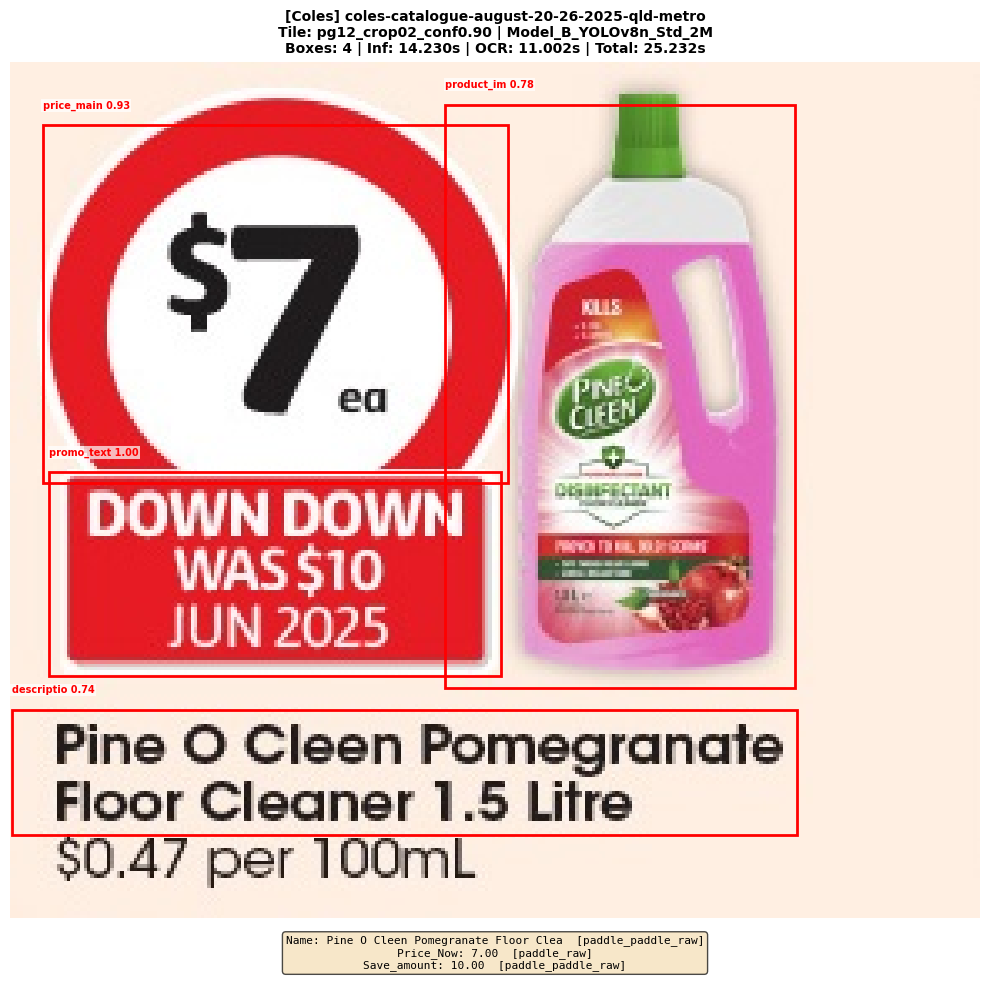


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg12_crop02_conf0.90
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 4
    ───────────────────────────────────────────────────────────────────────────

    [Name]
    ★ WINNER: 'Pine O Cleen Pomegranate Floor Cleaner 1.5 Litre' via [paddle_paddle_raw]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_paddle_raw                   Pine O Cleen Pomegranate      5038 ★
    otsu+psm6_text                      Pine O Cleen Pomegranate        38
    otsu+psm4_col                       Pine O Cleen Pomegranate        38
    otsu+psm3_auto                      Pine O Cleen Pomegranate        38
    otsu_inv+psm6_text                  Pine O Cleen Pomegranate        38
    otsu_inv+psm4_col                   Pine O Cleen Pomegranate        38
    otsu_inv+psm3_auto                  Pine

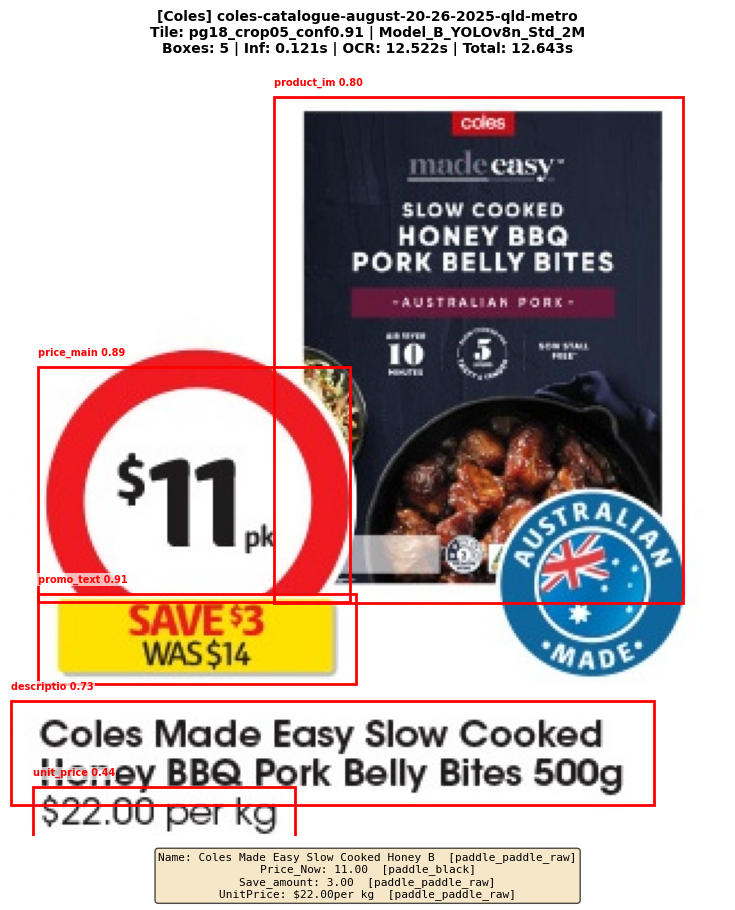


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg18_crop05_conf0.91
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 5
    ───────────────────────────────────────────────────────────────────────────

    [Name]
    ★ WINNER: 'Coles Made Easy Slow Cooked Honey BBQ Pork Belly Bites 500g' via [paddle_paddle_raw]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_paddle_raw                   Coles Made Easy Slow Coo      5046 ★
    otsu_inv+psm6_text                  Coles Made Easy Slow Coo        46
    adaptive+psm6_text                  Coles Made Easy Slow Coo        46
    adaptive+psm4_col                   Coles Made Easy Slow Coo        46
    adaptive+psm3_auto                  Coles Made Easy Slow Coo        46
    adaptive_inv+psm6_text              Coles Made Easy Slow Coo        46
    adaptive_inv+psm4_col        

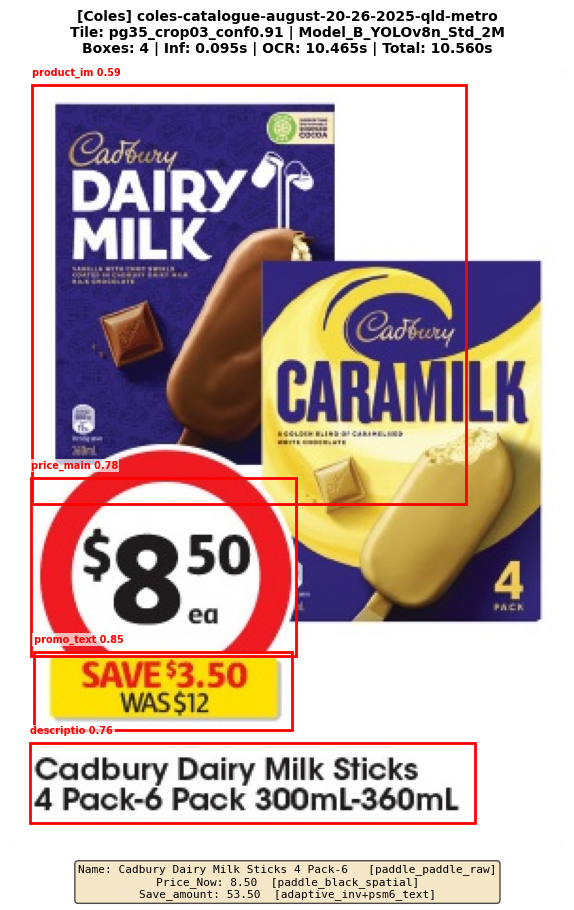


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg35_crop03_conf0.91
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 4
    ───────────────────────────────────────────────────────────────────────────

    [Name]
    ★ WINNER: 'Cadbury Dairy Milk Sticks 4 Pack-6 Pack 300mL-360mL' via [paddle_paddle_raw]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_paddle_raw                   Cadbury Dairy Milk Stick      5034 ★
    otsu+psm6_text                      Cadbury Dairy Milk Stick        34
    otsu+psm4_col                       Cadbury Dairy Milk Stick        34
    otsu+psm3_auto                      Cadbury Dairy Milk Stick        34
    otsu_inv+psm6_text                  Cadbury Dairy Milk Stick        34
    otsu_inv+psm4_col                   Cadbury Dairy Milk Stick        34
    otsu_inv+psm3_auto                  C

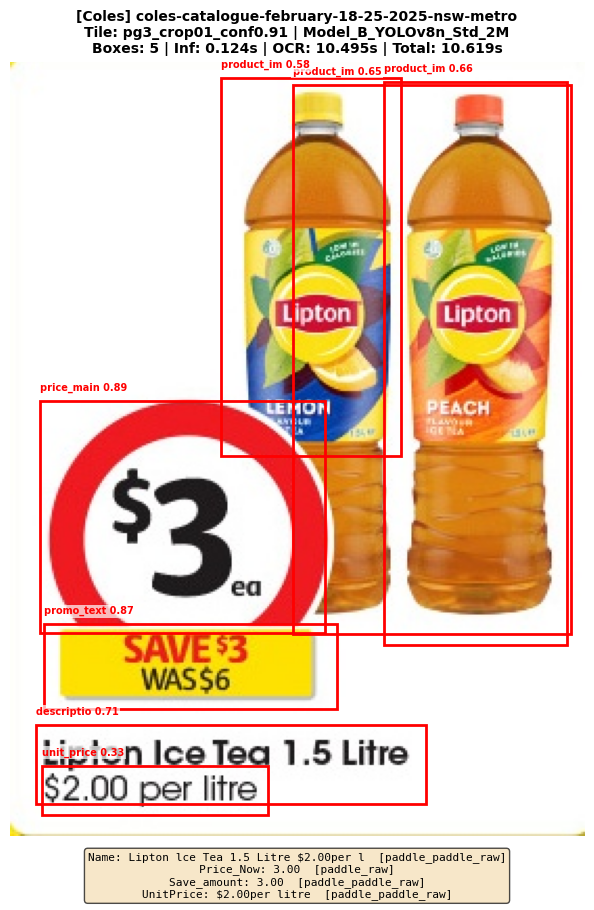


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg3_crop01_conf0.91
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 5
    ───────────────────────────────────────────────────────────────────────────

    [Name]
    ★ WINNER: 'Lipton lce Tea 1.5 Litre $2.00per litre' via [paddle_paddle_raw]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_paddle_raw                   Lipton lce Tea 1.5 Litre      5025 ★
    otsu+psm6_text                      Lipton Ice Tea 1.5 Litre        25
    otsu+psm4_col                       Lipton Ice Tea 1.5 Litre        25
    otsu+psm3_auto                      Lipton Ice Tea 1.5 Litre        25
    otsu_inv+psm6_text                  Lipton Ice Tea 1.5 Litre        25
    otsu_inv+psm4_col                   Lipton Ice Tea 1.5 Litre        25
    otsu_inv+psm3_auto                  Lipton Ice Tea

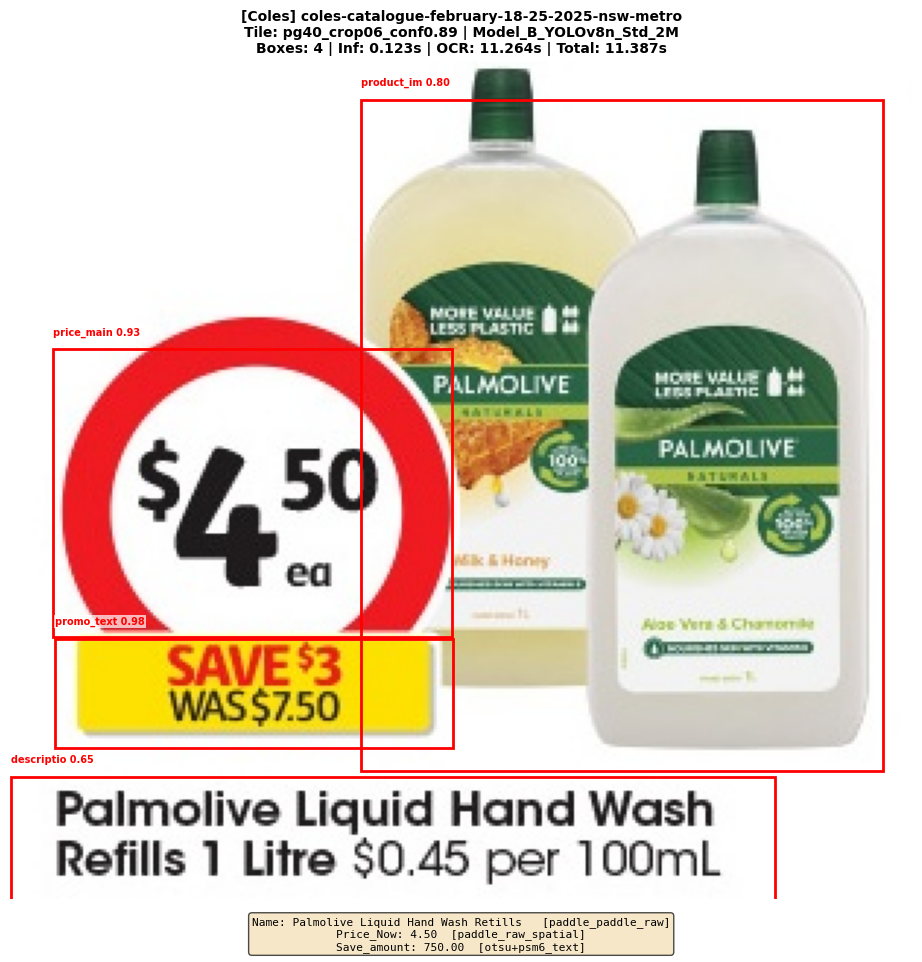


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg40_crop06_conf0.89
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 4
    ───────────────────────────────────────────────────────────────────────────

    [Name]
    ★ WINNER: 'Palmolive Liquid Hand Wash Retills 1 Litre$0.45 per 100mL' via [paddle_paddle_raw]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_paddle_raw                   Palmolive Liquid Hand Wa      5040 ★
    otsu+psm6_text                      Palmolive Liquid Hand Wa        40
    otsu+psm4_col                       Palmolive Liquid Hand Wa        40
    otsu+psm3_auto                      Palmolive Liquid Hand Wa        40
    otsu_inv+psm6_text                  Palmolive Liquid Hand Wa        40
    otsu_inv+psm4_col                   Palmolive Liquid Hand Wa        40
    otsu_inv+psm3_auto             

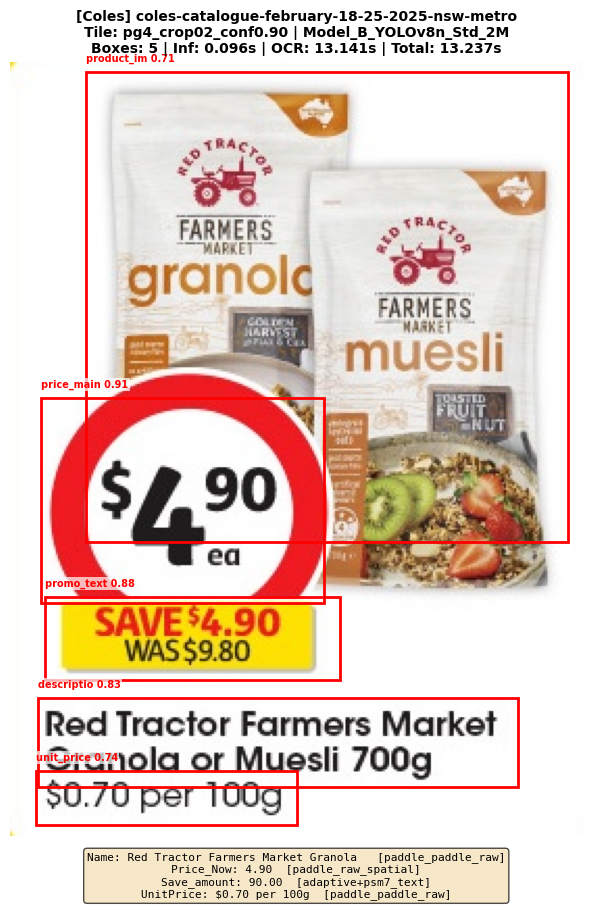


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg4_crop02_conf0.90
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 5
    ───────────────────────────────────────────────────────────────────────────

    [Name]
    ★ WINNER: 'Red Tractor Farmers Market Granola or Muesli 700g' via [paddle_paddle_raw]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_paddle_raw                   Red Tractor Farmers Mark      5039 ★
    otsu+psm6_text                      Red Tractor Farmers Mark        39
    otsu+psm4_col                       Red Tractor Farmers Mark        39
    otsu+psm3_auto                      Red Tractor Farmers Mark        39
    otsu_inv+psm6_text                  Red Tractor Farmers Mark        39
    otsu_inv+psm4_col                   Red Tractor Farmers Mark        39
    otsu_inv+psm3_auto                  Red 

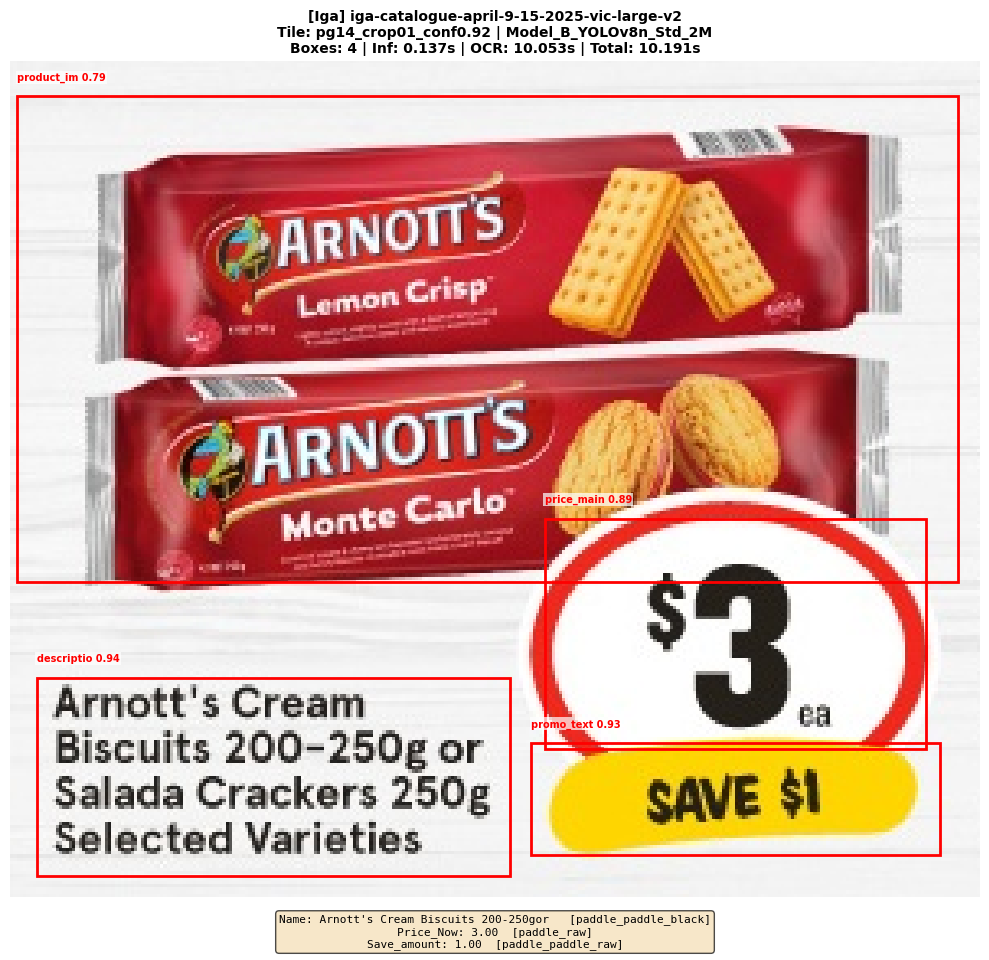


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg14_crop01_conf0.92
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 4
    ───────────────────────────────────────────────────────────────────────────

    [Name]
    ★ WINNER: 'Arnott's Cream Biscuits 200-250gor Salada Crackcrs 2s0g Selected Varieties' via [paddle_paddle_black]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_paddle_black                 Arnott's Cream Biscuits       5056 ★
    otsu+psm6_text                      Arnott's Cream Biscuits         55
    otsu+psm4_col                       Arnott's Cream Biscuits         55
    otsu+psm3_auto                      Arnott's Cream Biscuits         55
    otsu_inv+psm6_text                  Arnott's Cream Biscuits         55
    otsu_inv+psm4_col                   Arnott's Cream Biscuits         55
    otsu_inv+psm

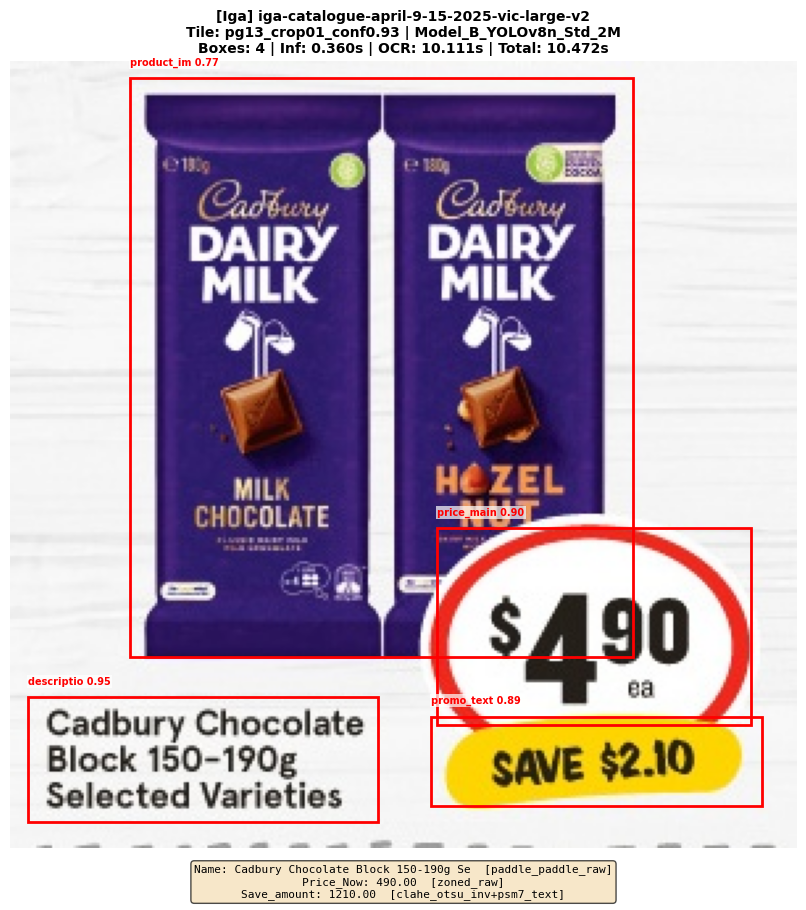


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg13_crop01_conf0.93
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 4
    ───────────────────────────────────────────────────────────────────────────

    [Name]
    ★ WINNER: 'Cadbury Chocolate Block 150-190g Selected Varieties' via [paddle_paddle_raw]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_paddle_raw                   Cadbury Chocolate Block       5039 ★
    otsu+psm6_text                      Cadbury Chocolate Block         39
    otsu+psm4_col                       Cadbury Chocolate Block         39
    otsu+psm3_auto                      Cadbury Chocolate Block         39
    otsu_inv+psm6_text                  Cadbury Chocolate Block         39
    adaptive+psm6_text                  Cadbury Chocolate Block         39
    adaptive+psm4_col                   C

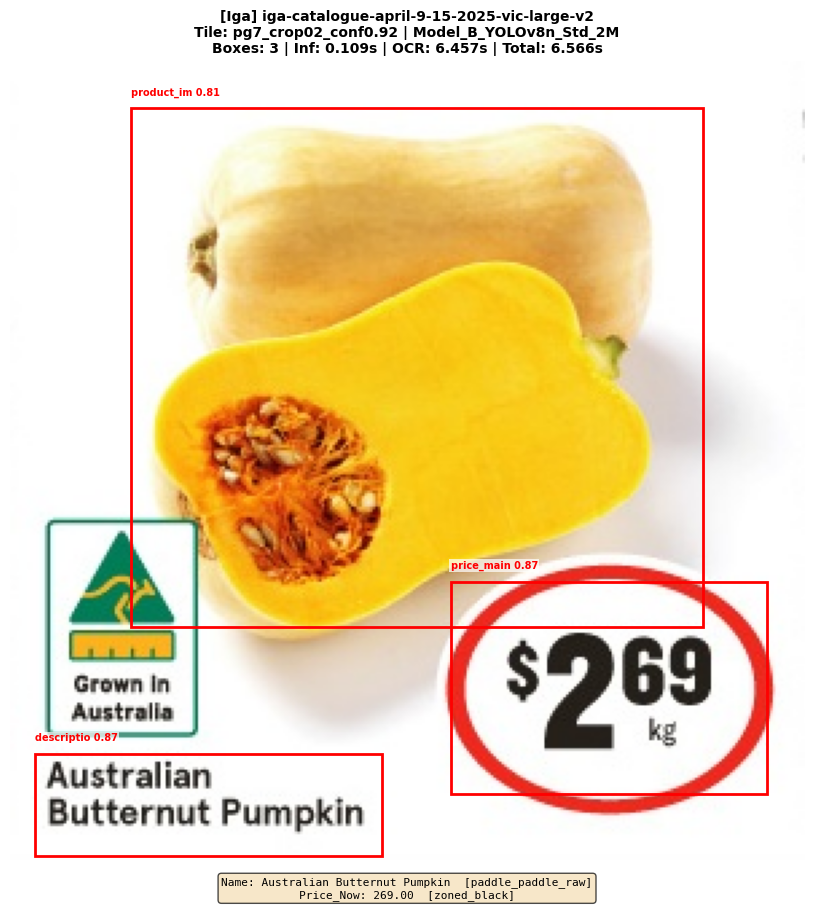


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg7_crop02_conf0.92
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 3
    ───────────────────────────────────────────────────────────────────────────

    [Name]
    ★ WINNER: 'Australian Butternut Pumpkin' via [paddle_paddle_raw]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_paddle_raw                   Australian Butternut Pum      5026 ★
    otsu+psm6_text                      Australian Butternut Pum        26
    otsu+psm4_col                       Australian Butternut Pum        26
    otsu+psm3_auto                      Australian Butternut Pum        26
    otsu_inv+psm6_text                  Australian Butternut Pum        26
    otsu_inv+psm4_col                   Australian Butternut Pum        26
    otsu_inv+psm3_auto                  Australian Butternut Pum 

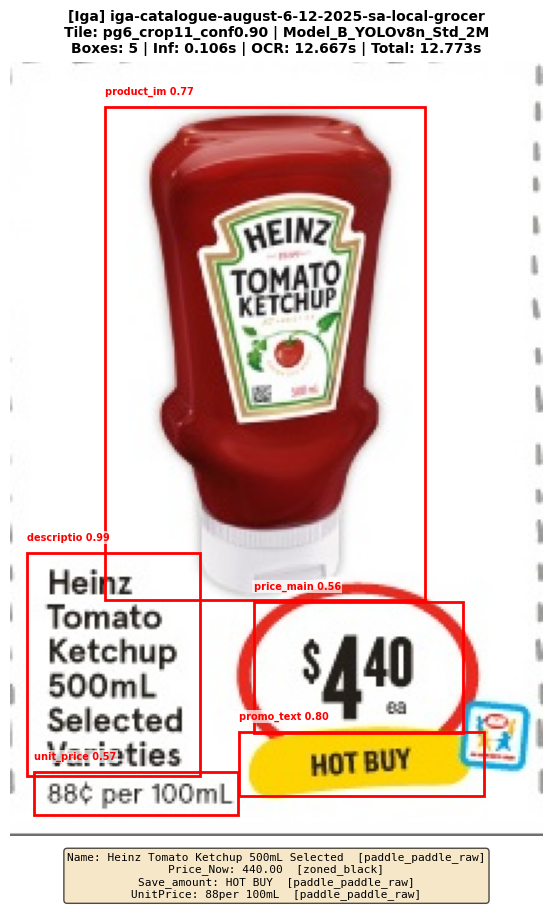


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg6_crop11_conf0.90
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 5
    ───────────────────────────────────────────────────────────────────────────

    [Name]
    ★ WINNER: 'Heinz Tomato Ketchup 500mL Selected Varieties' via [paddle_paddle_raw]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_paddle_raw                   Heinz Tomato Ketchup 500      5037 ★
    adaptive+psm6_text                  Heinz Tomato Ketchup $00        38
    adaptive+psm4_col                   Heinz Tomato Ketchup $00        38
    adaptive+psm3_auto                  Heinz Tomato Ketchup $00        38
    adaptive_inv+psm6_text              Heinz Tomato Ketchup $00        38
    adaptive_inv+psm4_col               Heinz Tomato Ketchup $00        38
    adaptive_inv+psm3_auto              Heinz To

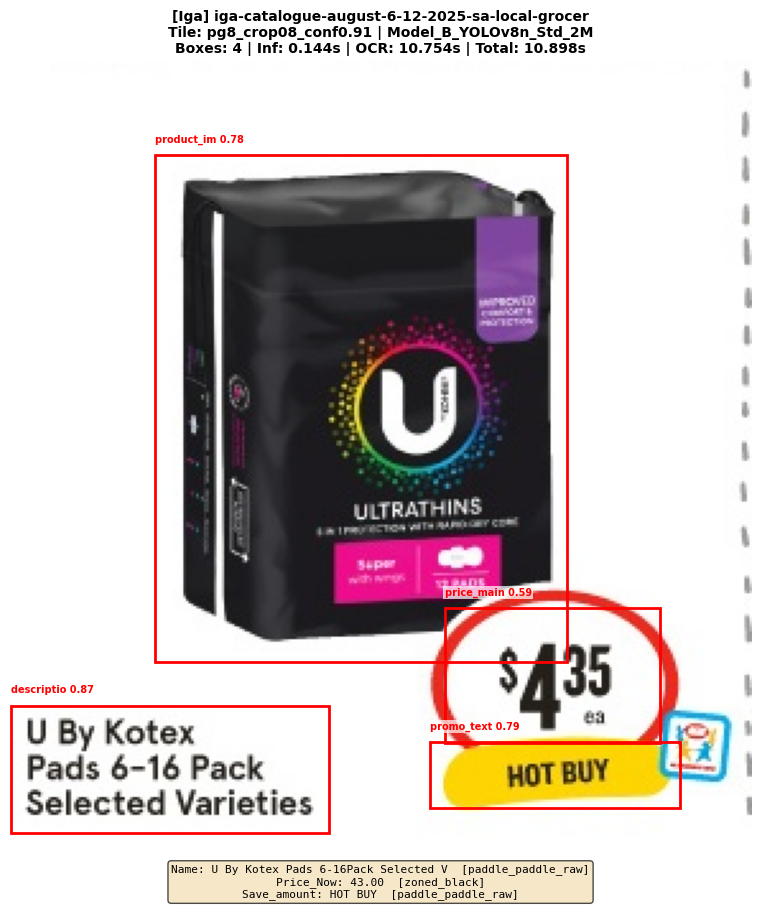


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg8_crop08_conf0.91
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 4
    ───────────────────────────────────────────────────────────────────────────

    [Name]
    ★ WINNER: 'U By Kotex Pads 6-16Pack Selected Varieties' via [paddle_paddle_raw]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_paddle_raw                   U By Kotex Pads 6-16Pack      5033 ★
    otsu+psm6_text                      U By Kotex Pads 6-16 Pac        33
    otsu+psm4_col                       U By Kotex Pads 6-16 Pac        33
    otsu+psm3_auto                      U By Kotex Pads 6-16 Pac        33
    otsu_inv+psm6_text                  U By Kotex Pads 6-16 Pac        33
    adaptive+psm6_text                  U By Kotex Pads 6-16 Pac        33
    adaptive+psm4_col                   U By Kotex

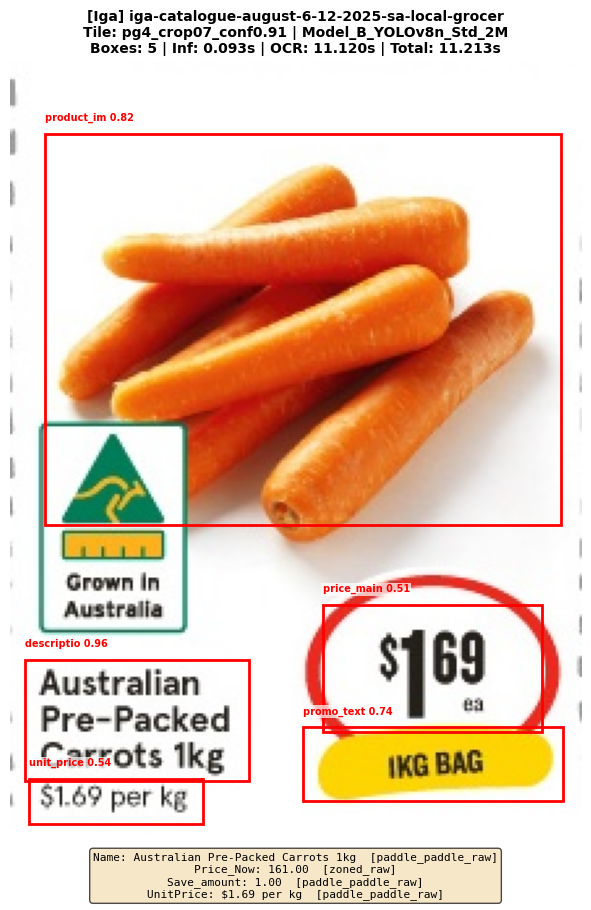


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg4_crop07_conf0.91
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 5
    ───────────────────────────────────────────────────────────────────────────

    [Name]
    ★ WINNER: 'Australian Pre-Packed Carrots 1kg' via [paddle_paddle_raw]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_paddle_raw                   Australian Pre-Packed Ca      5028 ★
    otsu+psm6_text                      Australian Pre-Packed Ca        29
    otsu+psm4_col                       Australian Pre-Packed Ca        29
    otsu+psm3_auto                      Australian Pre-Packed Ca        29
    otsu_inv+psm6_text                  Australian Pre-Packed Ca        29
    otsu_inv+psm4_col                   Australian Pre-Packed Ca        29
    otsu_inv+psm3_auto                  Australian Pre-Packe

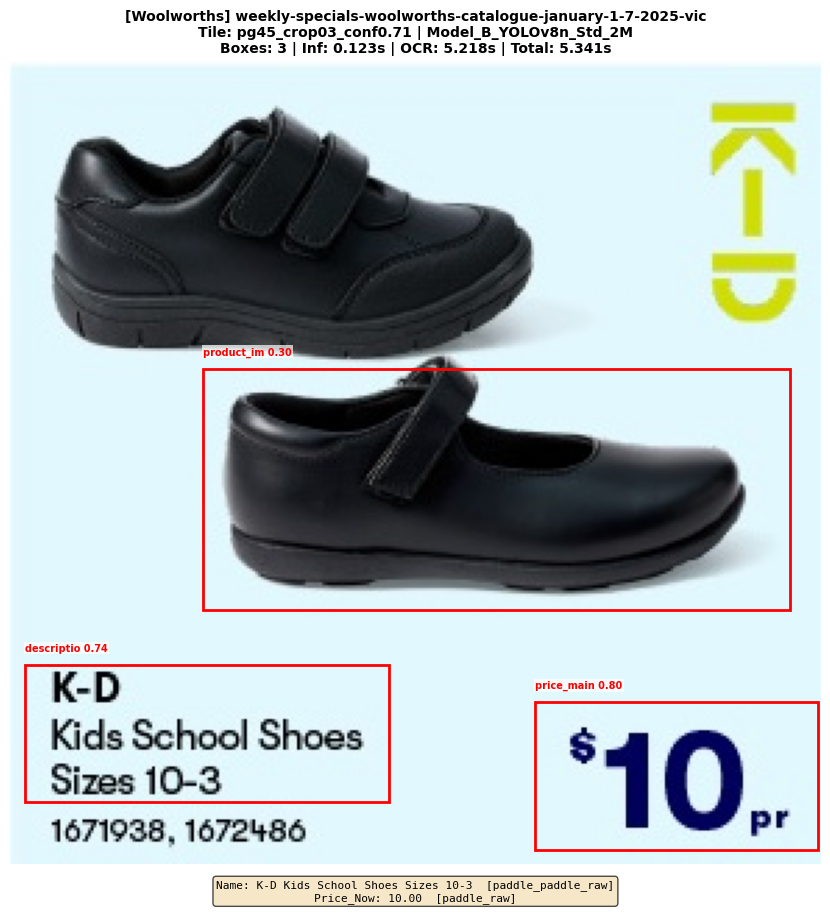


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg45_crop03_conf0.71
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 3
    ───────────────────────────────────────────────────────────────────────────

    [Name]
    ★ WINNER: 'K-D Kids School Shoes Sizes 10-3' via [paddle_paddle_raw]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_paddle_raw                   K-D Kids School Shoes Si      5022 ★
    otsu+psm6_text                      K-D Kids School Shoes Si        22
    otsu+psm4_col                       K-D Kids School Shoes Si        22
    otsu+psm3_auto                      K-D Kids School Shoes Si        22
    otsu_inv+psm6_text                  K-D Kids School Shoes Si        22
    adaptive+psm6_text                  K-D Kids School Shoes Si        22
    adaptive+psm4_col                   K-D Kids School Shoe

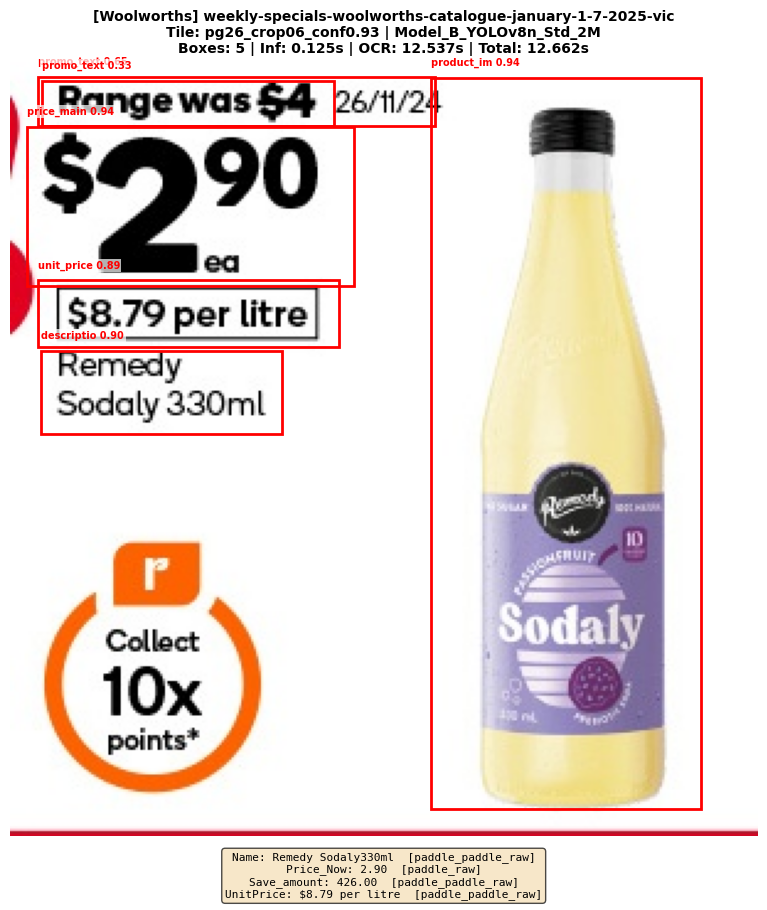


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg26_crop06_conf0.93
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 5
    ───────────────────────────────────────────────────────────────────────────

    [Name]
    ★ WINNER: 'Remedy Sodaly330ml' via [paddle_paddle_raw]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_paddle_raw                   Remedy Sodaly330ml            5014 ★
    otsu+psm6_text                      Remedy Sodaly 330ml             14
    otsu+psm4_col                       Remedy Sodaly 330ml             14
    otsu+psm3_auto                      Remedy Sodaly 330ml             14
    otsu_inv+psm6_text                  Remedy Sodaly 330ml             14
    otsu_inv+psm4_col                   Remedy Sodaly 330ml             14
    otsu_inv+psm3_auto                  Remedy Sodaly 330ml             14

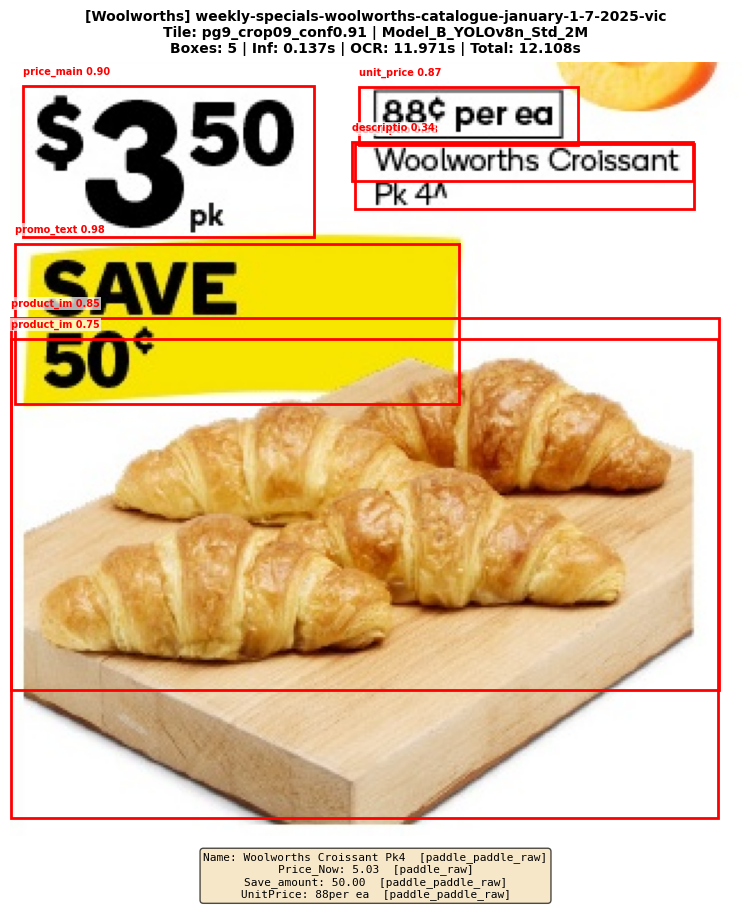


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg9_crop09_conf0.91
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 5
    ───────────────────────────────────────────────────────────────────────────

    [Name]
    ★ WINNER: 'Woolworths Croissant Pk4' via [paddle_paddle_raw]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_paddle_raw                   Woolworths Croissant Pk4      5021 ★
    otsu_inv+psm6_text                  Woolworths Croissant Pk         22
    otsu_inv+psm4_col                   Woolworths Croissant Pk         22
    otsu_inv+psm3_auto                  Woolworths Croissant Pk         22
    adaptive+psm6_text                  Woolworths Crolssant Pk         22
    adaptive+psm4_col                   Woolworths Crolssant Pk         22
    adaptive+psm3_auto                  Woolworths Crolssant Pk      

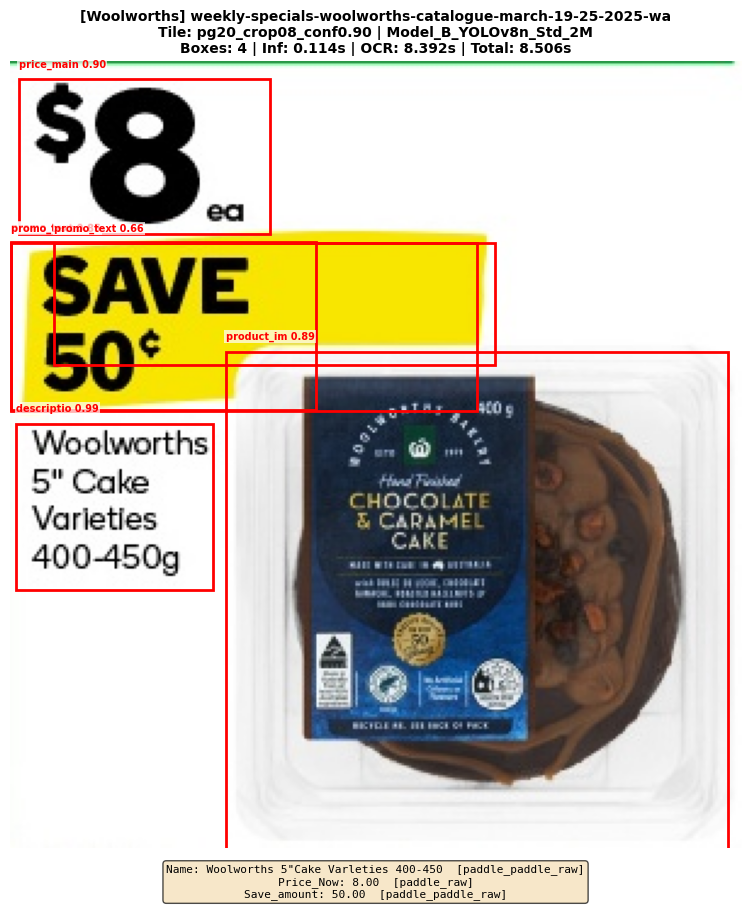


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg20_crop08_conf0.90
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 4
    ───────────────────────────────────────────────────────────────────────────

    [Name]
    ★ WINNER: 'Woolworths 5"Cake Varleties 400-450g' via [paddle_paddle_raw]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_paddle_raw                   Woolworths 5"Cake Varlet      5024 ★
    otsu_inv+psm4_col                   ‘Woolweorths| 5" Cake Va        24
    otsu_inv+psm3_auto                  ‘Woolweorths| 5" Cake Va        24
    clahe_otsu_inv+psm6_text            ‘Woolweorths| 5" Cake Va        24
    otsu+psm6_text                      Woolworths 5" Cake Varie        23
    otsu+psm4_col                       Woolworths 5" Cake Varie        23
    otsu+psm3_auto                      Woolworths 5" Ca

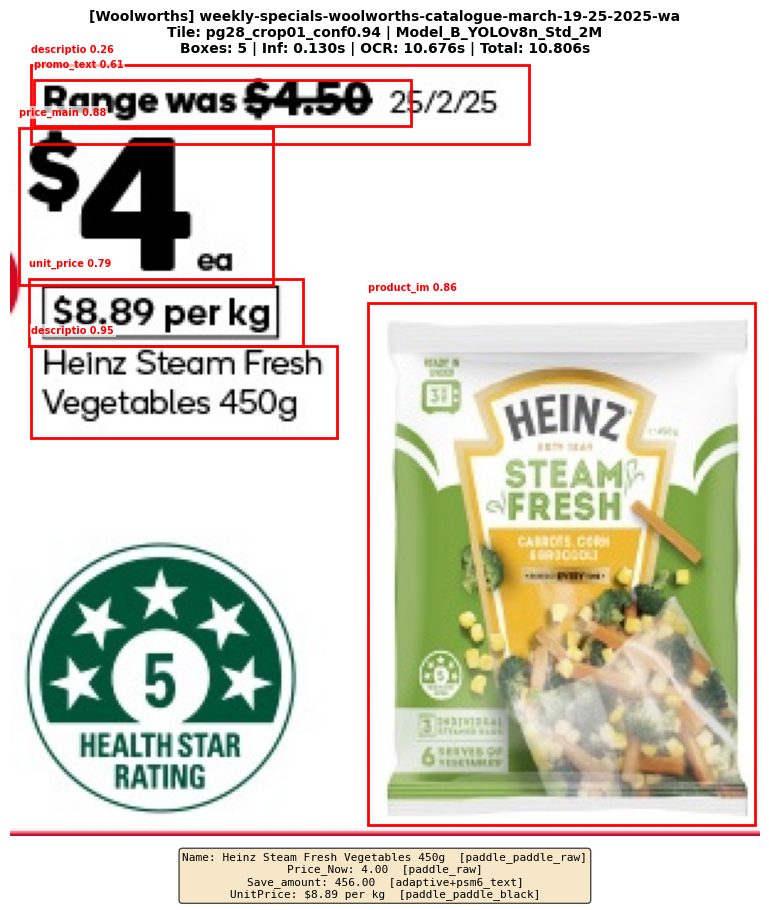


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg28_crop01_conf0.94
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 5
    ───────────────────────────────────────────────────────────────────────────

    [Name]
    ★ WINNER: 'Heinz Steam Fresh Vegetables 450g' via [paddle_paddle_raw]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_paddle_raw                   Heinz Steam Fresh Vegeta      5026 ★
    otsu+psm6_text                      Heinz Steam Fresh Vegeta        26
    otsu+psm4_col                       Heinz Steam Fresh Vegeta        26
    otsu+psm3_auto                      Heinz Steam Fresh Vegeta        26
    otsu_inv+psm6_text                  Heinz Steam Fresh Vegeta        26
    otsu_inv+psm4_col                   Heinz Steam Fresh Vegeta        26
    otsu_inv+psm3_auto                  Heinz Steam Fresh V

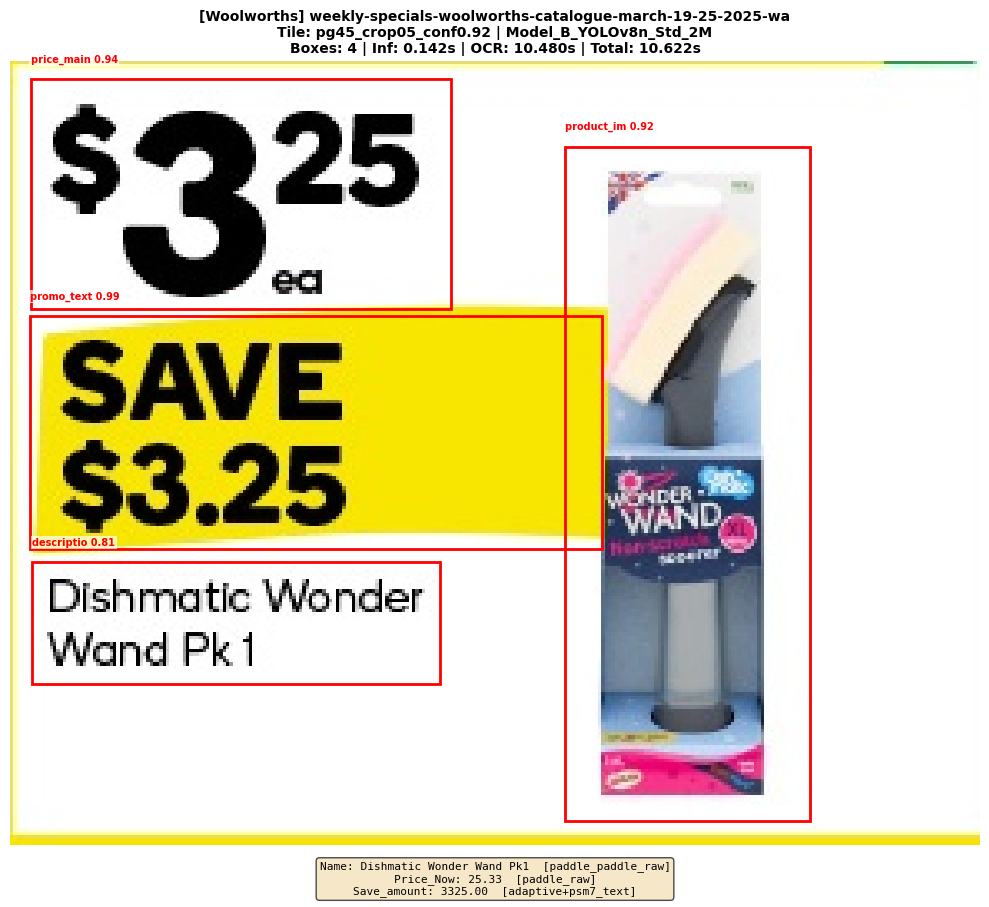


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg45_crop05_conf0.92
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 4
    ───────────────────────────────────────────────────────────────────────────

    [Name]
    ★ WINNER: 'Dishmatic Wonder Wand Pk1' via [paddle_paddle_raw]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_paddle_raw                   Dishmatic Wonder Wand Pk      5021 ★
    otsu+psm6_text                      Olshmatic Wonder Wand Pk        21
    otsu+psm4_col                       Olshmatic Wonder Wand Pk        21
    otsu+psm3_auto                      Olshmatic Wonder Wand Pk        21
    otsu_inv+psm6_text                  Olshmatic Wonder Wand Pk        21
    otsu_inv+psm4_col                   Olshmatic Wonder Wand Pk        21
    otsu_inv+psm3_auto                  Olshmatic Wonder Wand Pk   

([{'Retailer': 'Coles',
   'Catalogue': 'coles-catalogue-august-20-26-2025-qld-metro',
   'Tile': 'pg12_crop02_conf0.90',
   'Model': 'Model_B_YOLOv8n_Std_2M',
   'Name': 'Pine O Cleen Pomegranate Floor Cleaner 1.5 Litre',
   'Price_Now': '7.00',
   'Save_amount': '10.00',
   'UnitPrice': '',
   'PriceWas': '17.00',
   'OCR_Method_Name': 'paddle_paddle_raw',
   'OCR_Method_Price': 'paddle_raw',
   'OCR_Method_Save': 'paddle_paddle_raw',
   'OCR_Method_UnitPrice': '',
   'Num_Boxes': 4,
   'Inference_Time_s': 14.229944899998372,
   'Crop_OCR_Time_s': 11.001865400001407,
   'Total_Time_s': 25.23181029999978},
  {'Retailer': 'Coles',
   'Catalogue': 'coles-catalogue-august-20-26-2025-qld-metro',
   'Tile': 'pg18_crop05_conf0.91',
   'Model': 'Model_B_YOLOv8n_Std_2M',
   'Name': 'Coles Made Easy Slow Cooked Honey BBQ Pork Belly Bites 500g',
   'Price_Now': '11.00',
   'Save_amount': '3.00',
   'UnitPrice': '$22.00per kg',
   'PriceWas': '14.00',
   'OCR_Method_Name': 'paddle_paddle_raw',
 

In [13]:
run_benchmark()

  Checking: coles-catalogue-august-20-26-2025-qld-metro
    Found 330 valid images
    Sampled 3 tiles
  Checking: coles-catalogue-february-18-25-2025-nsw-metro
    Found 336 valid images
    Sampled 3 tiles
  Checking: iga-catalogue-april-9-15-2025-vic-large-v2
    Found 303 valid images
    Sampled 3 tiles
  Checking: iga-catalogue-august-6-12-2025-sa-local-grocer
    Found 89 valid images
    Sampled 3 tiles
  Checking: weekly-specials-woolworths-catalogue-january-1-7-2025-vic
    Found 265 valid images
    Sampled 3 tiles
  Checking: weekly-specials-woolworths-catalogue-march-19-25-2025-wa
    Found 305 valid images
    Sampled 3 tiles
SUCCESS: Found 6 catalogue folders (capped at 6)
  - coles-catalogue-august-20-26-2025-qld-metro [Retailer: Coles]: 3 sampled tiles
  - coles-catalogue-february-18-25-2025-nsw-metro [Retailer: Coles]: 3 sampled tiles
  - iga-catalogue-april-9-15-2025-vic-large-v2 [Retailer: Iga]: 3 sampled tiles
  - iga-catalogue-august-6-12-2025-sa-local-grocer [Ret

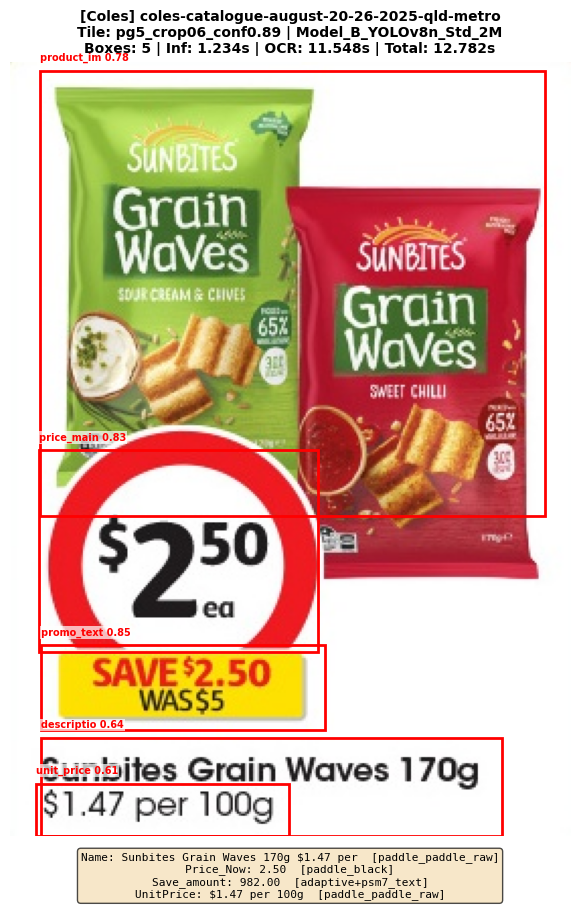


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg5_crop06_conf0.89
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 5
    ───────────────────────────────────────────────────────────────────────────

    [Name]
    ★ WINNER: 'Sunbites Grain Waves 170g $1.47 per100g' via [paddle_paddle_raw]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_paddle_raw                   Sunbites Grain Waves 170      5023 ★
    otsu+psm6_text                      Sunbites Grain Waves 170        23
    otsu+psm4_col                       Sunbites Grain Waves 170        23
    otsu+psm3_auto                      Sunbites Grain Waves 170        23
    otsu_inv+psm6_text                  Sunbites Grain Waves 170        23
    otsu_inv+psm4_col                   Sunbites Grain Waves 170        23
    otsu_inv+psm3_auto                  Sunbites Grain

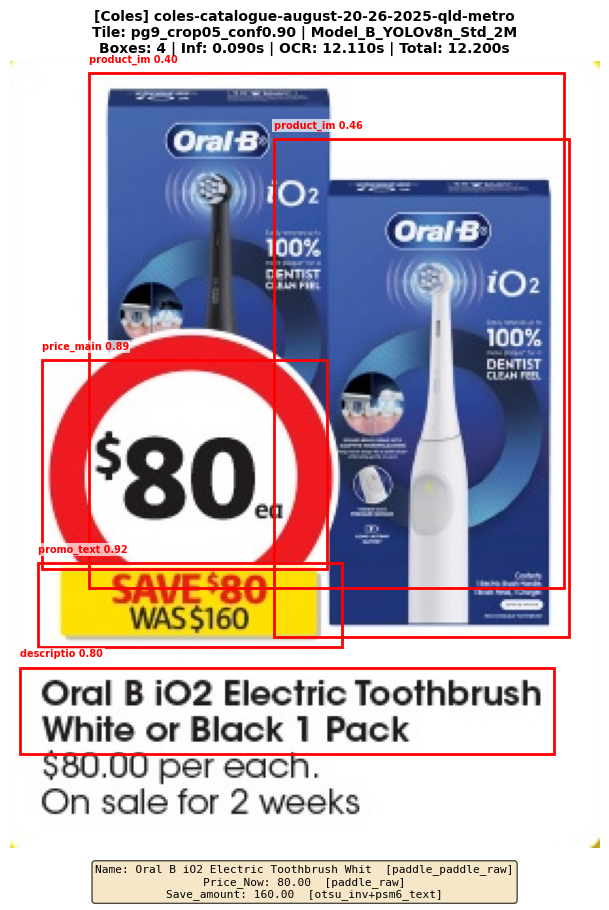


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg9_crop05_conf0.90
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 4
    ───────────────────────────────────────────────────────────────────────────

    [Name]
    ★ WINNER: 'Oral B iO2 Electric Toothbrush White or Black 1 Pack' via [paddle_paddle_raw]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_paddle_raw                   Oral B iO2 Electric Toot      5041 ★
    otsu+psm6_text                      Oral B iO2 Electric Toot        41
    otsu+psm4_col                       Oral B iO2 Electric Toot        41
    otsu+psm3_auto                      Oral B iO2 Electric Toot        41
    otsu_inv+psm6_text                  Oral B iO2 Electric Toot        41
    otsu_inv+psm4_col                   Oral B iO2 Electric Toot        41
    otsu_inv+psm3_auto                  O

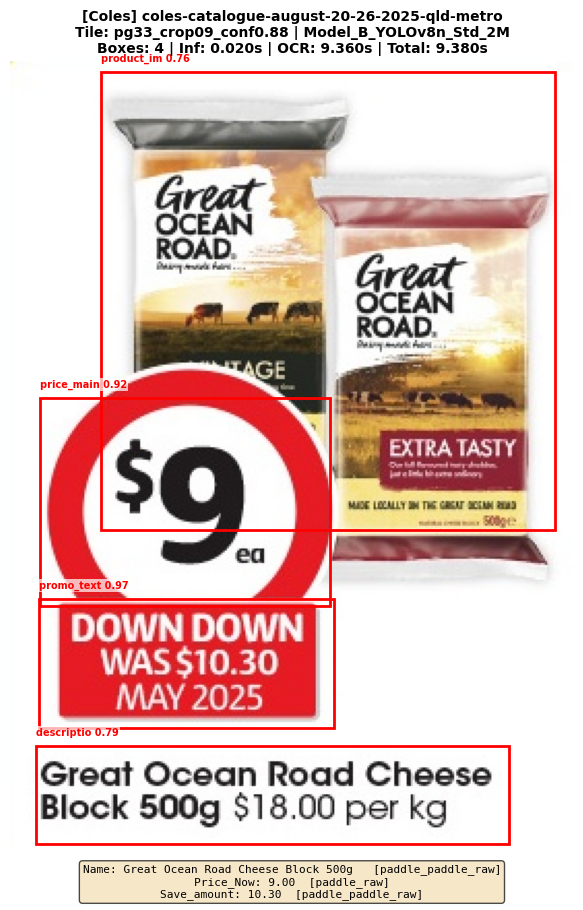


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg33_crop09_conf0.88
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 4
    ───────────────────────────────────────────────────────────────────────────

    [Name]
    ★ WINNER: 'Great Ocean Road Cheese Block 500g $18.00 per kg' via [paddle_paddle_raw]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_paddle_raw                   Great Ocean Road Cheese       5031 ★
    otsu+psm6_text                      Great Ocean Road Cheese         31
    otsu+psm4_col                       Great Ocean Road Cheese         31
    otsu+psm3_auto                      Great Ocean Road Cheese         31
    otsu_inv+psm6_text                  Great Ocean Road Cheese         31
    otsu_inv+psm4_col                   Great Ocean Road Cheese         31
    otsu_inv+psm3_auto                  Grea

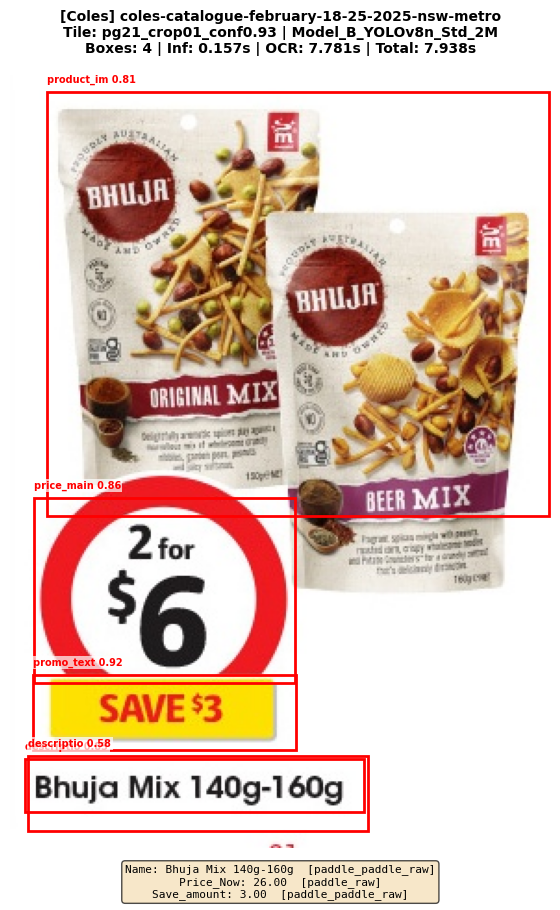


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg21_crop01_conf0.93
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 4
    ───────────────────────────────────────────────────────────────────────────

    [Name]
    ★ WINNER: 'Bhuja Mix 140g-160g' via [paddle_paddle_raw]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_paddle_raw                   Bhuja Mix 140g-160g           5010 ★
    otsu+psm6_text                      Bhuja Mix 140g-160g             10
    otsu+psm4_col                       Bhuja Mix 140g-160g             10
    otsu+psm3_auto                      Bhuja Mix 140g-160g             10
    otsu_inv+psm6_text                  Bhuja Mix 140g-160g             10
    otsu_inv+psm4_col                   Bhuja Mix 140g-160g             10
    otsu_inv+psm3_auto                  Bhuja Mix 140g-160g             1

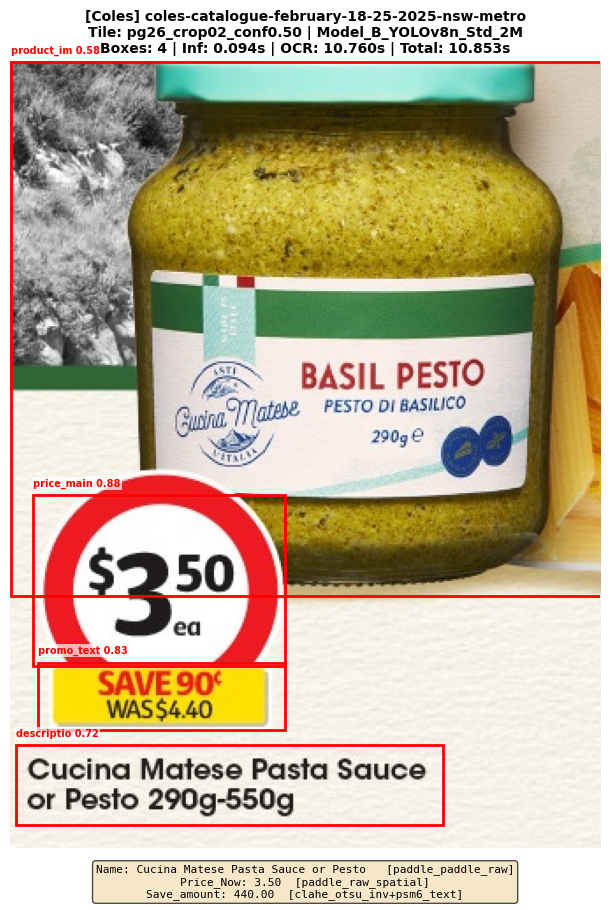


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg26_crop02_conf0.50
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 4
    ───────────────────────────────────────────────────────────────────────────

    [Name]
    ★ WINNER: 'Cucina Matese Pasta Sauce or Pesto 290g-550g' via [paddle_paddle_raw]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_paddle_raw                   Cucina Matese Pasta Sauc      5031 ★
    otsu+psm6_text                      Cucina Matese Pasta Sauc        31
    otsu+psm4_col                       Cucina Matese Pasta Sauc        31
    otsu+psm3_auto                      Cucina Matese Pasta Sauc        31
    otsu_inv+psm6_text                  Cucina Matese Pasta Sauc        31
    otsu_inv+psm4_col                   Cucina Matese Pasta Sauc        31
    otsu_inv+psm3_auto                  Cucina M

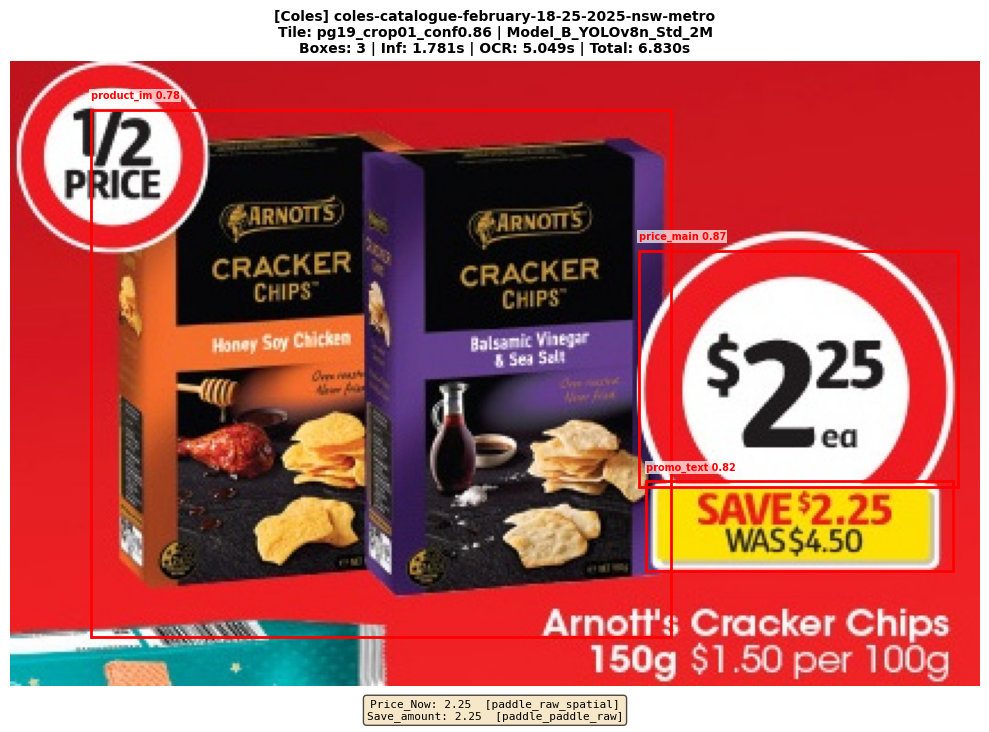


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg19_crop01_conf0.86
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 3
    ───────────────────────────────────────────────────────────────────────────

    [Name] — NOT DETECTED

    [Price_Now]
    ★ WINNER: '2.25' via [paddle_raw_spatial]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_raw_spatial                  2.25                          4725 ★
    zoned_black                         2.15                          3215
    ⚠ DISAGREE: Paddle='2.25' vs Tess='2.15'

    [Save_amount]
    ★ WINNER: '2.25' via [paddle_paddle_raw]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_paddle_raw                   2.25                          5225 ★
    adaptive+psm6_t

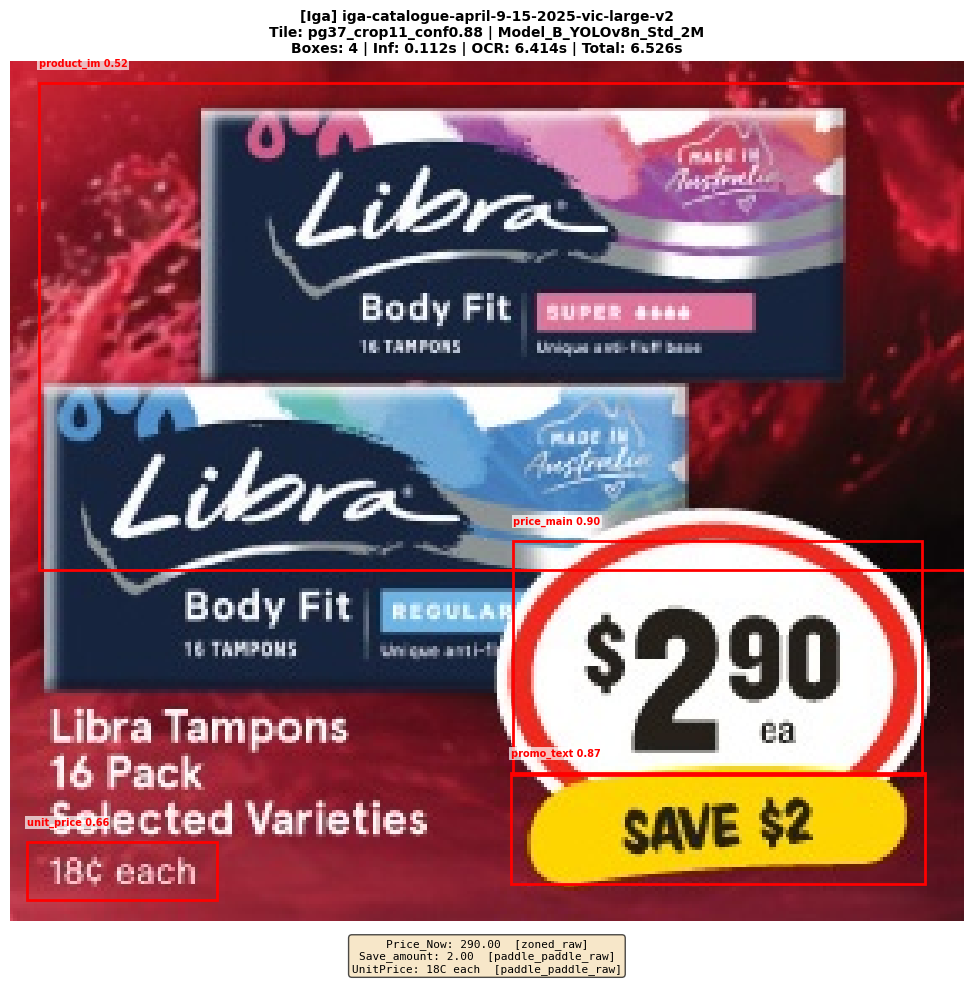


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg37_crop11_conf0.88
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 4
    ───────────────────────────────────────────────────────────────────────────

    [Name] — NOT DETECTED

    [Price_Now]
    ★ WINNER: '290.00' via [zoned_raw]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    zoned_raw                           290.00                       32000 ★
    paddle_raw                          2.90                          3790
    ⚠ DISAGREE: Paddle='2.90' vs Tess='290.00'

    [Save_amount]
    ★ WINNER: '2.00' via [paddle_paddle_raw]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_paddle_raw                   2.00                          5200 ★
    adaptive_inv+psm6_te

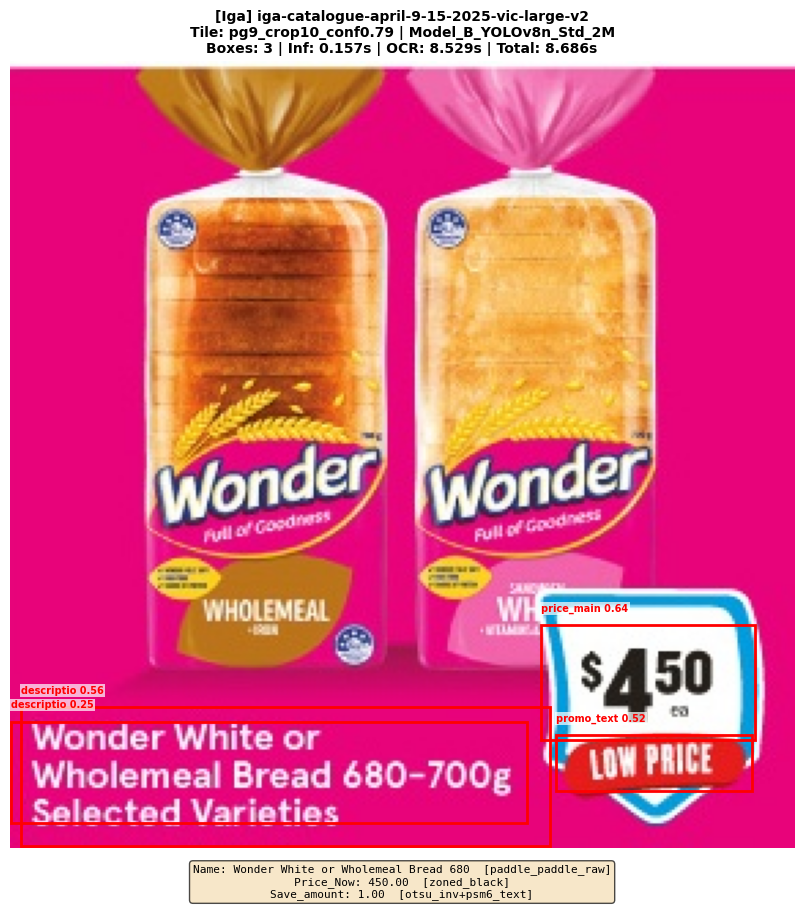


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg9_crop10_conf0.79
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 3
    ───────────────────────────────────────────────────────────────────────────

    [Name]
    ★ WINNER: 'Wonder White or Wholemeal Bread 680-700g SelectedVarieties' via [paddle_paddle_raw]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_paddle_raw                   Wonder White or Wholemea      5045 ★
    otsu_inv+psm6_text                  Wonder White or fl Whole        47
    otsu_inv+psm4_col                   Wonder White or fl Whole        47
    otsu_inv+psm3_auto                  Wonder White or fl Whole        47
    adaptive+psm6_text                  ‘Wonder White or! ( |Who        45
    clahe_otsu+psm6_text                Wonder White or Wholemea        45
    clahe_otsu_inv+psm6_text       

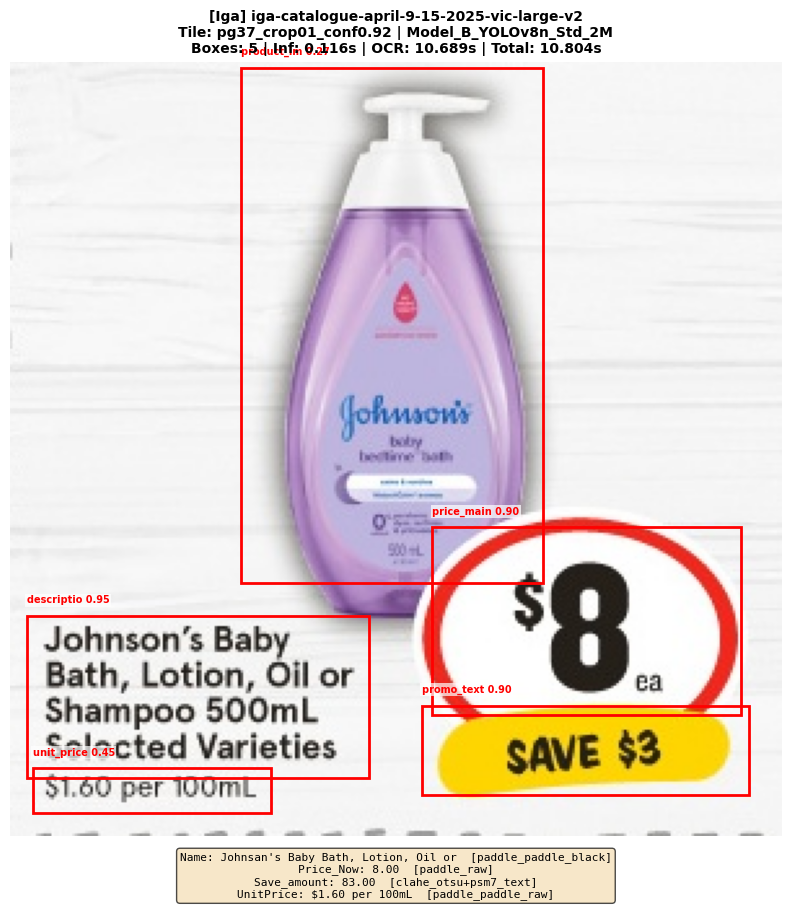


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg37_crop01_conf0.92
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 5
    ───────────────────────────────────────────────────────────────────────────

    [Name]
    ★ WINNER: 'Johnsan's Baby Bath, Lotion, Oil or Shampoo 500ml Selected Varieties' via [paddle_paddle_black]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_paddle_black                 Johnsan's Baby Bath, Lot      5053 ★
    otsu_inv+psm6_text                  Johnson’s Baby Bath, Lot        54
    otsu_inv+psm4_col                   Johnson’s Baby Bath, Lot        54
    otsu_inv+psm3_auto                  Johnson’s Baby Bath, Lot        54
    otsu+psm6_text                      Johnson’s Baby Bath, Lot        53
    otsu+psm4_col                       Johnson’s Baby Bath, Lot        53
    otsu+psm3_auto    

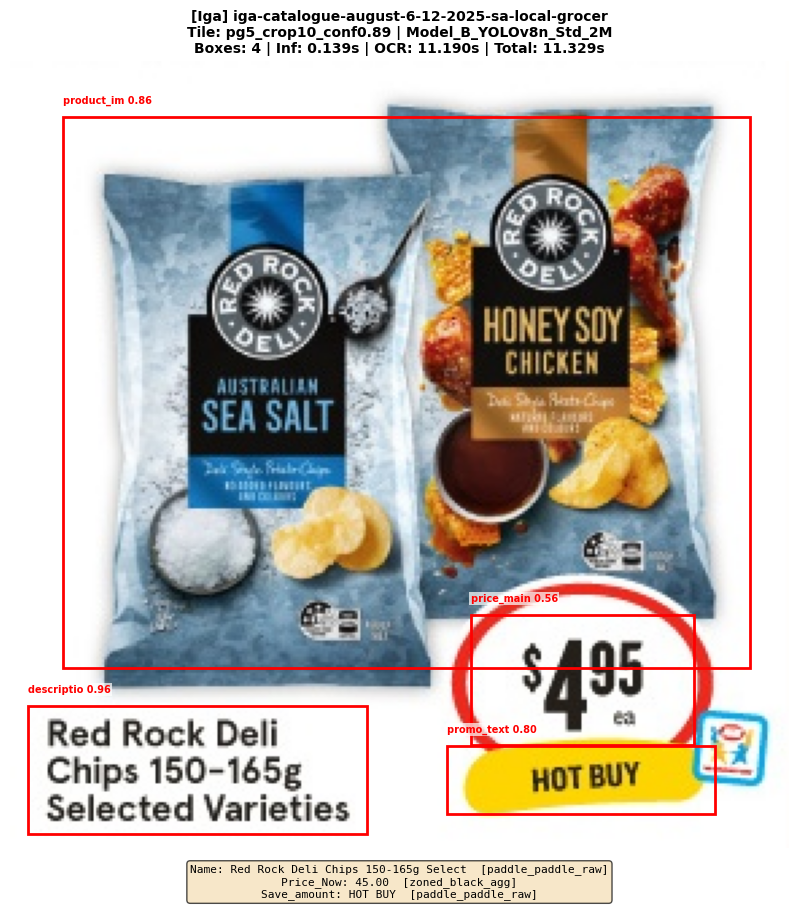


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg5_crop10_conf0.89
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 4
    ───────────────────────────────────────────────────────────────────────────

    [Name]
    ★ WINNER: 'Red Rock Deli Chips 150-165g Selected Varieties' via [paddle_paddle_raw]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_paddle_raw                   Red Rock Deli Chips 150-      5034 ★
    otsu+psm6_text                      Red Rock Deli Chips 150-        33
    otsu+psm4_col                       Red Rock Deli Chips 150-        33
    otsu+psm3_auto                      Red Rock Deli Chips 150-        33
    otsu_inv+psm6_text                  Red Rock Deli Chips 150-        33
    adaptive+psm6_text                  Red Rock Dell Chips 150-        33
    adaptive+psm4_col                   Red Ro

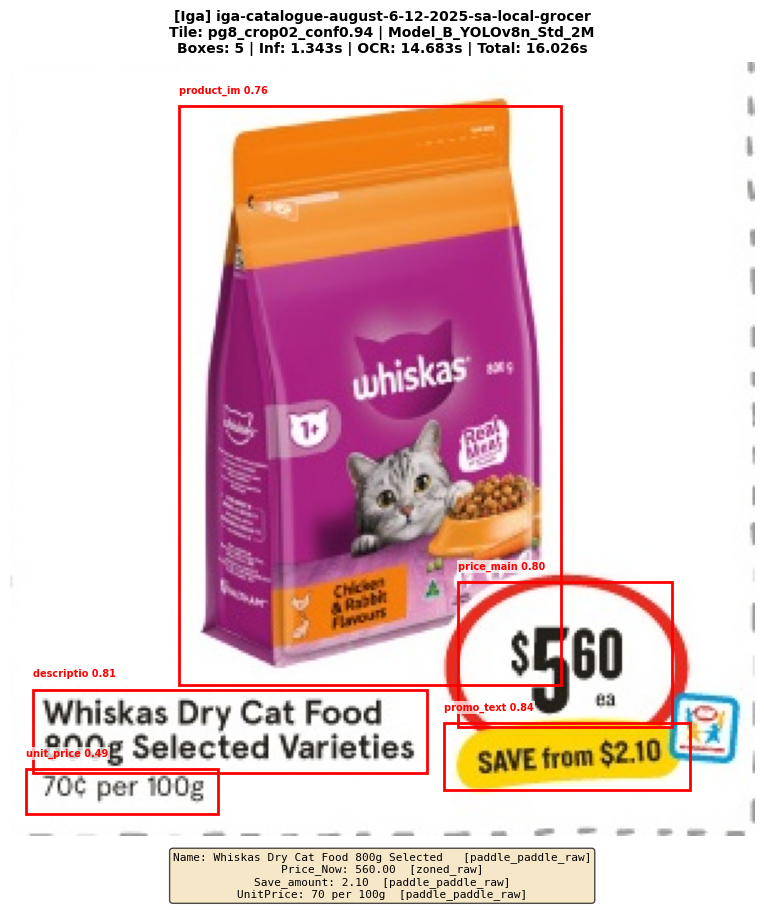


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg8_crop02_conf0.94
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 5
    ───────────────────────────────────────────────────────────────────────────

    [Name]
    ★ WINNER: 'Whiskas Dry Cat Food 800g Selected Varieties' via [paddle_paddle_raw]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_paddle_raw                   Whiskas Dry Cat Food 800      5035 ★
    otsu+psm6_text                      Whiskas Dry Cat Food 800        35
    otsu+psm4_col                       Whiskas Dry Cat Food 800        35
    otsu+psm3_auto                      Whiskas Dry Cat Food 800        35
    otsu_inv+psm6_text                  Whiskas Dry Cat Food 800        35
    otsu_inv+psm4_col                   Whiskas Dry Cat Food 800        35
    otsu_inv+psm3_auto                  Whiskas D

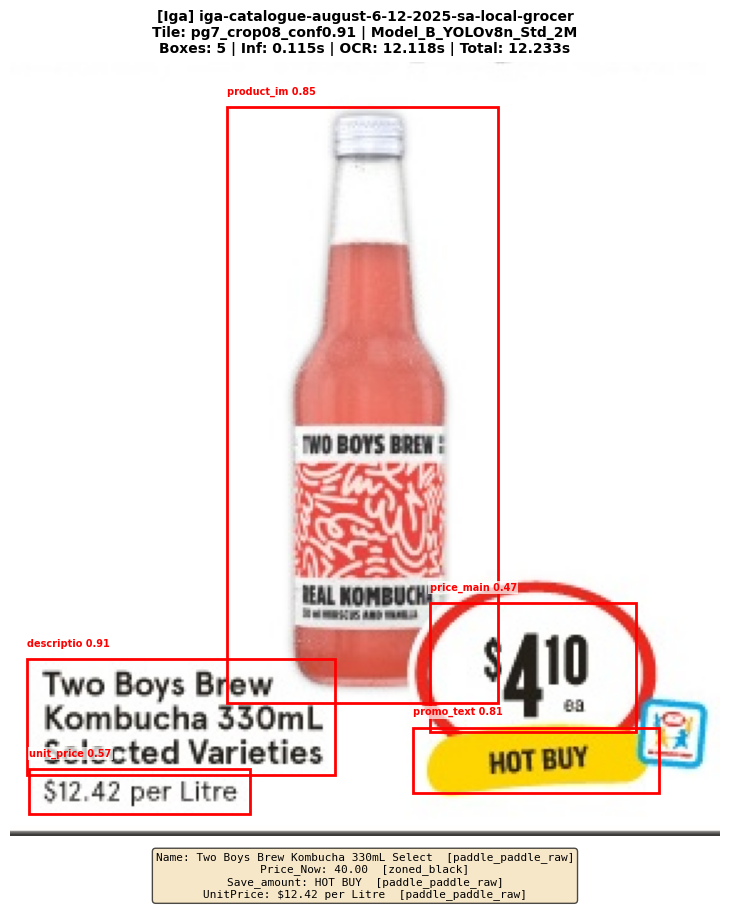


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg7_crop08_conf0.91
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 5
    ───────────────────────────────────────────────────────────────────────────

    [Name]
    ★ WINNER: 'Two Boys Brew Kombucha 330mL Selected Varieties' via [paddle_paddle_raw]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_paddle_raw                   Two Boys Brew Kombucha 3      5038 ★
    adaptive_inv+psm6_text              Two Boys Brew ws Kombuch        40
    otsu+psm6_text                      Two Boys Brew @ Kombucha        38
    otsu+psm4_col                       Two Boys Brew @ Kombucha        38
    otsu+psm3_auto                      Two Boys Brew @ Kombucha        38
    otsu_inv+psm6_text                  Two Boys Brew Kombucha 3        38
    adaptive+psm6_text                  Two Bo

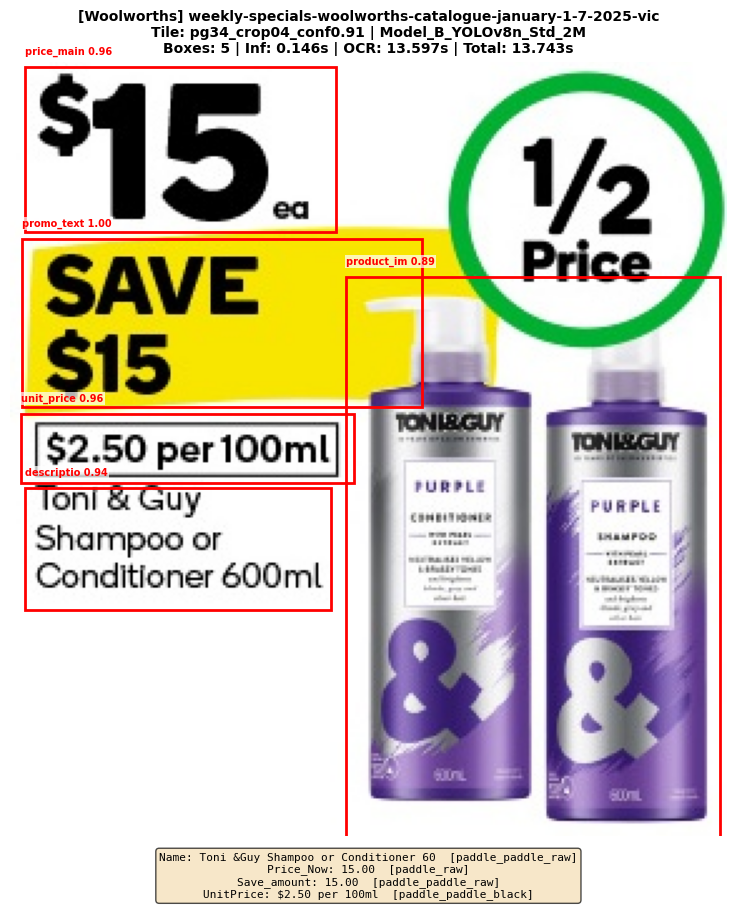


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg34_crop04_conf0.91
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 5
    ───────────────────────────────────────────────────────────────────────────

    [Name]
    ★ WINNER: 'Toni &Guy Shampoo or Conditioner 600ml' via [paddle_paddle_raw]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_paddle_raw                   Toni &Guy Shampoo or Con      5029 ★
    clahe_otsu_inv+psm4_col             font ee Guy Shampoo or C        31
    clahe_otsu_inv+psm3_auto            font ee Guy Shampoo or C        31
    otsu+psm6_text                      Tonl & Guy Shampoo or Co        29
    otsu+psm4_col                       Tonl & Guy Shampoo or Co        29
    otsu+psm3_auto                      Tonl & Guy Shampoo or Co        29
    adaptive_inv+psm6_text              font & Guy Sha

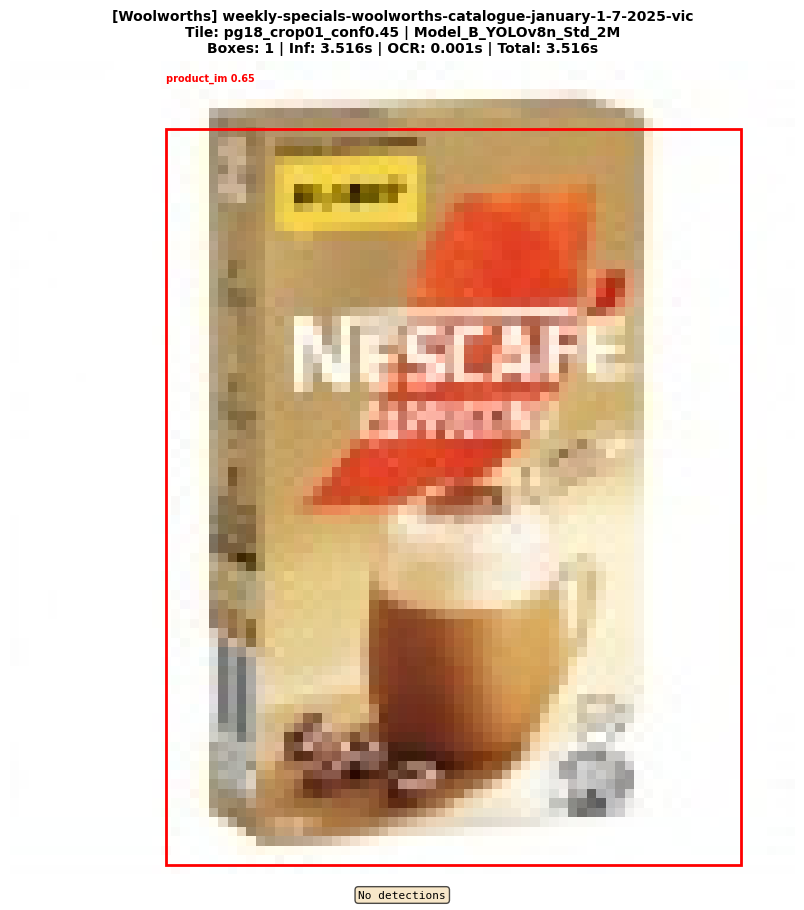


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg18_crop01_conf0.45
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 1
    ───────────────────────────────────────────────────────────────────────────

    [Name] — NOT DETECTED

    [Price_Now] — NOT DETECTED

    [Save_amount] — NOT DETECTED

    [UnitPrice] — NOT DETECTED

    ───────────────────────────────────────────────────────────────────────────
    TIMING: Inf=3.516s | OCR=0.001s | Total=3.516s

  [15/18] Processing tile: pg8_crop03_conf0.91


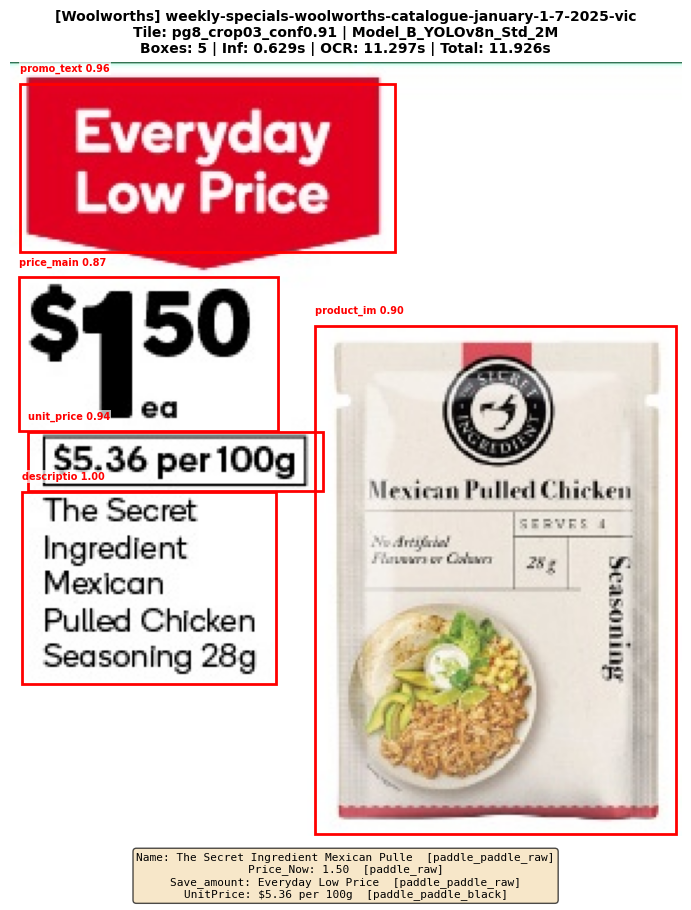


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg8_crop03_conf0.91
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 5
    ───────────────────────────────────────────────────────────────────────────

    [Name]
    ★ WINNER: 'The Secret Ingredient Mexican Pulled Chicken Seasoning 28g' via [paddle_paddle_raw]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_paddle_raw                   The Secret Ingredient Me      5049 ★
    otsu+psm6_text                      The Secret Ingredient Me        49
    otsu+psm4_col                       The Secret Ingredient Me        49
    otsu+psm3_auto                      The Secret Ingredient Me        49
    otsu_inv+psm6_text                  The Secret Ingredient Me        49
    otsu_inv+psm4_col                   The Secret Ingredient Me        49
    otsu_inv+psm3_auto             

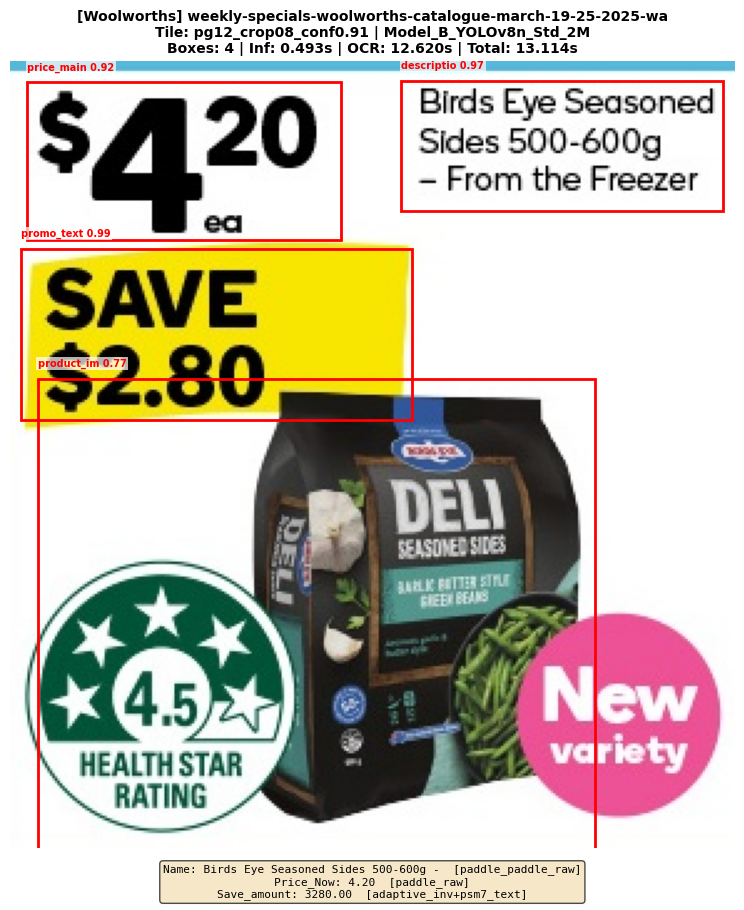


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg12_crop08_conf0.91
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 4
    ───────────────────────────────────────────────────────────────────────────

    [Name]
    ★ WINNER: 'Birds Eye Seasoned Sides 500-600g -From the Freezer' via [paddle_paddle_raw]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_paddle_raw                   Birds Eye Seasoned Sides      5036 ★
    otsu+psm6_text                      Birds Eye Seasoned Sides        36
    otsu+psm4_col                       Birds Eye Seasoned Sides        36
    otsu+psm3_auto                      Birds Eye Seasoned Sides        36
    otsu_inv+psm6_text                  Birds Eye Seasoned| Side        36
    otsu_inv+psm4_col                   Birds Eye Seasoned| Side        36
    otsu_inv+psm3_auto                  B

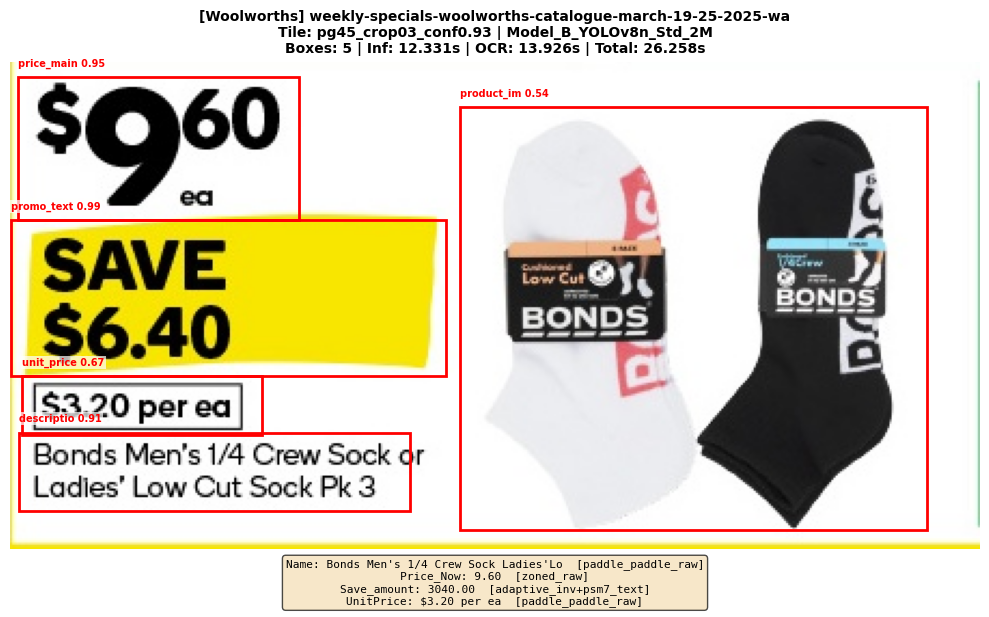


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg45_crop03_conf0.93
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 5
    ───────────────────────────────────────────────────────────────────────────

    [Name]
    ★ WINNER: 'Bonds Men's 1/4 Crew Sock Ladies'Low Cut Sock Pk3' via [paddle_paddle_raw]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_paddle_raw                   Bonds Men's 1/4 Crew Soc      5035 ★
    otsu_inv+psm6_text                  Bonds Men's 1/4 Crew Soc        36
    otsu_inv+psm4_col                   Bonds Men's 1/4 Crew Soc        36
    otsu_inv+psm3_auto                  Bonds Men's 1/4 Crew Soc        36
    adaptive_inv+psm6_text              Bonds Men's 1/4 Crew Soc        36
    adaptive_inv+psm4_col               Bonds Men's 1/4 Crew Soc        36
    adaptive_inv+psm3_auto              Bon

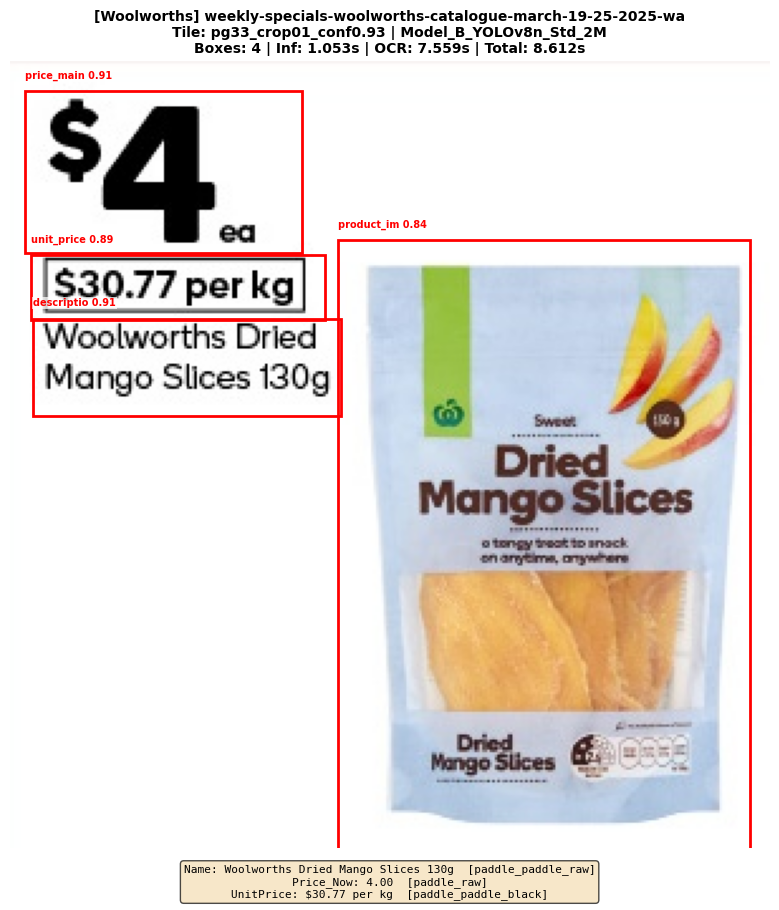


    ───────────────────────────────────────────────────────────────────────────
    OCR RESULTS FOR TILE: pg33_crop01_conf0.93
    Model: Model_B_YOLOv8n_Std_2M | Boxes: 4
    ───────────────────────────────────────────────────────────────────────────

    [Name]
    ★ WINNER: 'Woolworths Dried Mango Slices 130g' via [paddle_paddle_raw]
    Method                              Result                       Score
    ──────────────────────────────────────────────────────────────────────
    paddle_paddle_raw                   Woolworths Dried Mango S      5027 ★
    otsu+psm6_text                      Woolworths Dried Mango S        27
    otsu+psm4_col                       Woolworths Dried Mango S        27
    otsu+psm3_auto                      Woolworths Dried Mango S        27
    otsu_inv+psm6_text                  Woolworths Dried Mango S        27
    adaptive+psm6_text                  Woolworths Dried Mango S        27
    adaptive+psm4_col                   Woolworths Dried M

In [15]:
csv_data, attempt_log = run_benchmark()

In [16]:
df = save_results(csv_data, attempt_log)

SUCCESS: CSV saved to d:\DEAKIN Post Grad Data Science\MASTERS UNITS\DiscountMate_Clone\DiscountMate_new\YOLOv8 Model2 Sub Region Detection\model2_benchmark_results.csv (18 rows)
SUCCESS: Attempt log saved to d:\DEAKIN Post Grad Data Science\MASTERS UNITS\DiscountMate_Clone\DiscountMate_new\YOLOv8 Model2 Sub Region Detection\model2_benchmark_results_attempts.csv (590 rows)

First 10 rows:
  Retailer                                       Catalogue                  Tile                   Model                                                                  Name Price_Now Save_amount PriceWas        UnitPrice      OCR_Method_Name    OCR_Method_Price           OCR_Method_Save OCR_Method_UnitPrice  Num_Boxes  Inference_Time_s  Crop_OCR_Time_s  Total_Time_s
0    Coles     coles-catalogue-august-20-26-2025-qld-metro   pg5_crop06_conf0.89  Model_B_YOLOv8n_Std_2M                               Sunbites Grain Waves 170g $1.47 per100g      2.50      982.00   984.50   $1.47 per 100g    paddle_padd

In [17]:
df

,Retailer,Catalogue,Tile,Model,Name,Price_Now,Save_amount,PriceWas,UnitPrice,OCR_Method_Name,OCR_Method_Price,OCR_Method_Save,OCR_Method_UnitPrice,Num_Boxes,Inference_Time_s,Crop_OCR_Time_s,Total_Time_s
0,Coles,coles-catalogue-august-20-26-2025-qld-metro,pg5_crop06_conf0.89,Model_B_YOLOv8n_Std_2M,Sunbites Grain Waves 170g $1.47 per100g,2.50,982.00,984.50,$1.47 per 100g,paddle_paddle_raw,paddle_black,adaptive+psm7_text,paddle_paddle_raw,5,1.234271,11.547861,12.782132
1,Coles,coles-catalogue-august-20-26-2025-qld-metro,pg9_crop05_conf0.90,Model_B_YOLOv8n_Std_2M,Oral B iO2 Electric Toothbrush White or Black ...,80.00,160.00,240.00,,paddle_paddle_raw,paddle_raw,otsu_inv+psm6_text,,4,0.090440,12.109652,12.200092
2,Coles,coles-catalogue-august-20-26-2025-qld-metro,pg33_crop09_conf0.88,Model_B_YOLOv8n_Std_2M,Great Ocean Road Cheese Block 500g $18.00 per kg,9.00,10.30,19.30,,paddle_paddle_raw,paddle_raw,paddle_paddle_raw,,4,0.020121,9.360365,9.380486
3,Coles,coles-catalogue-february-18-25-2025-nsw-metro,pg21_crop01_conf0.93,Model_B_YOLOv8n_Std_2M,Bhuja Mix 140g-160g,26.00,3.00,29.00,,paddle_paddle_raw,paddle_raw,paddle_paddle_raw,,4,0.157061,7.780881,7.937943
4,Coles,coles-catalogue-february-18-25-2025-nsw-metro,pg26_crop02_conf0.50,Model_B_YOLOv8n_Std_2M,Cucina Matese Pasta Sauce or Pesto 290g-550g,3.50,440.00,443.50,,paddle_paddle_raw,paddle_raw_spatial,clahe_otsu_inv+psm6_text,,4,0.093701,10.759550,10.853251
5,Coles,coles-catalogue-february-18-25-2025-nsw-metro,pg19_crop01_conf0.86,Model_B_YOLOv8n_Std_2M,,2.25,2.25,4.50,,,paddle_raw_spatial,paddle_paddle_raw,,3,1.780926,5.049455,6.830381
6,Iga,iga-catalogue-april-9-15-2025-vic-large-v2,pg37_crop11_conf0.88,Model_B_YOLOv8n_Std_2M,,290.00,2.00,292.00,18C each,,zoned_raw,paddle_paddle_raw,paddle_paddle_raw,4,0.112165,6.414285,6.526450
7,Iga,iga-catalogue-april-9-15-2025-vic-large-v2,pg9_crop10_conf0.79,Model_B_YOLOv8n_Std_2M,Wonder White or Wholemeal Bread 680-700g Selec...,450.00,1.00,451.00,,paddle_paddle_raw,zoned_black,otsu_inv+psm6_text,,3,0.156821,8.529036,8.685858
8,Iga,iga-catalogue-april-9-15-2025-vic-large-v2,pg37_crop01_conf0.92,Model_B_YOLOv8n_Std_2M,"Johnsan's Baby Bath, Lotion, Oil or Shampoo 50...",8.00,83.00,91.00,$1.60 per 100mL,paddle_paddle_black,paddle_raw,clahe_otsu+psm7_text,paddle_paddle_raw,5,0.115862,10.688523,10.804384
9,Iga,iga-catalogue-august-6-12-2025-sa-local-grocer,pg5_crop10_conf0.89,Model_B_YOLOv8n_Std_2M,Red Rock Deli Chips 150-165g Selected Varieties,45.00,HOT BUY,,,paddle_paddle_raw,zoned_black_agg,paddle_paddle_raw,,4,0.139248,11.190132,11.329380
